In [168]:
### importing all the necessary libaries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [169]:
## libraries for natural language processing
import re 
import string
import nltk
import warnings
from nltk.stem.porter import PorterStemmer

In [170]:
%matplotlib inline

In [171]:
warnings.filterwarnings('ignore')

In [172]:
tornado_data = pd.read_csv("./dataset/2011Tornado_Summary.csv")
sandy_data = pd.read_csv("./dataset/2012Sandy_Summary.csv")
floods_data = pd.read_csv("./dataset/2013Floods_Summary.csv")
blizzard_data = pd.read_csv("./dataset/2016Blizzard_Summary.csv")
matthew_data = pd.read_csv("./dataset/2016Matthew_Summary.csv")
hurricane_data = pd.read_csv("./dataset/2017Hurricane_Summary.csv")
michael_data = pd.read_csv("./dataset/2018Michael_Summary.csv")
wildfires_data = pd.read_csv("./dataset/2018Wildfires_Summary.csv")
dorian_data = pd.read_csv("./dataset/2019Dorian_Summary.csv")

In [173]:
tornado_data.head()

,num,text,timestamp,label
0,0,RT @uberdogfound: Please RT - Food needed for ...,40657.975000,1
1,1,Please RT - Food needed for shelter in NC in a...,40657.975000,1
2,3,‚ô°its raining and tornado warnings....about t...,40657.897917,1
3,9,Lmao #damn RT @LuCeCaNNoNn: If I don't get any...,40657.766667,1
4,10,Saved by the tornado warning....I'm just ready...,40657.756250,0


In [174]:
sandy_data.head()

,num,text,timestamp,label
0,23933298,They make Hurricane Sandy sound like a big dea...,41209.64722,1
1,619454798,The kitchen was out of mad food tonight so I t...,41213.17083,1
2,885698120,Hundreds if not thousands of people lost their...,41213.16736,1
3,145900244,“@_KingDing_ALing: My TL right now:\n-The Heat...,41213.15625,1
4,477093805,#YouGainMajorPointsIf you go to dollarama whil...,41213.14375,0


In [175]:
floods_data.head()

,num,text,timestamp,label
0,2,"It's Ok, Manchester's off flood alert. Fat cho...",41525.786111,0
1,3,"Love how you ask for a tiny bit of sauce, and ...",41525.773611,0
2,4,Dif tailgate!! Morning games and good food. Im...,41525.707639,0
3,8,"As much food as I've eaten today, I'm going to...",41525.697222,0
4,11,‚Äú@____Reece: Can't wait for the 'I'm hanging...,41525.411806,0


In [176]:
blizzard_data.head()

,num,text,timestamp,label
0,1945,& : US eastcoast had a historic blizzard.18 ...,1/25/16 15:27,1
1,1239,brixcitygurl: CAN YOU FIND THE CAR? #blizzard...,1/28/16 00:46,1
2,455,Snow blizzard in NY ! It took us a week to ge...,1/31/16 14:00,1
3,623,Snow Painting Spray bottle with a few drops ...,1/26/16 17:46,1
4,48,Stony Brook Medicine residents covering the u...,1/24/16 19:06,1


In [177]:
matthew_data.head()

,num,text,timestamp,label
0,2.610788e+09,"With my Love of my Life, my Bride, on the eve ...",42643.97847,0
1,1.146274e+09,Time for us to start getting ready for Hurrica...,42643.60903,0
2,1.806634e+07,Hurricane Tips #food #hurricane #matthew #remi...,42643.54861,1
3,2.610788e+09,"With my Love of my Life, my Bride, on the eve ...",42643.97847,0
4,1.146274e+09,Time for us to start getting ready for Hurrica...,42643.60903,0


In [178]:
hurricane_data.head()

,num,text,timestamp,label
0,2,Your hurricane emergency kit should include at...,42964.60069,1
1,3,"Eclipse: overrated, over-hyped, schools are be...",42964.58264,1
2,9,Your hurricane emergency kit should include at...,42964.60069,1
3,10,"Eclipse: overrated, over-hyped, schools are be...",42964.58264,1
4,14,I wanna go back to New Orleans so bad I wanna...,42961.76319,1


In [179]:
michael_data.head()

,Unnamed: 0,text,timestamp,sentiment
0,0,Keeping our eyes in Hurricane Michael as it he...,10/8/18 23:37,0
1,1,Tallahassee prepares for Hurricane Michael wit...,10/8/18 21:30,1
2,2,Just spent half a day at Costco and grocery st...,10/8/18 21:04,1
3,3,Hurricane Michael just allow us to get those f...,10/8/18 19:38,1
4,4,"If you are in Hurricane Michael's path, here i...",10/8/18 19:24,0


In [180]:
wildfires_data.head()

,num,text,timestamp,label
0,1831,\n\nEntertainment Tonight: Dave Grohl Deliver...,43418.55139,1
1,915,Residents are oftentimes left no choice but...,43318.62153,1
2,971,HEADLINES BLAME THIS ON ‚ÄúWILDFIRE‚Äù ‚Äî\n...,43427.82917,1
3,804,‚ÄúAlmost 200 Australian and NZ firefighters ...,43315.81181,1
4,1299,‚ÄúPolice arrest suspect for setting off mass...,43321.93889,1


In [181]:
## replacing the sentiment column as label for michael_data and unnamed column as num
michael_data.rename(columns = {'Unnamed: 0':'num', 'sentiment':'label'}, inplace = True)
michael_data.head()

,num,text,timestamp,label
0,0,Keeping our eyes in Hurricane Michael as it he...,10/8/18 23:37,0
1,1,Tallahassee prepares for Hurricane Michael wit...,10/8/18 21:30,1
2,2,Just spent half a day at Costco and grocery st...,10/8/18 21:04,1
3,3,Hurricane Michael just allow us to get those f...,10/8/18 19:38,1
4,4,"If you are in Hurricane Michael's path, here i...",10/8/18 19:24,0


In [182]:
dorian_data.head()

,num,text,timestamp,label
0,5.677583e+08,The governor of PR Wanda Vazquez just made a s...,43703.98333,1
1,5.677583e+08,The governor of PR Wanda Vazquez just made a s...,43703.98333,1
2,1.004725e+09,To my family and friends who live in the path ...,43705.96528,0
3,3.278573e+07,My colleague @LizBalmaseda with some food tips...,43705.93264,1
4,1.020000e+18,Hurricane #Dorian #Newadvisory \ntime to prepa...,43705.92292,1


In [183]:
## storing all the dataset in an dictionary so we can utilize for loop to iterate through all the dataset or specific whenever we need
data_dict = {
    "tornado_data": tornado_data,
    "sandy_data": sandy_data,
    "floods_data": floods_data,
    "blizzard_data": blizzard_data,
    "matthew_data": matthew_data,
    "hurricane_data": hurricane_data,
    "michael_data": michael_data,
    "wildfires_data": wildfires_data,
    "dorian_data": dorian_data
}


In [184]:
print(data_dict)

{'tornado_data':       num                                               text     timestamp  \
0       0  RT @uberdogfound: Please RT - Food needed for ...  40657.975000   
1       1  Please RT - Food needed for shelter in NC in a...  40657.975000   
2       3  ‚ô°its raining and tornado warnings....about t...  40657.897917   
3       9  Lmao #damn RT @LuCeCaNNoNn: If I don't get any...  40657.766667   
4      10  Saved by the tornado warning....I'm just ready...  40657.756250   
...   ...                                                ...           ...   
3567   39  Thanks to @BarackObama and @SethMeyers21 for m...  40664.134028   
3568    0  Stamford-based AmeriCares is preparing to send...  40663.670139   
3569    2  Semi-trailer parked at People's Church Spring ...  40662.943750   
3570    3  RT @TopNoTcH_B1tch: My mom is goin out of town...  40662.732639   
3571    6  Volunteers Offer Support to Southern Tornado V...  40664.518056   

      label  
0         1  
1         1  
2   

#### Checking the shape of each dataset

In [185]:
shapes_list = []
for name, data in data_dict.items():
    shapes_list.append(f"Shape of the {name} dataset: {data.shape}")

print("\n".join(shapes_list))

Shape of the tornado_data dataset: (3572, 4)
Shape of the sandy_data dataset: (2190, 4)
Shape of the floods_data dataset: (3597, 4)
Shape of the blizzard_data dataset: (3649, 4)
Shape of the matthew_data dataset: (5204, 4)
Shape of the hurricane_data dataset: (7823, 4)
Shape of the michael_data dataset: (4227, 4)
Shape of the wildfires_data dataset: (4596, 4)
Shape of the dorian_data dataset: (7140, 4)


##### from above shape() function we can conclude that every dataset has 4 feature column present

### Checking if there is any null value present

In [186]:
null_values_list = []
for name, data in data_dict.items():
    # Count null values in each dataset
    null_counts = data.isnull().sum().sum()
    null_values_list.append(f"Null values in the {name} dataset: {null_counts}")
print("\n".join(null_values_list))

Null values in the tornado_data dataset: 0
Null values in the sandy_data dataset: 0
Null values in the floods_data dataset: 0
Null values in the blizzard_data dataset: 0
Null values in the matthew_data dataset: 0
Null values in the hurricane_data dataset: 0
Null values in the michael_data dataset: 0
Null values in the wildfires_data dataset: 0
Null values in the dorian_data dataset: 0


##### from above we can say that our data does not present any null values

### Since our feature column do not have any statistical meaning as we are dealing with text and language, so I think there is no point doing data.describe() method to show statistical summary of the dataset.

### Checking for the duplicate value present in each dataset

In [187]:
duplicate_values_list = []

for name, data in data_dict.items():
    # Count duplicate rows in each dataset
    duplicate_counts = data.duplicated().sum()
    duplicate_values_list.append(f"Duplicate values in the {name} dataset: {duplicate_counts}")
print("\n".join(duplicate_values_list))


Duplicate values in the tornado_data dataset: 0
Duplicate values in the sandy_data dataset: 0
Duplicate values in the floods_data dataset: 0
Duplicate values in the blizzard_data dataset: 0
Duplicate values in the matthew_data dataset: 685
Duplicate values in the hurricane_data dataset: 0
Duplicate values in the michael_data dataset: 0
Duplicate values in the wildfires_data dataset: 0
Duplicate values in the dorian_data dataset: 1348


##### from this we can say that Matthew and dorian dataset have some amount of duplicacy of the data present. However, other data sets do not have any duplicate value present

In [188]:
duplicate_removal_list = []

for name, data in data_dict.items():
    # counts duplicates before dropping
    duplicate_count_before = data.duplicated().sum()
    # drops duplicates in place
    data.drop_duplicates(inplace=True)
    # counts duplicates after dropping to confirm
    duplicate_count_after = data.duplicated().sum()
    duplicate_removal_list.append(
        f"Duplicate values in the {name} dataset: {duplicate_count_before} (Removed: {duplicate_count_before - duplicate_count_after})"
    )
print("\n".join(duplicate_removal_list))


Duplicate values in the tornado_data dataset: 0 (Removed: 0)
Duplicate values in the sandy_data dataset: 0 (Removed: 0)
Duplicate values in the floods_data dataset: 0 (Removed: 0)
Duplicate values in the blizzard_data dataset: 0 (Removed: 0)
Duplicate values in the matthew_data dataset: 685 (Removed: 685)
Duplicate values in the hurricane_data dataset: 0 (Removed: 0)
Duplicate values in the michael_data dataset: 0 (Removed: 0)
Duplicate values in the wildfires_data dataset: 0 (Removed: 0)
Duplicate values in the dorian_data dataset: 1348 (Removed: 1348)


In [189]:
# replacing labels with positive and negative for sentiment
replacement_dict = {1: 'negative', 0: 'positive'}

# loop over each dataset in the dictionary
for name, data in data_dict.items():
    # Replace values in the 'label' column and ensure changes are made in place
    if 'label' in data.columns:
        data['label'].replace(replacement_dict, inplace=True)
        print(f"Replaced labels in the '{name}' dataset.")
    else:
        print(f"No 'label' column in the '{name}' dataset.")


Replaced labels in the 'tornado_data' dataset.
Replaced labels in the 'sandy_data' dataset.
Replaced labels in the 'floods_data' dataset.
Replaced labels in the 'blizzard_data' dataset.
Replaced labels in the 'matthew_data' dataset.
Replaced labels in the 'hurricane_data' dataset.
Replaced labels in the 'michael_data' dataset.
Replaced labels in the 'wildfires_data' dataset.
Replaced labels in the 'dorian_data' dataset.


### Plotting a bar plot to show the distribution of positive and negative tweets in all the datasets from 2011 to 2019

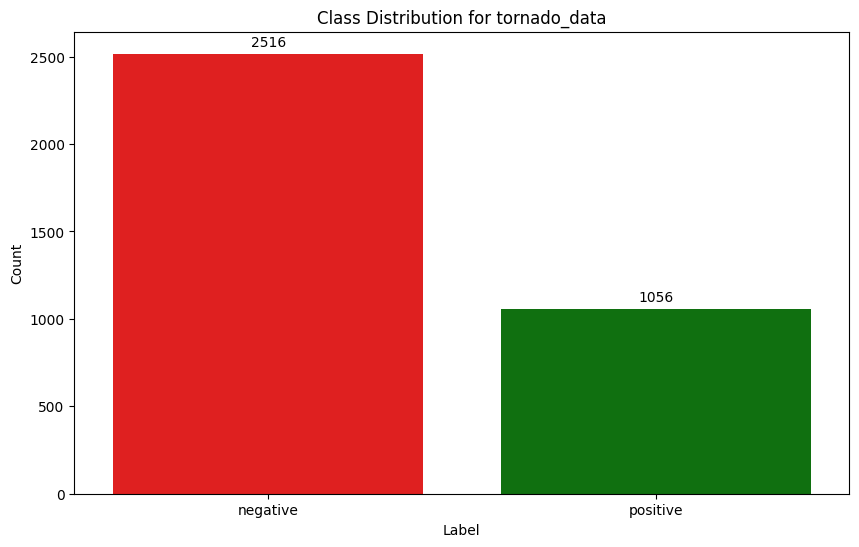

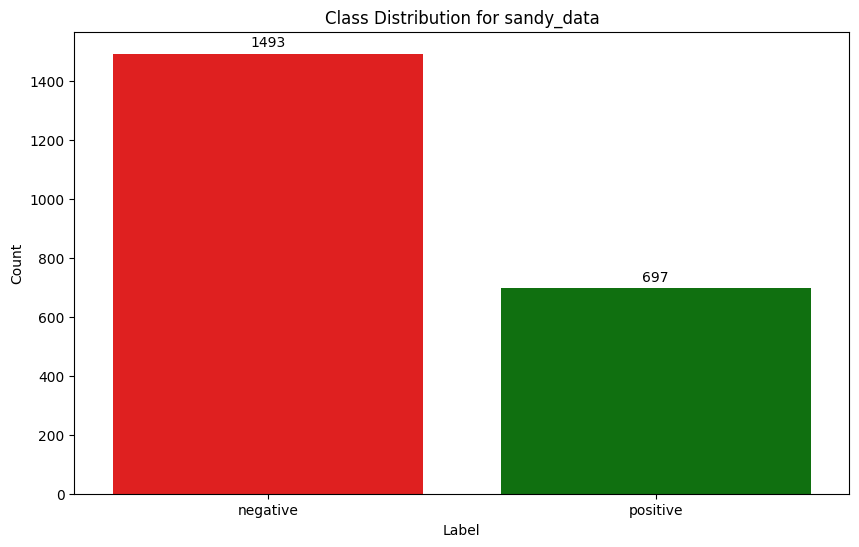

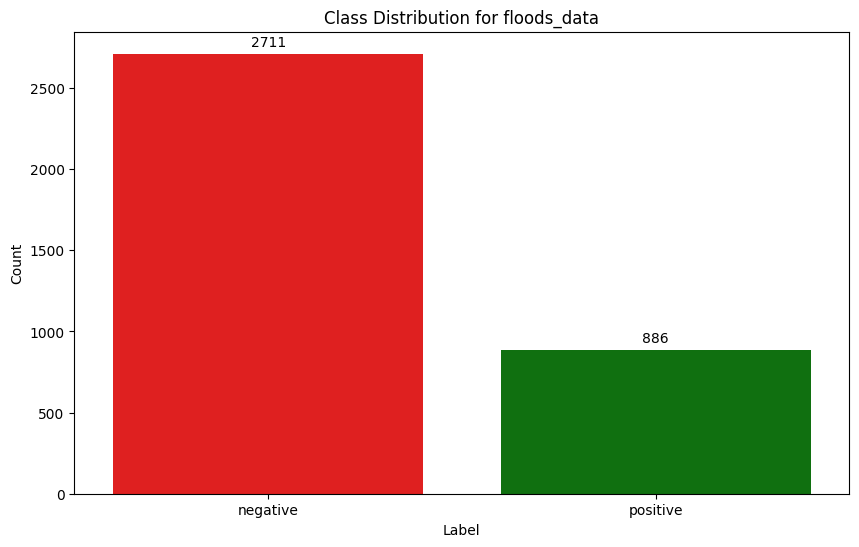

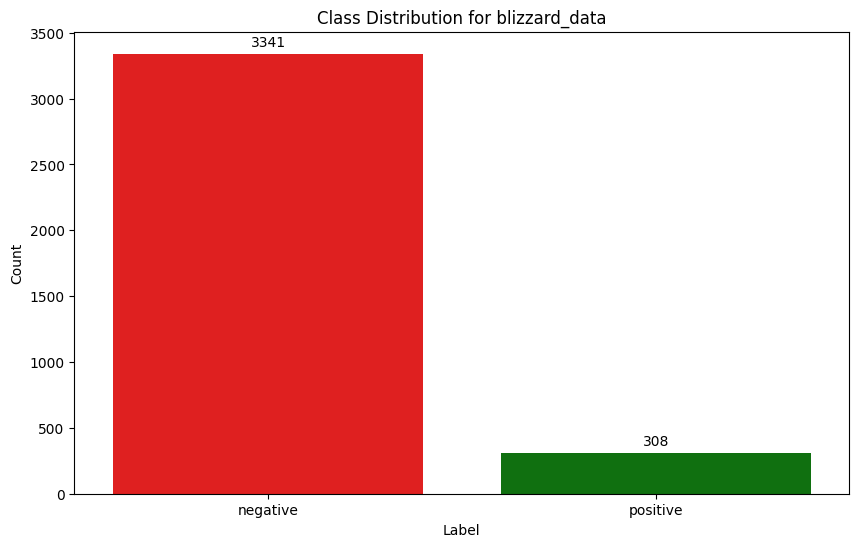

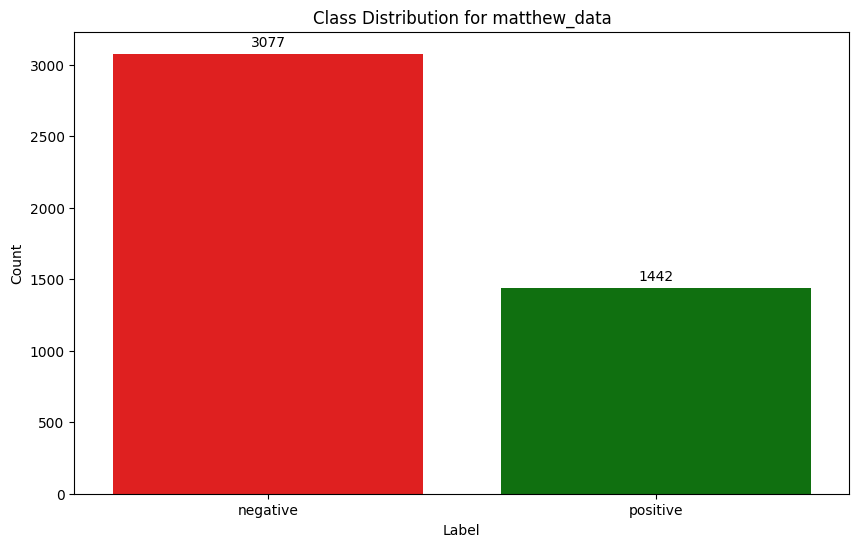

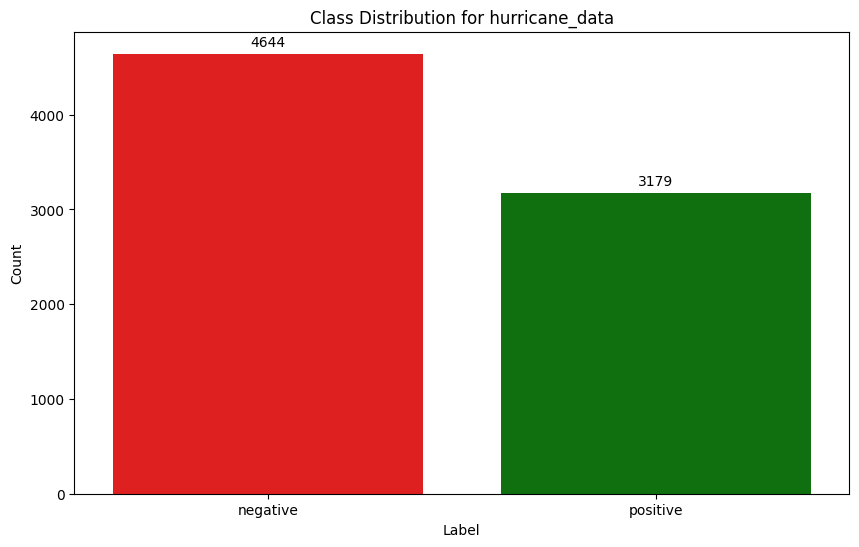

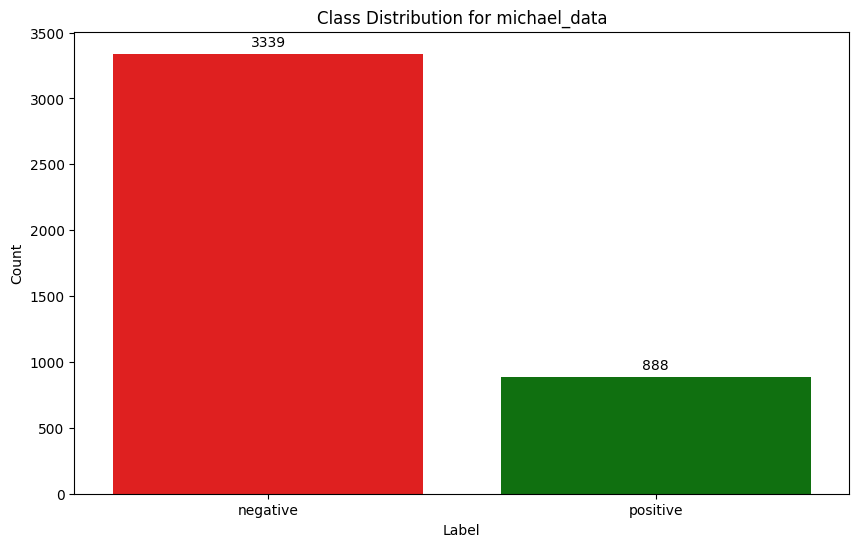

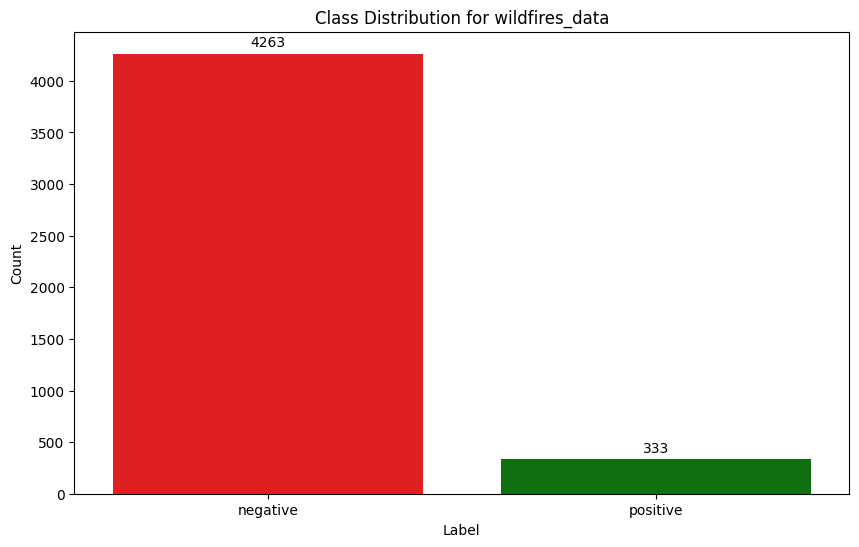

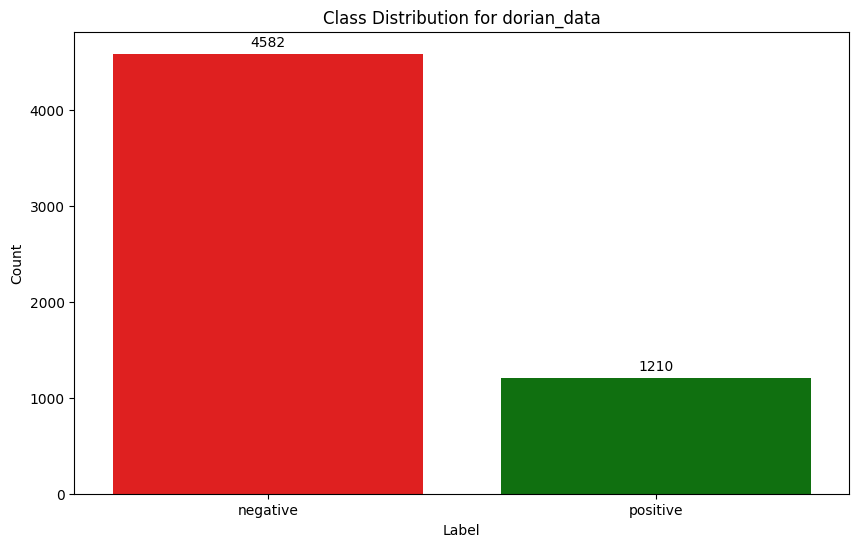

In [190]:
def distribution_plot(x, y, name):
    plt.figure(figsize=(10, 6))
    
    # Set colors based on labels
    colors = ['red' if label == 'negative' else 'green' for label in x]
    
    # Create the bar plot with custom colors
    sns.barplot(x=x, y=y, palette=colors)
    plt.title(name)
    plt.xlabel("Label")
    plt.ylabel("Count")
    
    # Add counts on top of each bar
    for i, count in enumerate(y):
        plt.text(i, count + max(y) * 0.01, f'{count}', ha='center', va='bottom', fontsize=10)
    
    plt.show()

# Iterate over each dataset in the dictionary and plot the distribution if 'label' column exists
for name, data in data_dict.items():
    if 'label' in data.columns:
        # Calculate the value counts for the 'label' column
        dist = data['label'].value_counts()
        # Plot the distribution
        distribution_plot(x=dist.index, y=dist.values, name=f'Class Distribution for {name}')
    else:
        print(f"No 'label' column in the '{name}' dataset.")

### The bar chart above represents the number of class distributions per dataset, for all the dataset we do have higher number of positive tweets and low number of negative tweets present in the tweet table. 

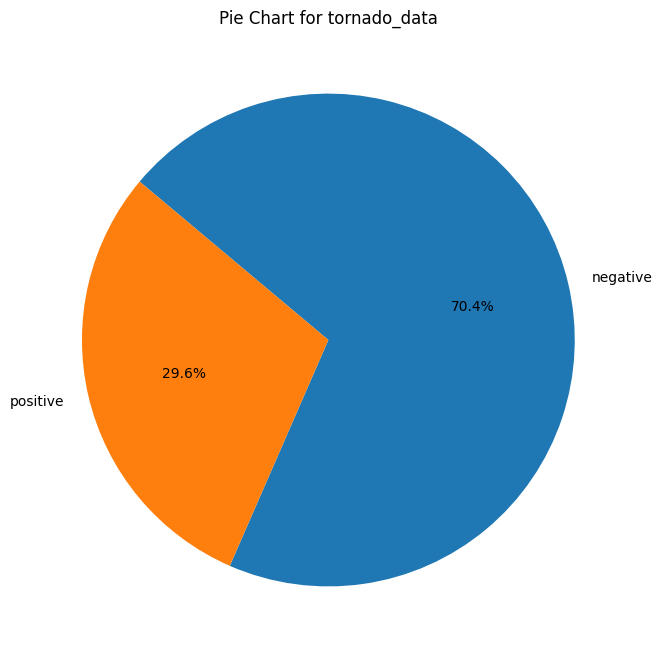

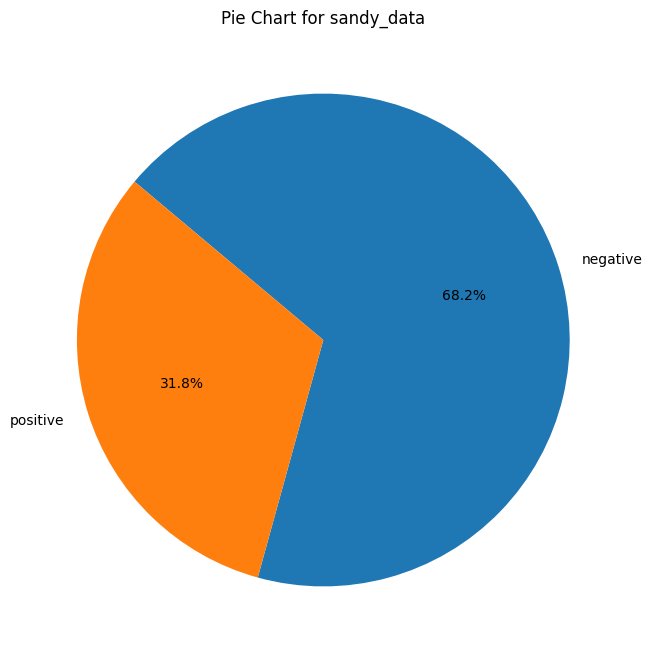

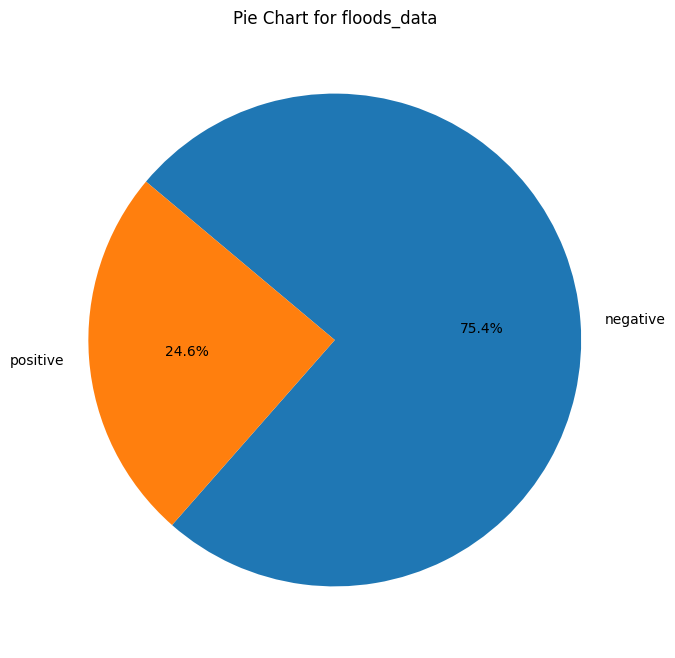

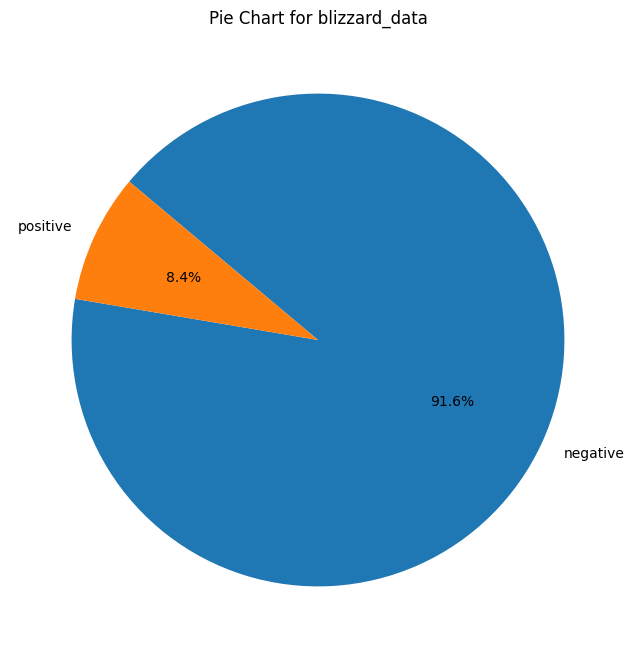

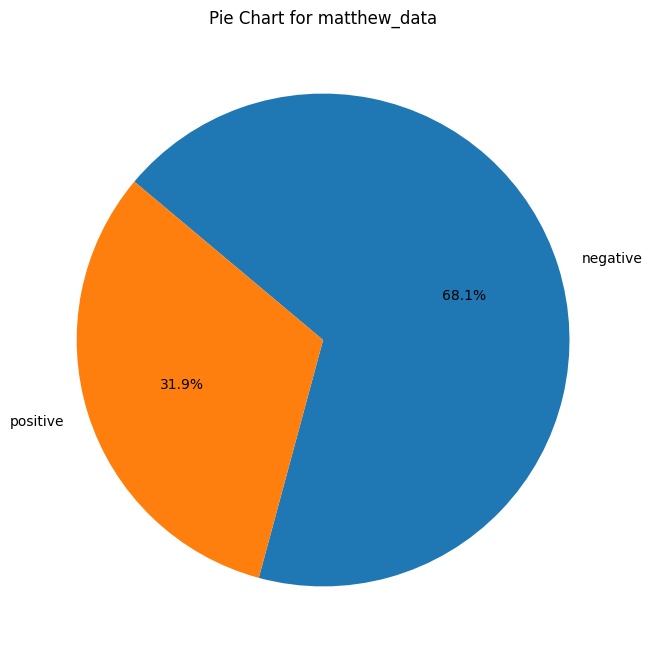

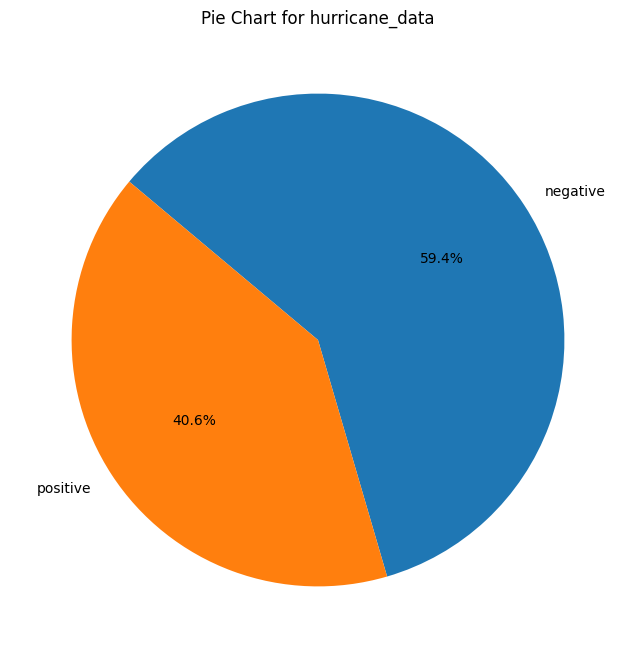

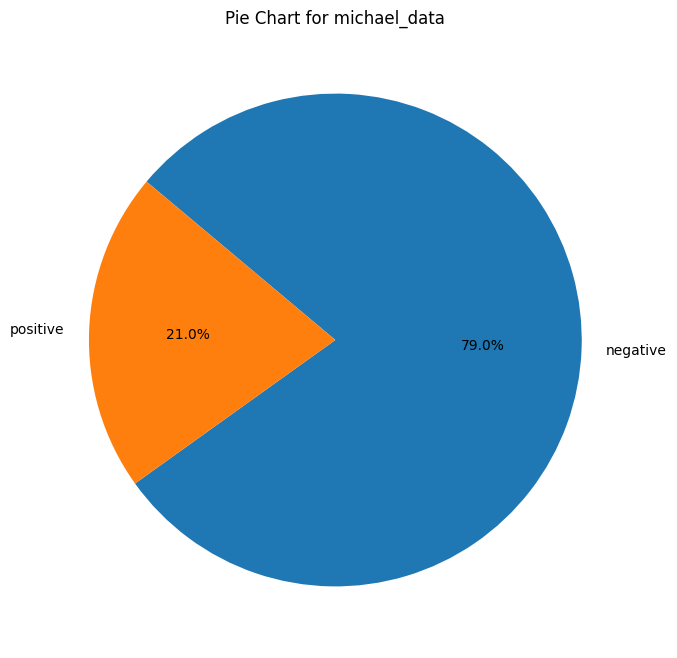

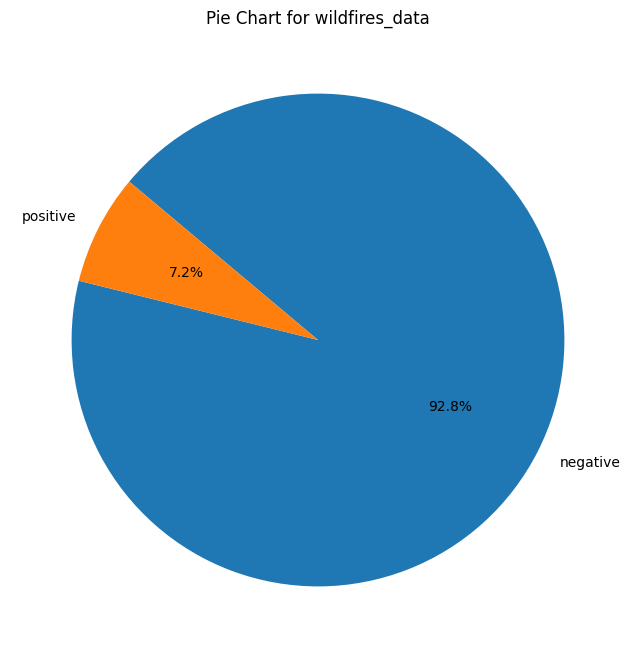

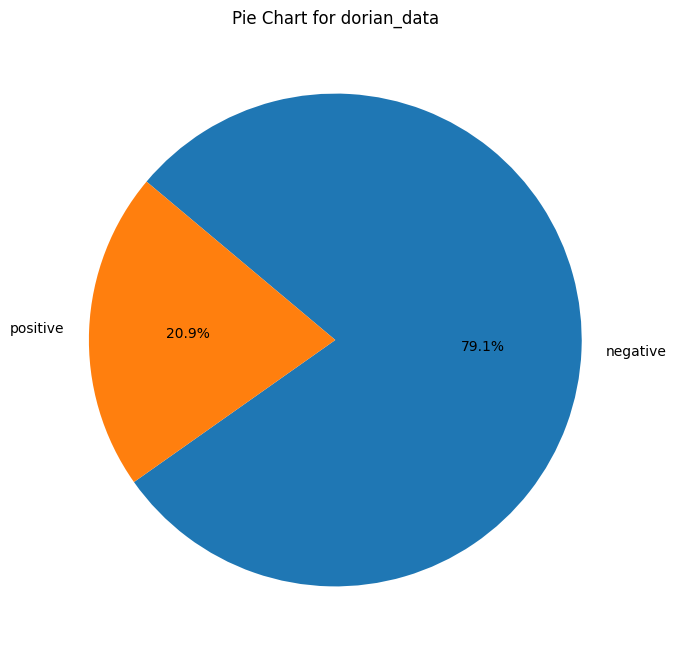

In [191]:
def distribution_pie_chart(labels, counts, name):
    plt.figure(figsize=(8, 8))
    # Plot the pie chart with percentages
    plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=140, counterclock=False)
    plt.title(f"{name}")
    plt.show()


# Iterate over each dataset in the dictionary and plot the distribution if 'label' column exists
for name, data in data_dict.items():
    if 'label' in data.columns:
        # Calculate the value counts for the 'label' column
        dist = data['label'].value_counts()
        # Plot the pie chart for the distribution
        distribution_pie_chart(labels=dist.index, counts=dist.values, name=f'Pie Chart for {name}')
    else:
        print(f"No 'label' column in the '{name}' dataset.")
        
        
        


### removing the num and timestamp column from dataset as they do not provide any meaningful or significant importance.
### renaming our text column as tweet column

In [192]:
columns_to_remove = ['num', 'timestamp']

# Iterate over each dataset in the dictionary
for name, data in data_dict.items():
    # Check if both columns exist in the dataset and drop them
    data.drop(columns=[col for col in columns_to_remove if col in data.columns], inplace=True)
    print(f"Removed columns from '{name}' dataset if they existed.")
    print("\n" + "-"*40)
    # Rename 'text' column to 'tweets' if it exists
    if 'text' in data.columns:
        data.rename(columns={'text': 'tweets'}, inplace=True)
        print(f"Renamed 'text' column to 'tweets' in '{name}' dataset.")

Removed columns from 'tornado_data' dataset if they existed.

----------------------------------------
Renamed 'text' column to 'tweets' in 'tornado_data' dataset.
Removed columns from 'sandy_data' dataset if they existed.

----------------------------------------
Renamed 'text' column to 'tweets' in 'sandy_data' dataset.
Removed columns from 'floods_data' dataset if they existed.

----------------------------------------
Renamed 'text' column to 'tweets' in 'floods_data' dataset.
Removed columns from 'blizzard_data' dataset if they existed.

----------------------------------------
Renamed 'text' column to 'tweets' in 'blizzard_data' dataset.
Removed columns from 'matthew_data' dataset if they existed.

----------------------------------------
Renamed 'text' column to 'tweets' in 'matthew_data' dataset.
Removed columns from 'hurricane_data' dataset if they existed.

----------------------------------------
Renamed 'text' column to 'tweets' in 'hurricane_data' dataset.
Removed columns 

In [193]:
tornado_data.head()

,tweets,label
0,RT @uberdogfound: Please RT - Food needed for ...,negative
1,Please RT - Food needed for shelter in NC in a...,negative
2,‚ô°its raining and tornado warnings....about t...,negative
3,Lmao #damn RT @LuCeCaNNoNn: If I don't get any...,negative
4,Saved by the tornado warning....I'm just ready...,positive


###  The next step is to preproces the data

In [194]:
#removes pattern in the input text
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for word in r:
        input_txt = re.sub(word, "", input_txt)
    return input_txt

### Creating a function to remove words with length less than 3

In [195]:
def remove_short_words(text):
    return " ".join([word for word in text.split() if len(word) >= 3])


In [196]:
floods_data.head()

,tweets,label
0,"It's Ok, Manchester's off flood alert. Fat cho...",positive
1,"Love how you ask for a tiny bit of sauce, and ...",positive
2,Dif tailgate!! Morning games and good food. Im...,positive
3,"As much food as I've eaten today, I'm going to...",positive
4,‚Äú@____Reece: Can't wait for the 'I'm hanging...,positive


#### this block of code is used to remove twitter handle from the tweets and is used to clean the tweets

In [197]:
for name, data in data_dict.items():
    # Check if 'tweets' column exists
    if 'tweets' in data.columns: 
        ## renove_pattern() function is used 
        data["clean_tweet"] = np.vectorize(remove_pattern)(data["tweets"], "@[\w]*")
        print(f"Cleaned tweets in '{name}' dataset.")
    else:
        print(f"No 'Tweets' column in the '{name}' dataset.")

Cleaned tweets in 'tornado_data' dataset.
Cleaned tweets in 'sandy_data' dataset.
Cleaned tweets in 'floods_data' dataset.
Cleaned tweets in 'blizzard_data' dataset.
Cleaned tweets in 'matthew_data' dataset.
Cleaned tweets in 'hurricane_data' dataset.
Cleaned tweets in 'michael_data' dataset.
Cleaned tweets in 'wildfires_data' dataset.
Cleaned tweets in 'dorian_data' dataset.


In [198]:
floods_data.head()

,tweets,label,clean_tweet
0,"It's Ok, Manchester's off flood alert. Fat cho...",positive,"It's Ok, Manchester's off flood alert. Fat cho..."
1,"Love how you ask for a tiny bit of sauce, and ...",positive,"Love how you ask for a tiny bit of sauce, and ..."
2,Dif tailgate!! Morning games and good food. Im...,positive,Dif tailgate!! Morning games and good food. Im...
3,"As much food as I've eaten today, I'm going to...",positive,"As much food as I've eaten today, I'm going to..."
4,‚Äú@____Reece: Can't wait for the 'I'm hanging...,positive,‚Äú: Can't wait for the 'I'm hanging' and 'nee...


In [199]:
from langdetect import detect, LangDetectException
## langdetect uses a language profile model based on n-grams (sequences of characters) from a large corpus of text in multiple languages.

from collections import defaultdict

# Dictionary to store language analysis results for each dataset
language_analysis = {}

# Loop through each dataset in data_dict
for name, data in data_dict.items():
    # Counter for English and detailed non-English languages
    english_count = 0
    non_english_count = defaultdict(int)  # Store counts for each non-English language
    
    # Check each tweet in the clean_tweet column
    for tweet_text in data['clean_tweet']:
        try:
            # Detect language
            language = detect(tweet_text)
            
            # Increment counters based on detected language
            if language == 'en':
                english_count += 1
            else:
                non_english_count[language] += 1  # Track specific non-English languages
        except LangDetectException:
            # If language detection fails, classify as unknown
            non_english_count['unknown'] += 1
    
    # Store results for this dataset
    language_analysis[name] = {
        "English_Tweets": english_count,
        "Non_English_Tweets": dict(non_english_count)  # Convert defaultdict to dict for clarity
    }

# Display the results
print(language_analysis)


{'tornado_data': {'English_Tweets': 3556, 'Non_English_Tweets': {'pt': 4, 'so': 3, 'vi': 1, 'et': 1, 'es': 4, 'it': 1, 'sv': 2}}, 'sandy_data': {'English_Tweets': 2187, 'Non_English_Tweets': {'so': 1, 'nl': 1, 'hr': 1}}, 'floods_data': {'English_Tweets': 3574, 'Non_English_Tweets': {'da': 2, 'so': 3, 'af': 1, 'de': 5, 'tl': 1, 'id': 1, 'nl': 4, 'es': 1, 'cy': 4, 'fr': 1}}, 'blizzard_data': {'English_Tweets': 3636, 'Non_English_Tweets': {'de': 5, 'it': 3, 'et': 1, 'nl': 2, 'da': 2}}, 'matthew_data': {'English_Tweets': 4518, 'Non_English_Tweets': {'da': 1}}, 'hurricane_data': {'English_Tweets': 7733, 'Non_English_Tweets': {'de': 8, 'vi': 76, 'pt': 1, 'ca': 1, 'so': 1, 'it': 2, 'es': 1}}, 'michael_data': {'English_Tweets': 4218, 'Non_English_Tweets': {'de': 1, 'vi': 8}}, 'wildfires_data': {'English_Tweets': 4591, 'Non_English_Tweets': {'de': 3, 'af': 1, 'da': 1}}, 'dorian_data': {'English_Tweets': 5770, 'Non_English_Tweets': {'vi': 14, 'de': 7, 'nl': 1}}}


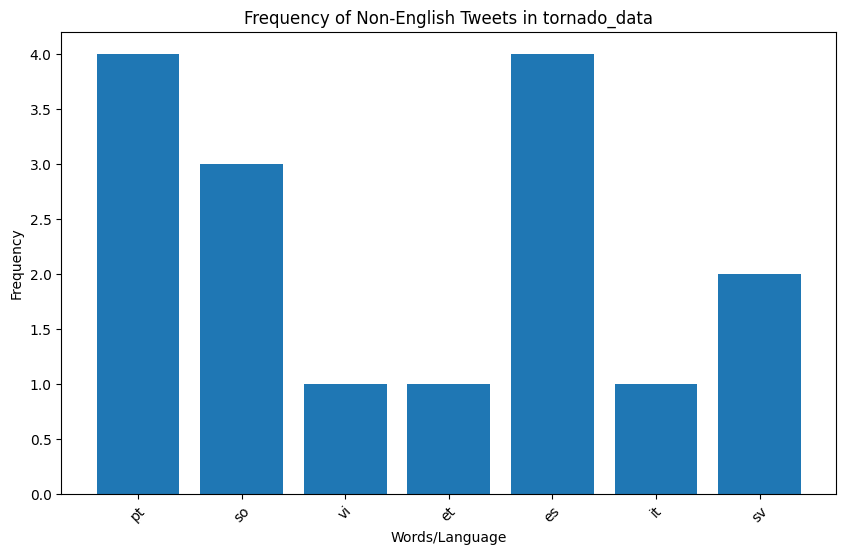

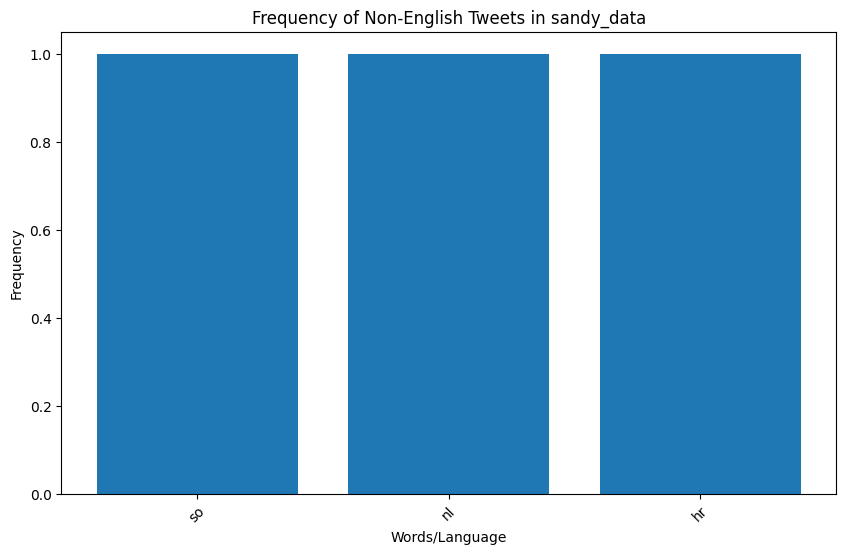

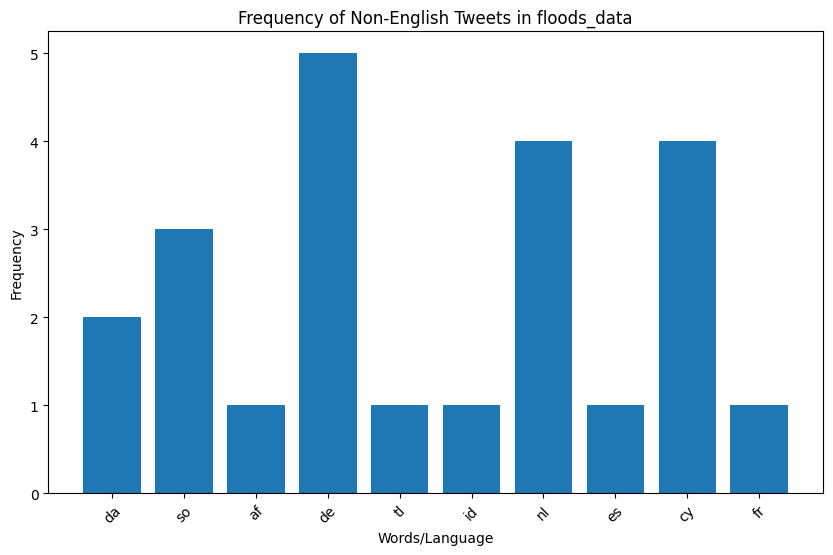

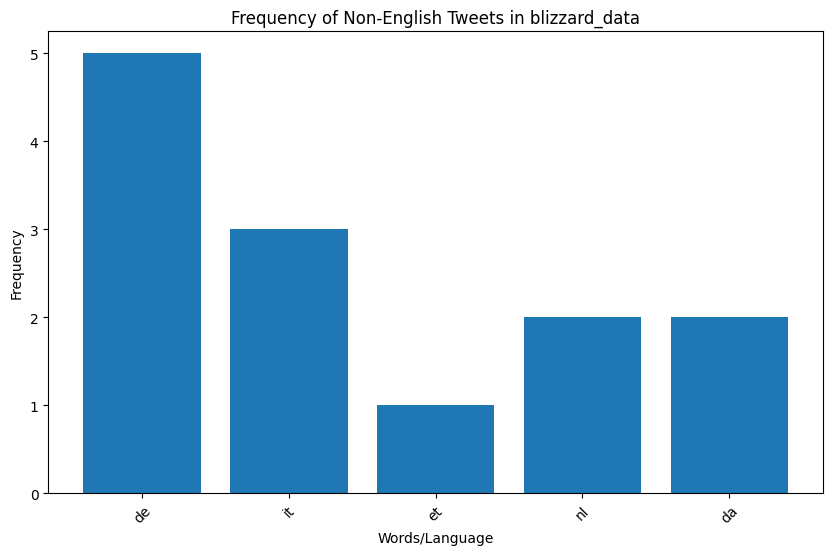

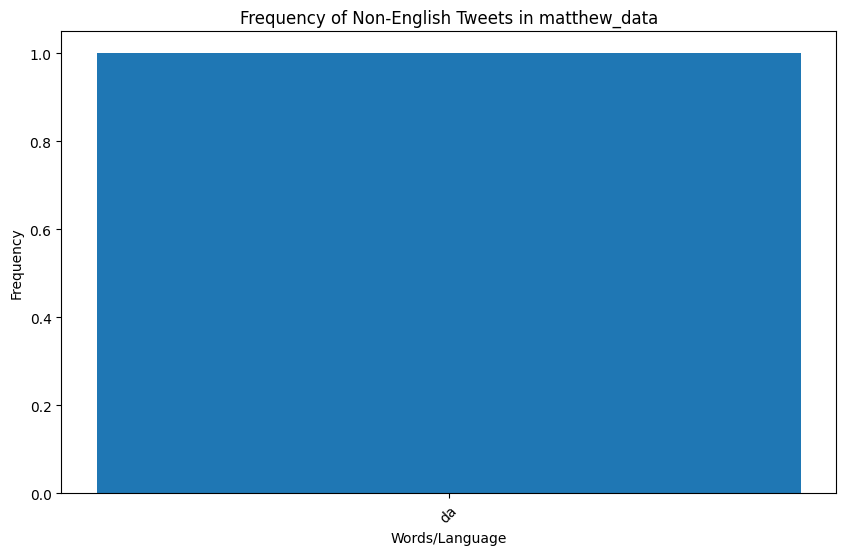

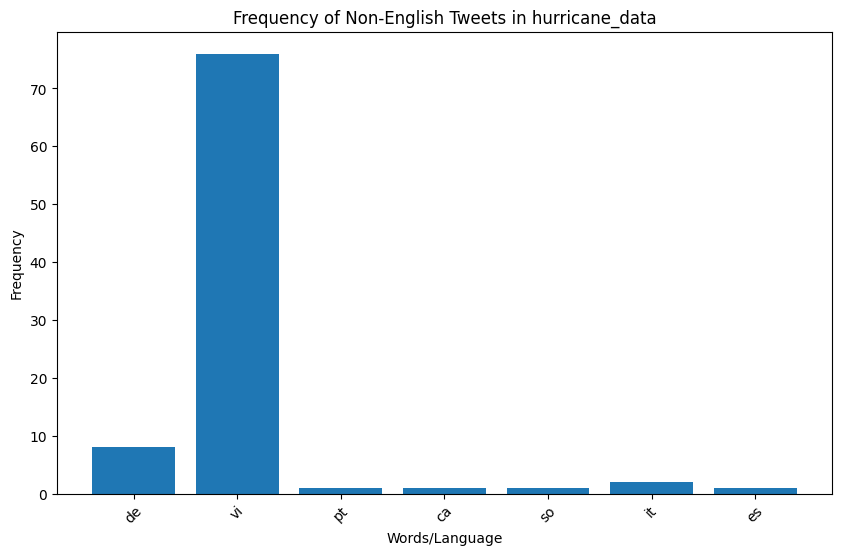

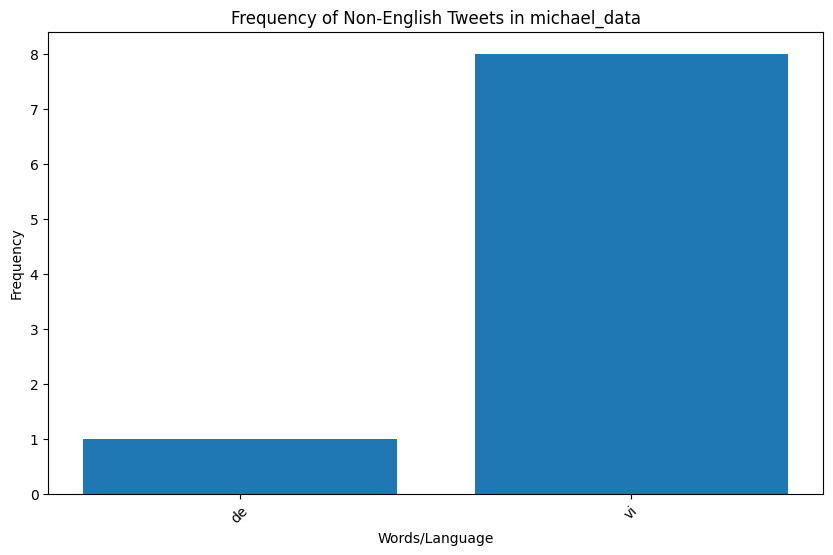

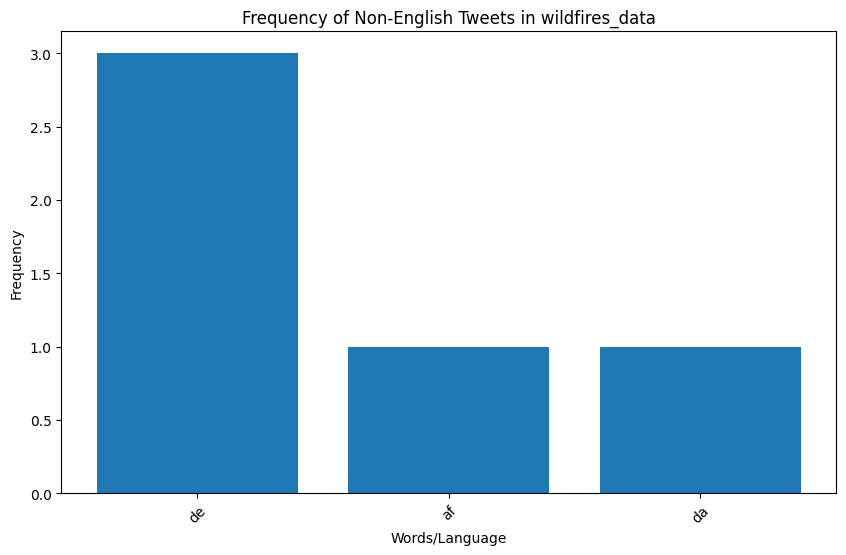

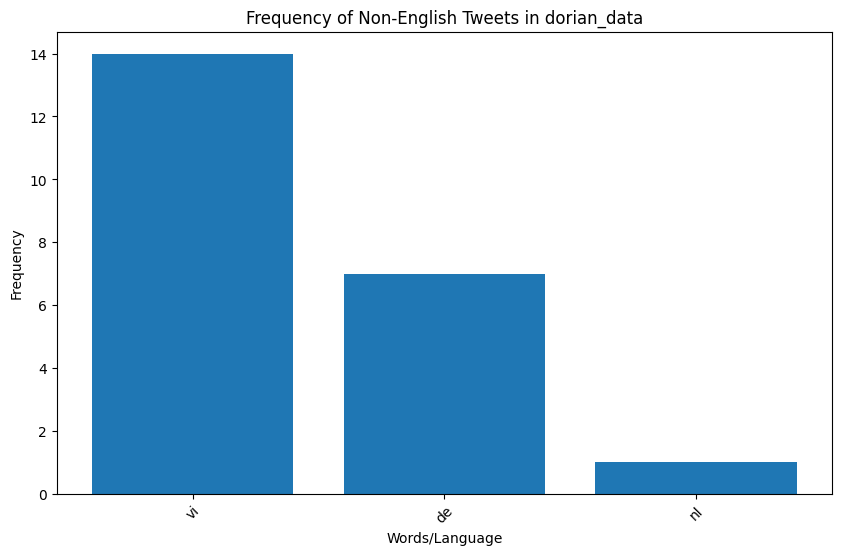

In [200]:
# Loop through each dataset in data_dict and plot the frequency of non-English tweets for each
for dataset_name, dataset_data in language_analysis.items():
    # Extract non-English tweet data for the current dataset
    non_english_counts = dataset_data['Non_English_Tweets']
    
    # Prepare data for plotting
    languages, frequencies = zip(*non_english_counts.items())

    # Plotting the frequency plot for non-English languages in the current dataset
    plt.figure(figsize=(10, 6))
    plt.bar(languages, frequencies)
    plt.xlabel("Words/Language")
    plt.ylabel("Frequency")
    plt.title(f"Frequency of Non-English Tweets in {dataset_name}")
    plt.xticks(rotation=45)
    plt.show()


In [201]:
# ##Plotting english vs non english tweet pie chart
# for name, lang_data in language_analysis.items():
#     # Labels and counts for the pie chart
#     labels = ['English Tweets', 'Non-English Tweets']
#     counts = [lang_data['English_Tweets'], lang_data['Non_English_Tweets']]
    
#     # Plot the pie chart
#     plt.figure(figsize=(6, 6))
#     plt.pie(counts, labels=labels, autopct='%1.1f%%', startangle=140)
#     plt.title(f'English vs. Non-English Tweets for {name}')
#     plt.show()


### We do not have any other language present in the dataset except for English

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/bishaljungthapa/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


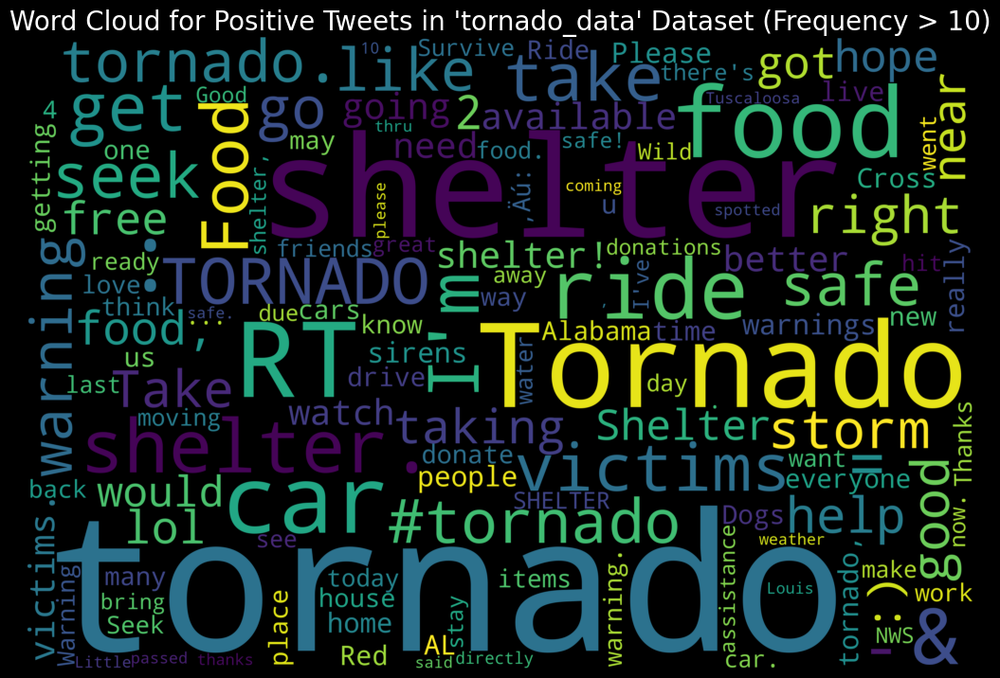

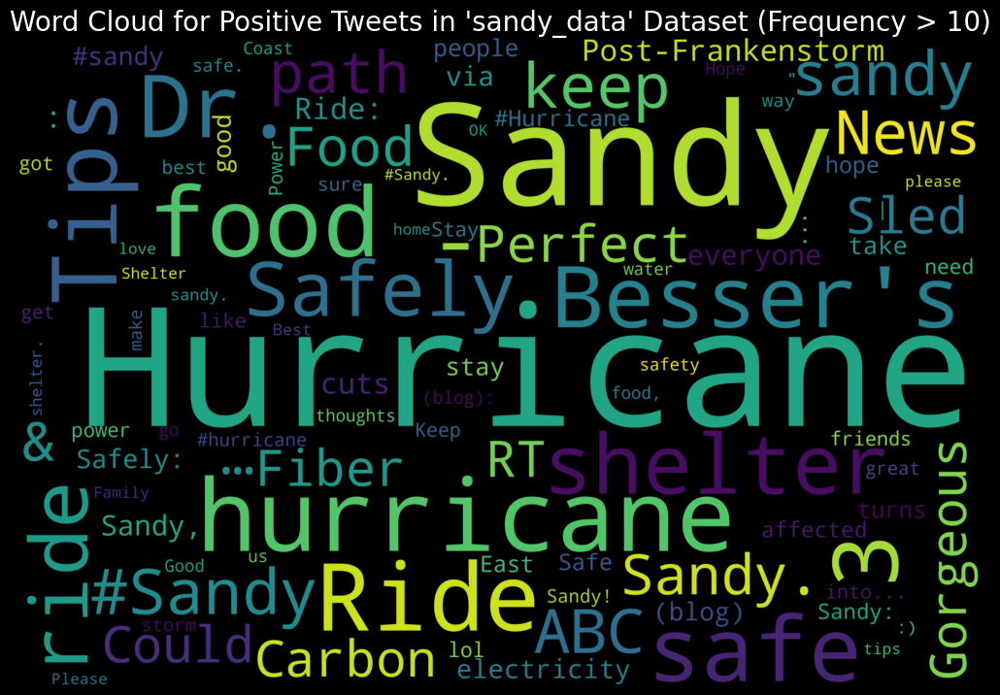

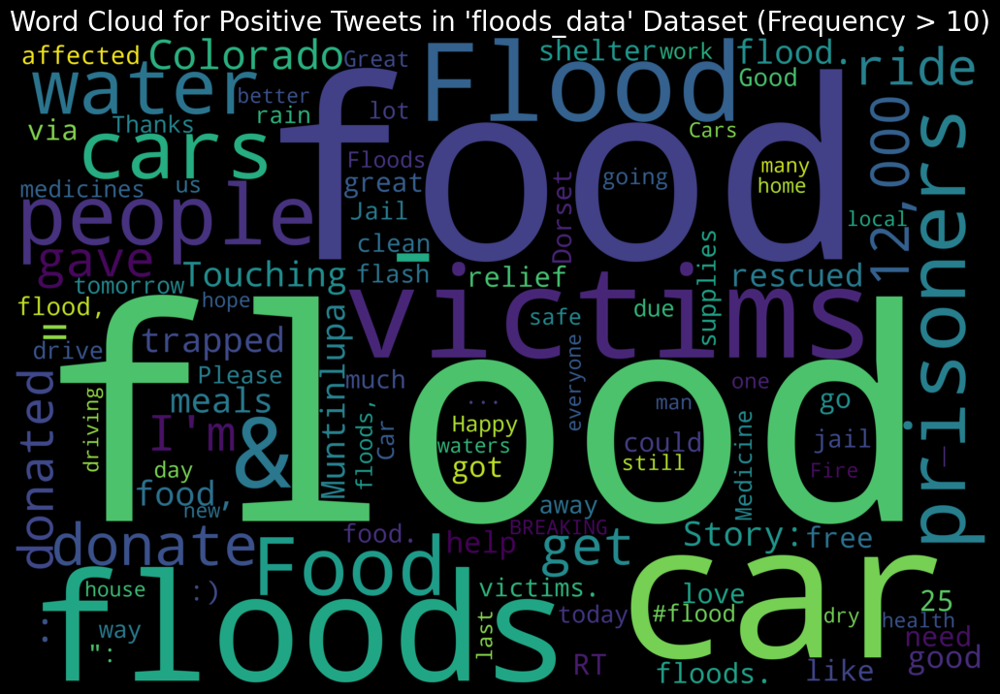

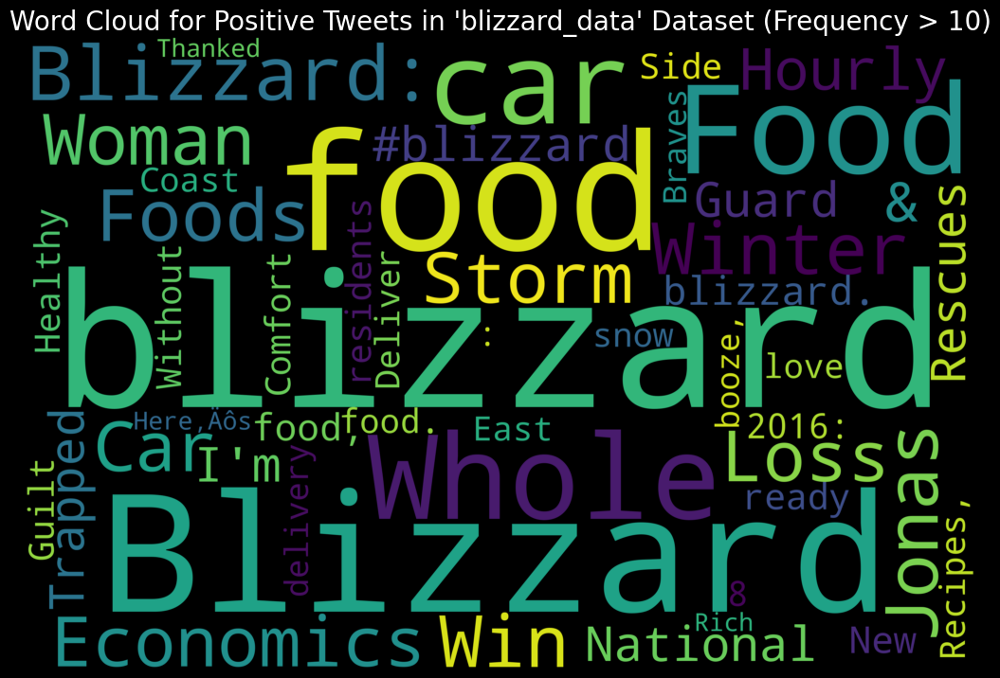

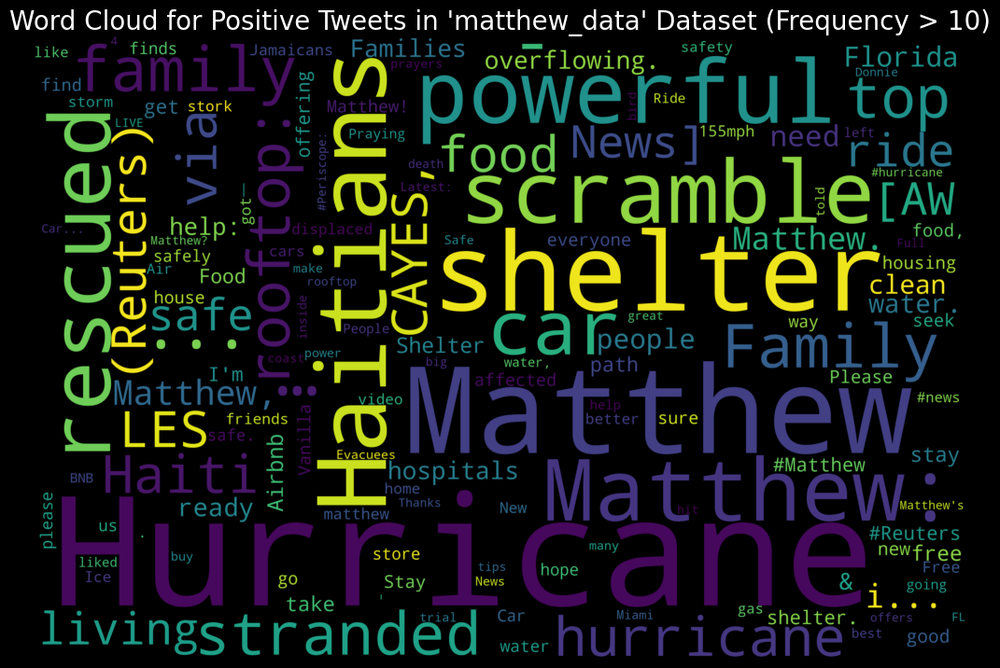

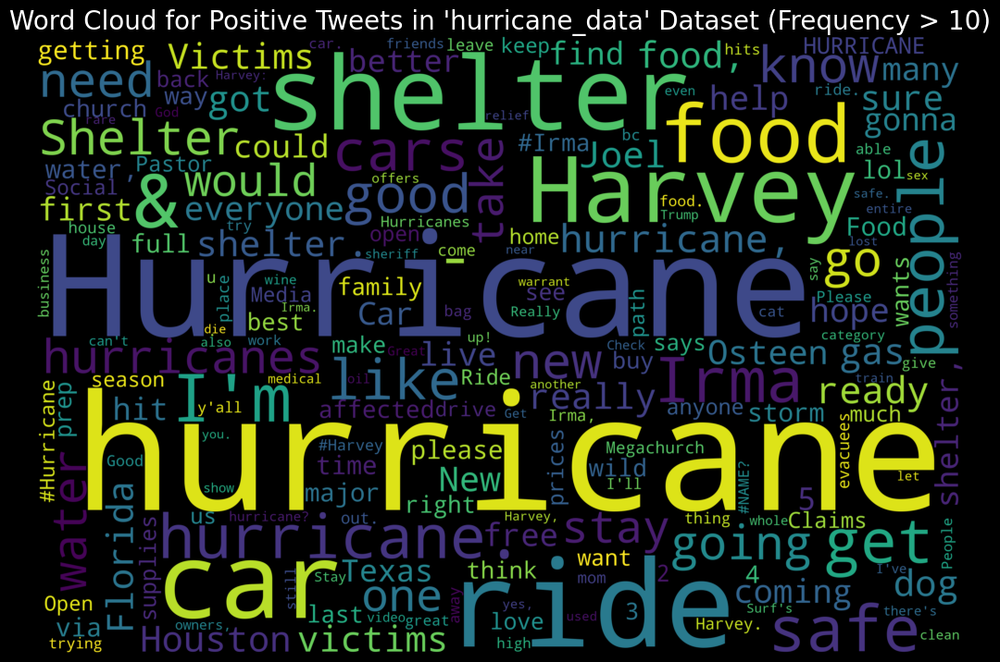

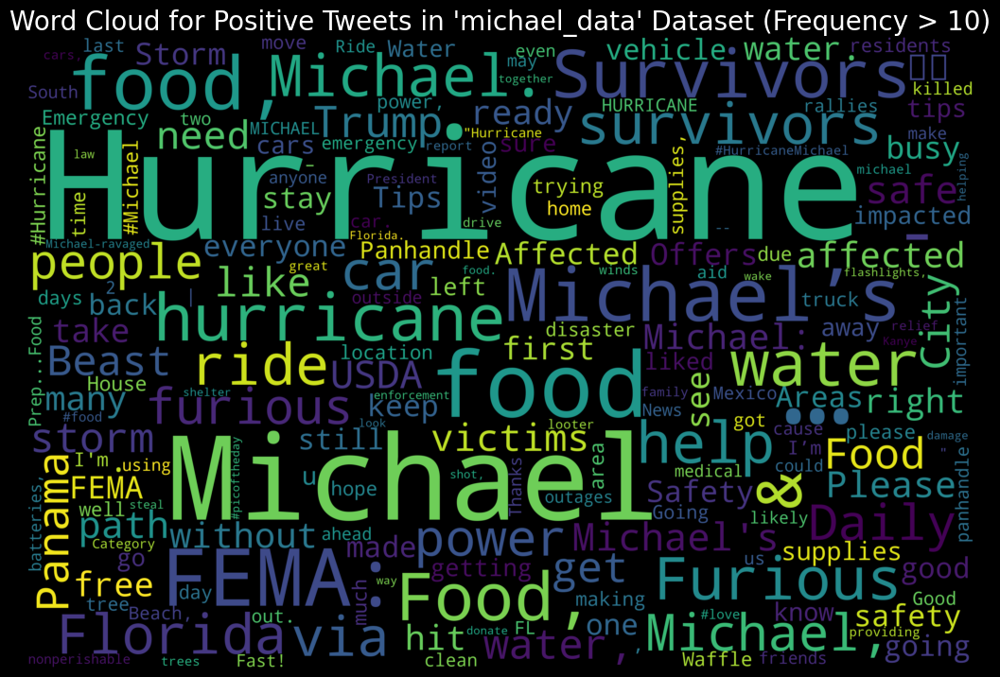

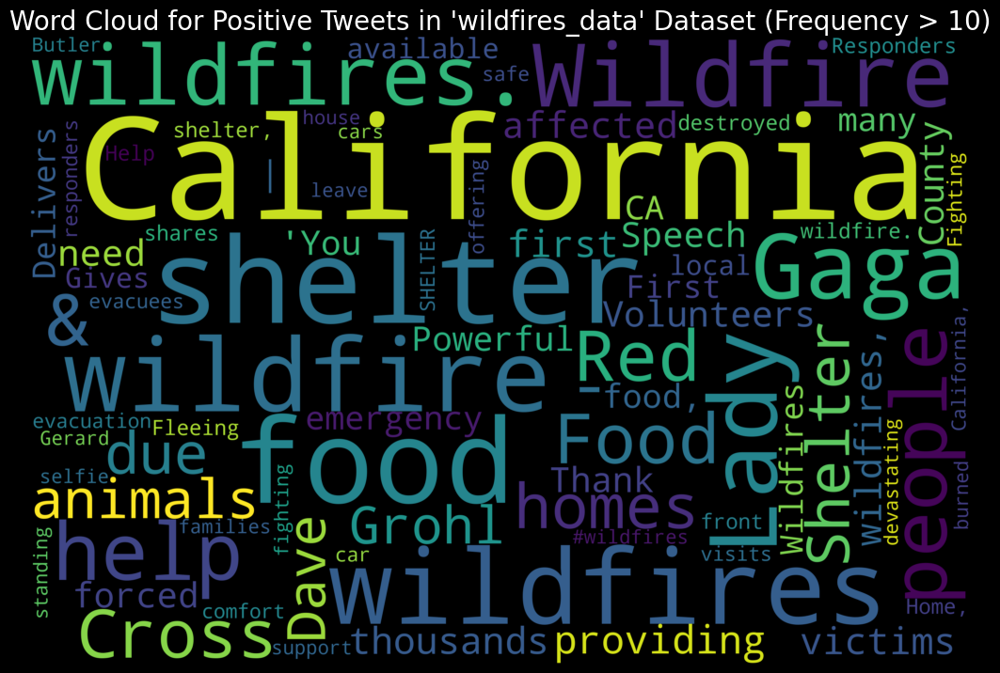

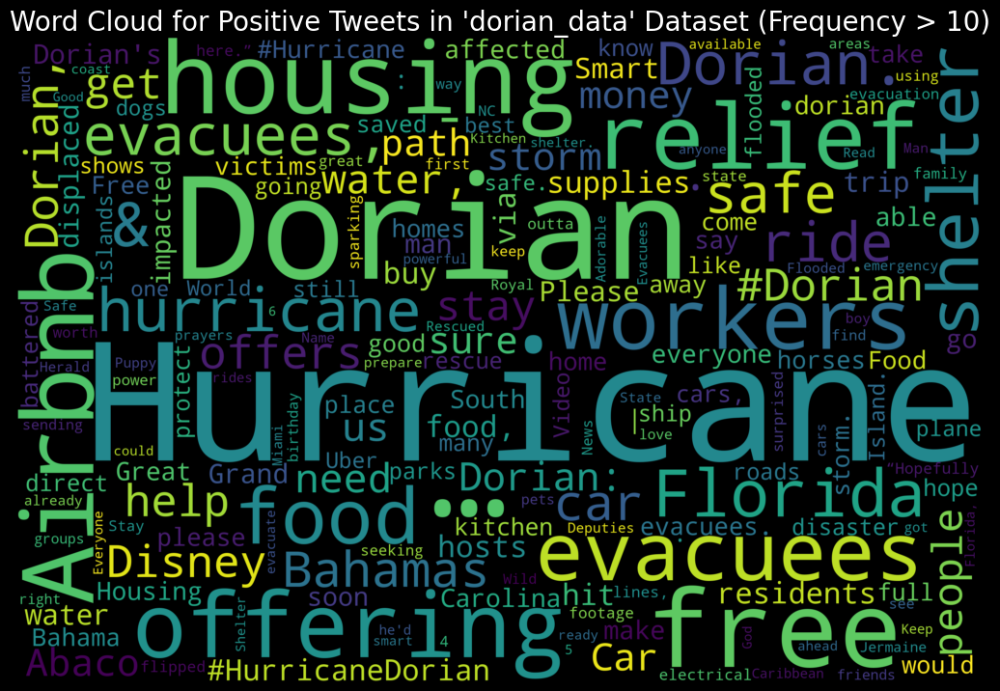

In [202]:
from wordcloud import WordCloud
import nltk
from collections import Counter
import matplotlib.pyplot as plt
import re

# Download stopwords
nltk.download('stopwords')
stopwords = set(nltk.corpus.stopwords.words("english"))

# Add additional custom stopwords
custom_stopwords = {"http", "https", "bit", "ly", "com", "www"}
stopwords.update(custom_stopwords)

# Function to remove patterns
def remove_pattern(input_txt, pattern):
    r = re.findall(pattern, input_txt)
    for word in r:
        input_txt = re.sub(re.escape(word), "", input_txt)
    return input_txt

# Iterate over each dataset in the dictionary
for name, data in data_dict.items():
    # Filter for positive tweets and join them into a single text string
    text = ' '.join(data[data['label'] == "positive"]['clean_tweet'].astype(str))
    
    # Remove URLs from the text using the improved pattern
    url_pattern = r"https?://\S+|www\.\S+|bit\.ly/\S+"
    text = remove_pattern(text, url_pattern)
    
    # Split the text into words, filter out stopwords, and count frequencies
    words = [word for word in text.split() if word.lower() not in stopwords]
    word_counts = Counter(words)
    
    # Filter out words with frequencies <= 10
    filtered_word_counts = {word: freq for word, freq in word_counts.items() if freq > 10}
    
    # Generate the word cloud
    wordcloud = WordCloud(
        width=3000, height=2000, background_color='black',
        stopwords=stopwords
    ).generate_from_frequencies(filtered_word_counts)
    
    # Display the word cloud
    plt.figure(figsize=(10, 8), facecolor='k', edgecolor='k')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Word Cloud for Positive Tweets in '{name}' Dataset (Frequency > 10)", fontsize=20, color="white")
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()


### removing all the special characters, numbers and punctuatoions from the clean_tweet columns

In [203]:
for name, data in data_dict.items():
    # Check if 'tweets' column exists
    if 'tweets' in data.columns: 
        ## Removed special characters, numbers and punctuation
        data["clean_tweet"] =  data["clean_tweet"].str.replace("[^a-zA-Z#]", " ")
        data["clean_tweet"] = data["clean_tweet"].str.replace(r"\s+", " ", regex=True).str.strip()
        print(f"Removed special characters, numbers and punctuations from '{name}' dataset.")
    else:
        print(f"No 'Tweets' column in the '{name}' dataset.")

Removed special characters, numbers and punctuations from 'tornado_data' dataset.
Removed special characters, numbers and punctuations from 'sandy_data' dataset.
Removed special characters, numbers and punctuations from 'floods_data' dataset.
Removed special characters, numbers and punctuations from 'blizzard_data' dataset.
Removed special characters, numbers and punctuations from 'matthew_data' dataset.
Removed special characters, numbers and punctuations from 'hurricane_data' dataset.
Removed special characters, numbers and punctuations from 'michael_data' dataset.
Removed special characters, numbers and punctuations from 'wildfires_data' dataset.
Removed special characters, numbers and punctuations from 'dorian_data' dataset.


In [204]:
floods_data.head()

,tweets,label,clean_tweet
0,"It's Ok, Manchester's off flood alert. Fat cho...",positive,"It's Ok, Manchester's off flood alert. Fat cho..."
1,"Love how you ask for a tiny bit of sauce, and ...",positive,"Love how you ask for a tiny bit of sauce, and ..."
2,Dif tailgate!! Morning games and good food. Im...,positive,Dif tailgate!! Morning games and good food. Im...
3,"As much food as I've eaten today, I'm going to...",positive,"As much food as I've eaten today, I'm going to..."
4,‚Äú@____Reece: Can't wait for the 'I'm hanging...,positive,‚Äú: Can't wait for the 'I'm hanging' and 'nee...


### Using polarity and subjectivity.
#### Polarity means the sentiment of the text wether it is positive or negative or neutral text or statement.
#### A high positive polarity text is close to 1
#### A high negative polarity text is close to -1
#### Neurtal statement is indicated by 0


### Subjectivity, on the other hand, Subjectivity means how perosnal, opinionated or factual the text or statement is.
#### Objective, factual text is idicated by 0
#### Subjective, personal and emotional text is idicated by 1
#### Subjective text often includes personal perspectives and emotions, while objective text presents information without personal bias.

In [205]:
from textblob import TextBlob

pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

In [206]:
for name, data in data_dict.items():
    # Check if 'tweets' column exists
    if 'tweets' in data.columns: 
        ## adding polarity and subjectivity column for EDA purpose
        data["polarity"] =  data["clean_tweet"].apply(pol)
        data["subjectivity"] =  data["clean_tweet"].apply(sub)
        print(f"Polarity and Subjectivity feature added in {name} dataset.")
    else:
        print(f"No 'Tweets' column in the '{name}' dataset.")

Polarity and Subjectivity feature added in tornado_data dataset.
Polarity and Subjectivity feature added in sandy_data dataset.
Polarity and Subjectivity feature added in floods_data dataset.
Polarity and Subjectivity feature added in blizzard_data dataset.
Polarity and Subjectivity feature added in matthew_data dataset.
Polarity and Subjectivity feature added in hurricane_data dataset.
Polarity and Subjectivity feature added in michael_data dataset.
Polarity and Subjectivity feature added in wildfires_data dataset.
Polarity and Subjectivity feature added in dorian_data dataset.


In [207]:
sandy_data.head(2)

,tweets,label,clean_tweet,polarity,subjectivity
0,They make Hurricane Sandy sound like a big dea...,negative,They make Hurricane Sandy sound like a big dea...,0.200,0.25
1,The kitchen was out of mad food tonight so I t...,negative,The kitchen was out of mad food tonight so I t...,-0.625,1.00


## Polarity Explanation

### TextBlob calculates polarity on a continuous scale from -1 (very negative) to +1 (very positive), based on the sentiment of individual words and the overall structure of the text.


###  Lexical Sentiment Contribution: TextBlob relies on a predefined lexicon where words are assigned polarity values. In the first tweet, phrases like “mad food” and “save my ass” might contribute to a negative score due to their association with frustration, resulting in a negative polarity of -0.625. The classifier sums up these word-level sentiments for the overall polarity.


### Context Nuance: TextBlob often misses nuanced context. In the second tweet, phrases like "big deal" and "stock up on food" could be perceived as neutral or slightly positive, despite the underlying urgency, which may lead TextBlob to assign a small positive polarity (+0.2).

## Subjectivity explained


### The first tweet in sandy data it is mostly factual or neutral, with a slight opinion. The phrase "sound like a big deal" contains a hint of personal opinion, as it reflects the speaker’s perception rather than an objective statement. The score of 0.25 means that, while there is some subjectivity, the tweet is not highly opinionated.

### The second tweet in sandy data is entirely subjective. Words like "mad" add a personal, informal tone, and the overall structure reflects a personal experience or feeling about the kitchen being "out of food." Subjectivity is high here because the statement is based on personal experience, which lacks factual or objective content.

In [208]:
floods_data.head()

,tweets,label,clean_tweet,polarity,subjectivity
0,"It's Ok, Manchester's off flood alert. Fat cho...",positive,"It's Ok, Manchester's off flood alert. Fat cho...",0.25,0.375000
1,"Love how you ask for a tiny bit of sauce, and ...",positive,"Love how you ask for a tiny bit of sauce, and ...",-0.10,0.633333
2,Dif tailgate!! Morning games and good food. Im...,positive,Dif tailgate!! Morning games and good food. Im...,1.00,0.600000
3,"As much food as I've eaten today, I'm going to...",positive,"As much food as I've eaten today, I'm going to...",0.35,0.350000
4,‚Äú@____Reece: Can't wait for the 'I'm hanging...,positive,‚Äú: Can't wait for the 'I'm hanging' and 'nee...,0.50,0.600000


In [209]:
from scipy.stats import chi2_contingency


chi_square_results = {}
for name, data in data_dict.items():
    # Check if 'tweets' column exists
    if 'tweets' in data.columns and 'polarity' in data.columns:
        # Add Polarity_label based on polarity value
        data["polarity_label"] = data["polarity"].apply(lambda x: "positive" if x >= 0 else "negative")
        
        # creates a contingency table for 'label' vs 'polarity_label'
        contingency_table = pd.crosstab(data["label"], data["polarity_label"])
        
        # Perform Chi-square test
        chi2, p, dof, ex = chi2_contingency(contingency_table)
        chi_square_results[name] = {
            "chi2": chi2,
            "p_value": p,
            "degrees_of_freedom": dof,
            "contingency_table": contingency_table
        }
        print(chi_square_results[name])


{'chi2': 112.01493386030005, 'p_value': 3.5462887794205145e-26, 'degrees_of_freedom': 1, 'contingency_table': polarity_label  negative  positive
label                             
negative             952      1564
positive             207       849}
{'chi2': 367.18534195631975, 'p_value': 7.67429784145352e-82, 'degrees_of_freedom': 1, 'contingency_table': polarity_label  negative  positive
label                             
negative             581       912
positive               0       697}
{'chi2': 67.26918865279603, 'p_value': 2.3685424339742386e-16, 'degrees_of_freedom': 1, 'contingency_table': polarity_label  negative  positive
label                             
negative            1234      1477
positive             264       622}
{'chi2': 15.910280837727147, 'p_value': 6.641696349265668e-05, 'degrees_of_freedom': 1, 'contingency_table': polarity_label  negative  positive
label                             
negative            1115      2226
positive              68       240}


#### Null Hypothesis (H₀): There is no association between the polarity-derived labels and the actual sentiment labels.
#### Alternative Hypothesis (H₁): There is an association between the polarity-derived labels and the actual sentiment labels, meaning that the differences between them are statistically significant and not due to random chance.

### since the chi-square test for all the data set present high chi-square value and low p-value which means there is significant difference between the categorical labels (positive and negative) and the polarity derrived labels. Which suggest that the polarity value I derrived from the textblob are not aligning well with the dataset labels (positive and negative). 
### The results suggest that TextBlob’s polarity scoring does not align well with human sentiment labels, particularly in capturing the nuances of negative sentiment.


### So, based on the above test, we can reject Null Hypothesis (H₀). This means that we conclude there is a significant difference between the polarity-derived labels (from TextBlob) and the manually assigned sentiment labels.

#### Plotting a histogram for polarity and subjectivity for each tweet for each datasets

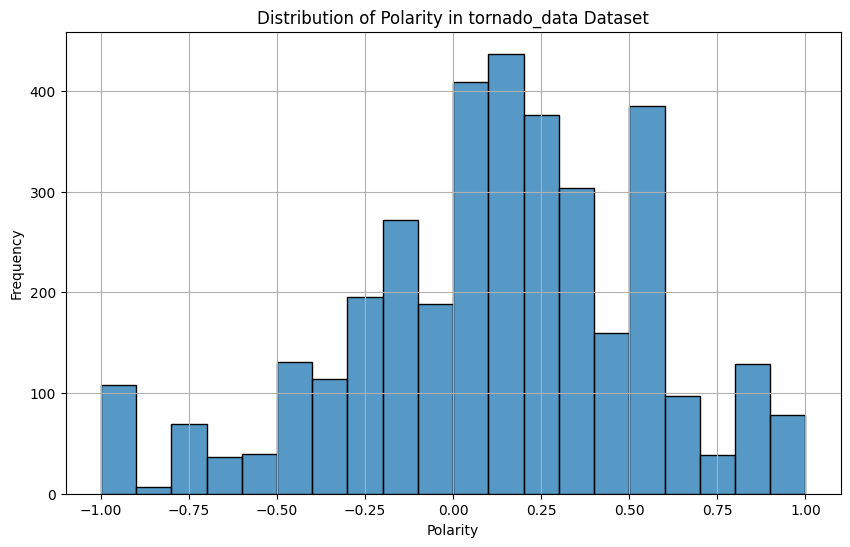

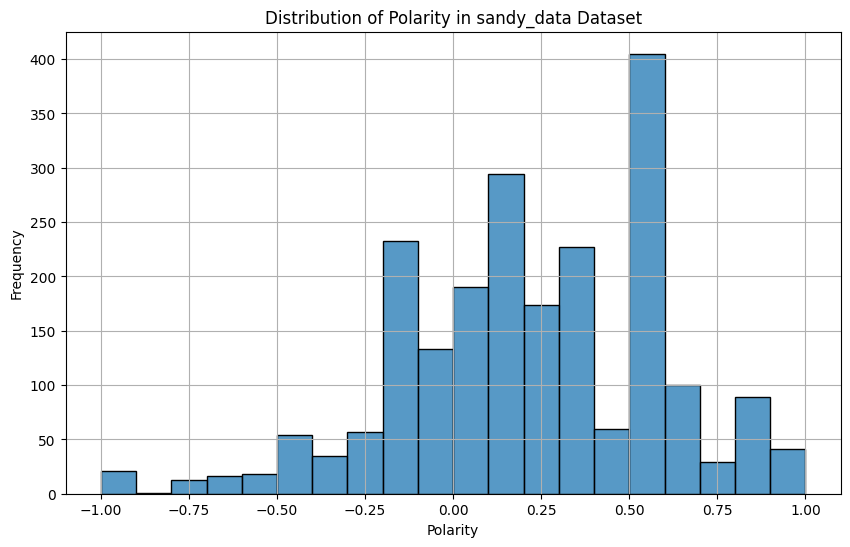

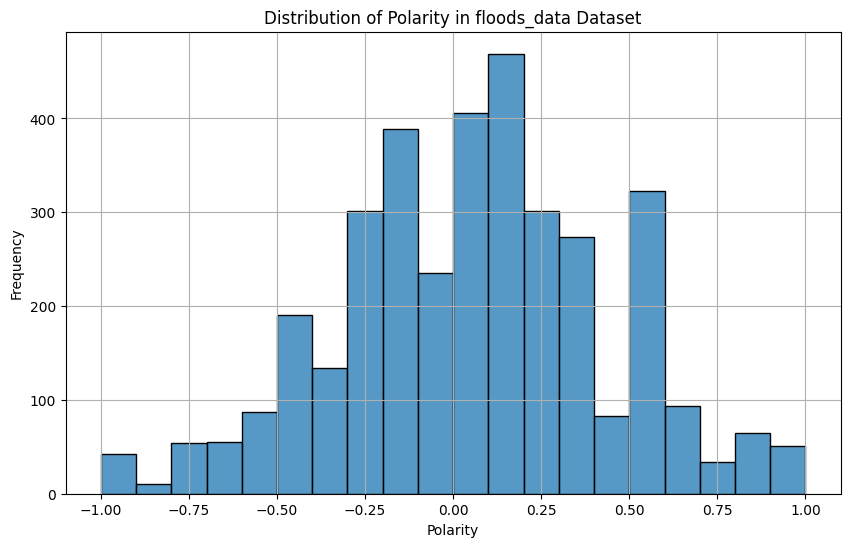

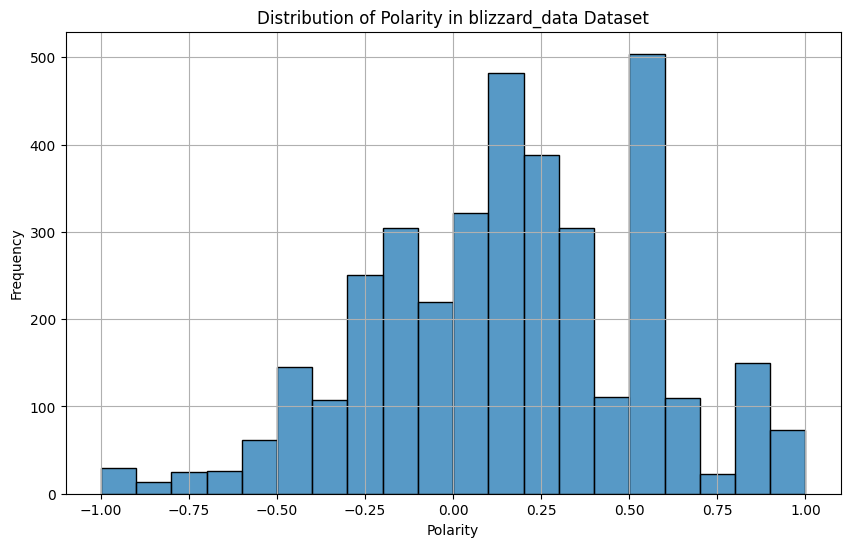

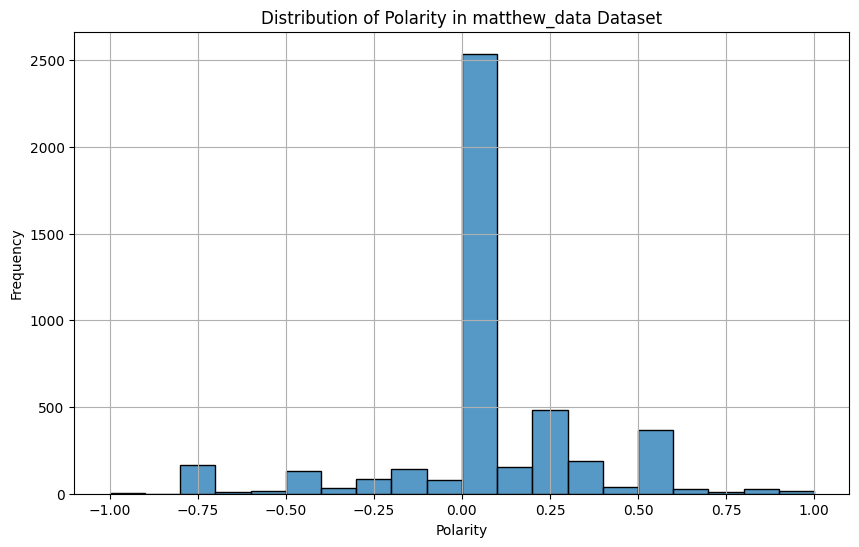

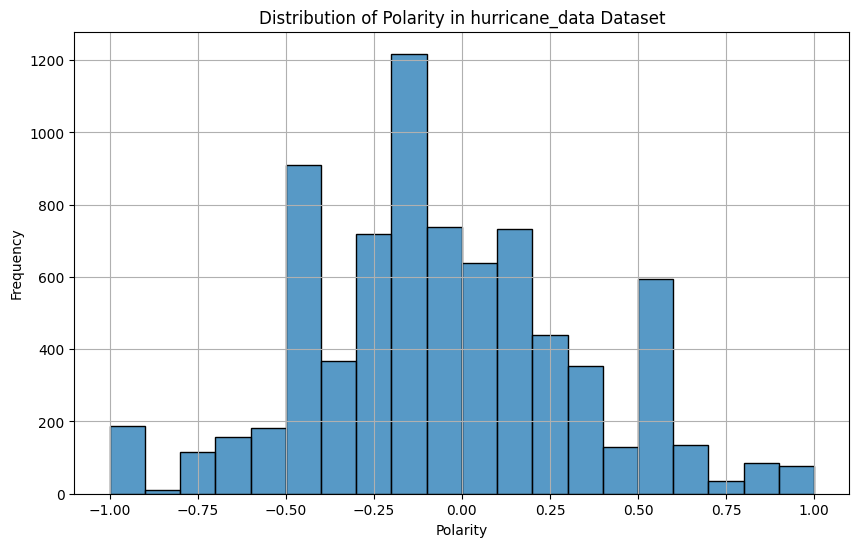

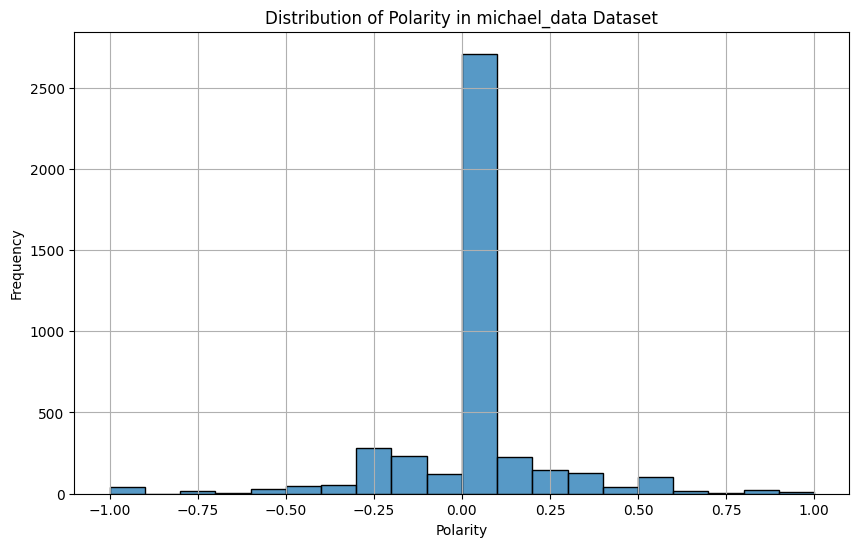

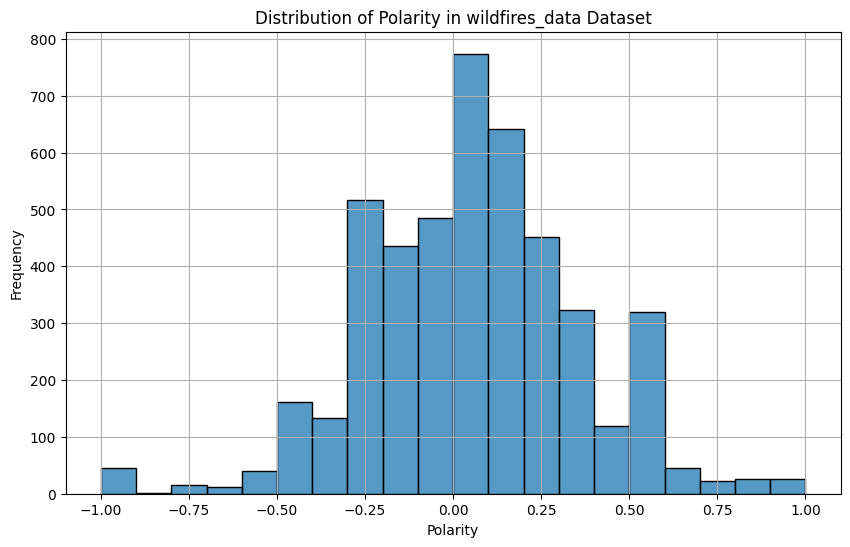

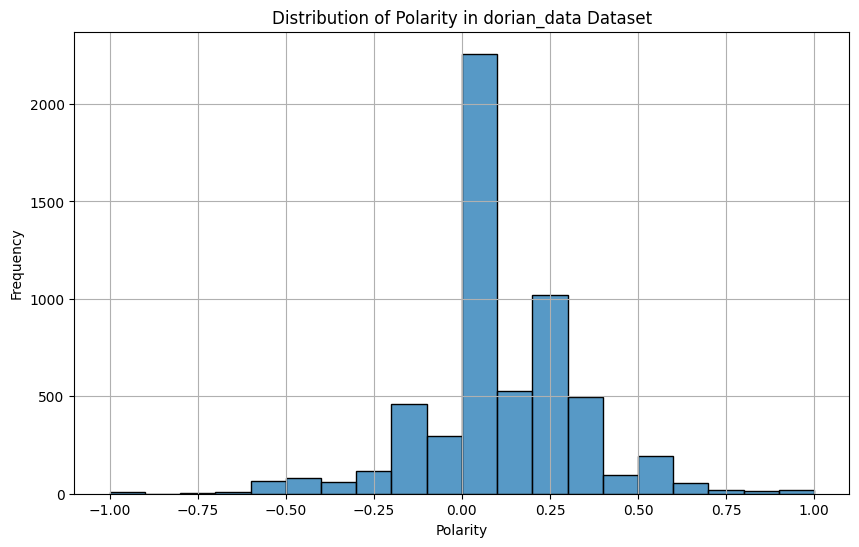

In [210]:
for name, data in data_dict.items():
    # Check if the 'polarity' column exists in the dataset
    if 'polarity' in data.columns:
        plt.figure(figsize=(10, 6))
        sns.histplot(data['polarity'], bins=20, edgecolor='black',palette="Set2")
        plt.title(f'Distribution of Polarity in {name} Dataset')
        plt.xlabel('Polarity')
        plt.ylabel('Frequency')
        plt.grid(True)
        # Display the plot
        plt.show()
    else:
        print(f"No 'polarity' column in the '{name}' dataset.")

### From the tornado_data polarity graphs, the distribution is skewed towards neutral to mildly positive values, with fewer extreme positive or negative polarities. The pattern present suggests that most tweets in the tornado_data dataset are neutral or slightly positive, likely due to factual reporting and updates, with fewer tweets expressing strong negative or positive emotions.


### From the sandy_data, the distribution shows a concentration of tweets with mildly positive sentiment, with fewer tweets on the extreme ends of the spectrum. The pattern present suggests that, while there are some negative and highly positive sentiments, the general tone of tweets in the sandy_data dataset leans toward a moderately positive perspective, possibly emphasizing recovery and support rather than focusing solely on the negative impact.


### From the floods_data, the overall distribution is relatively balanced but slightly skewed towards neutral to mildly positive sentiments, with a notable number of moderately negative tweets as well. The pattern present suggests that the tweets in the floods_data dataset include a mix of informational updates, reports of adverse effects, and some expressions of support and recovery efforts.

### From the dorian_data, the distribution is heavily skewed towards neutral polarity, with fewer tweets expressing strong positive or negative sentiment. This pattern suggest most tweets in the dorian_data dataset are likely centered around informative and factual content, with a smaller portion of users sharing emotionally charged responses.

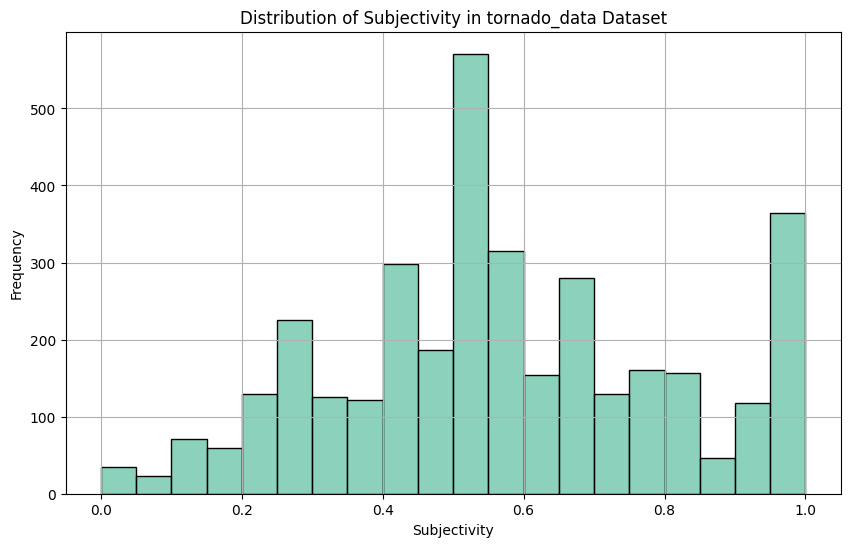

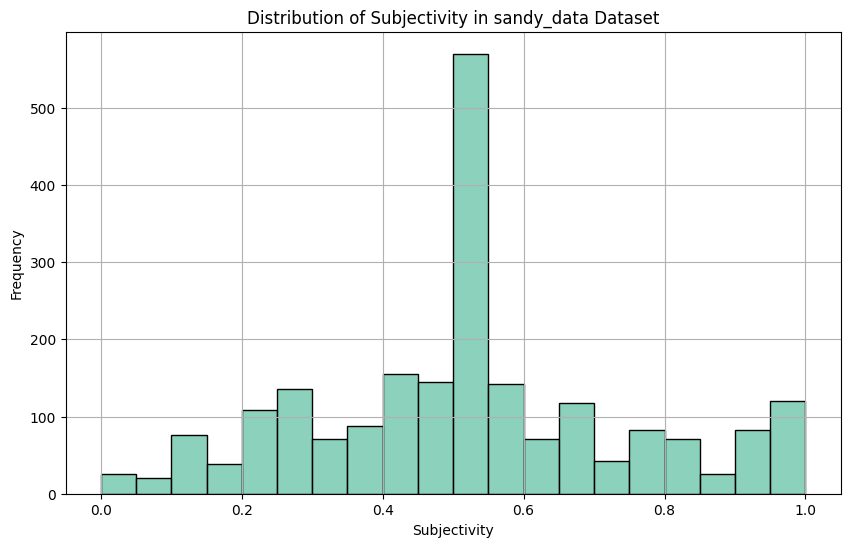

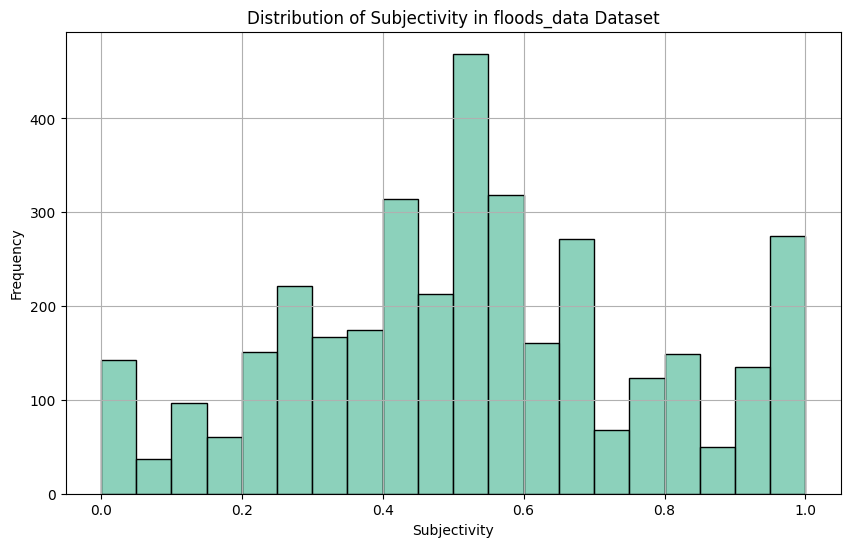

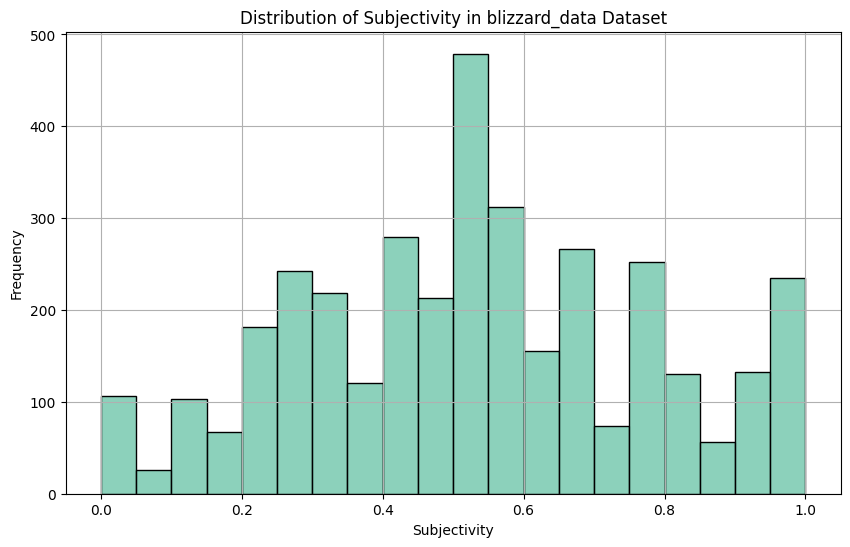

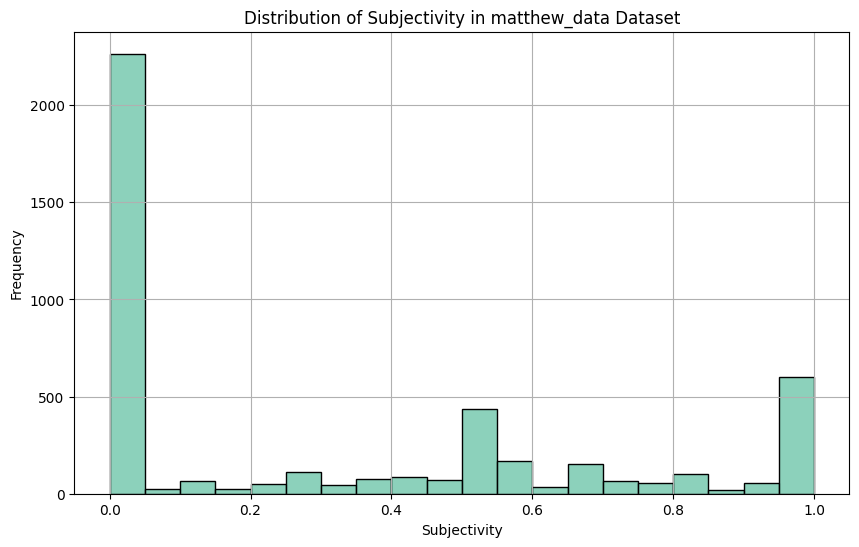

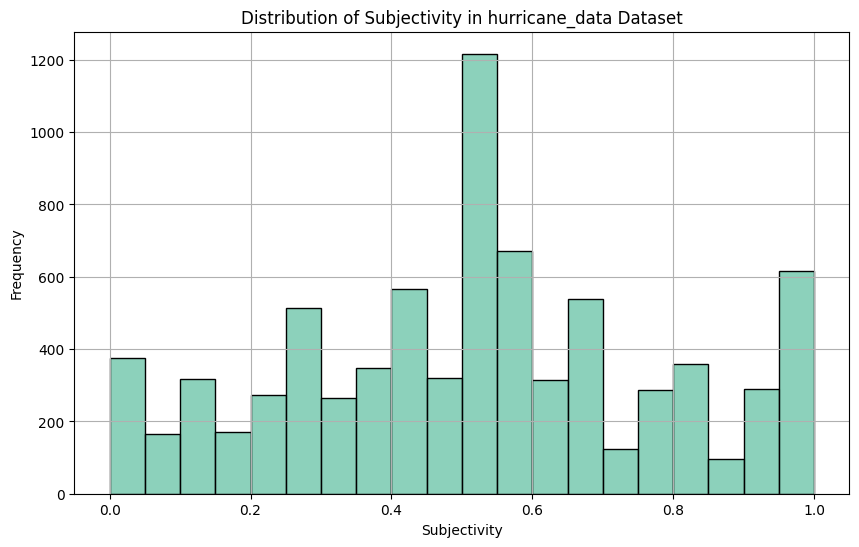

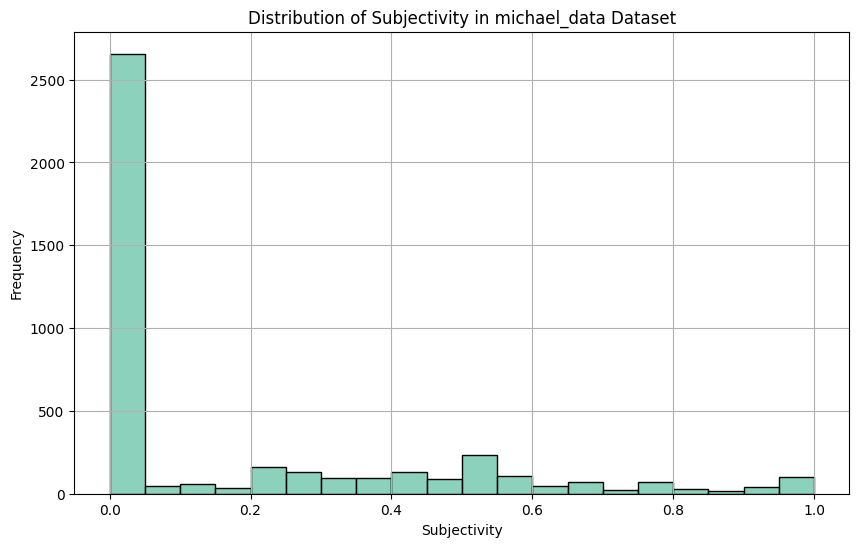

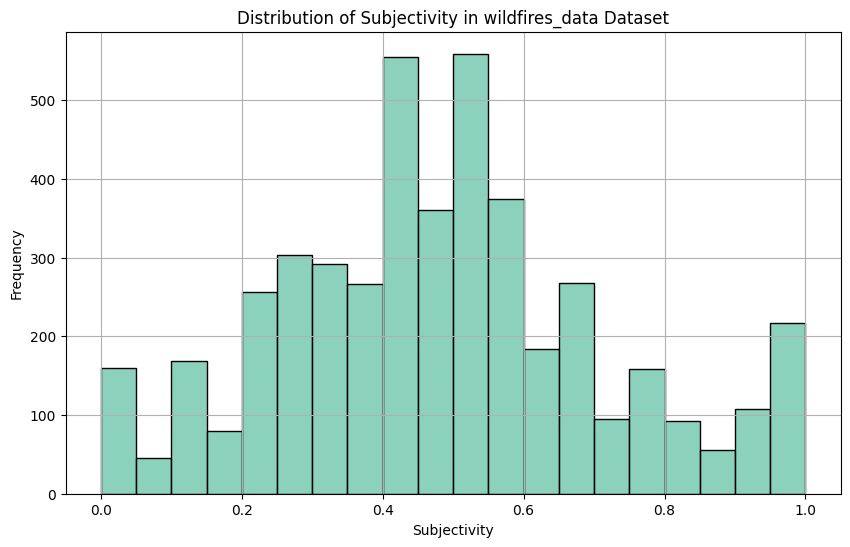

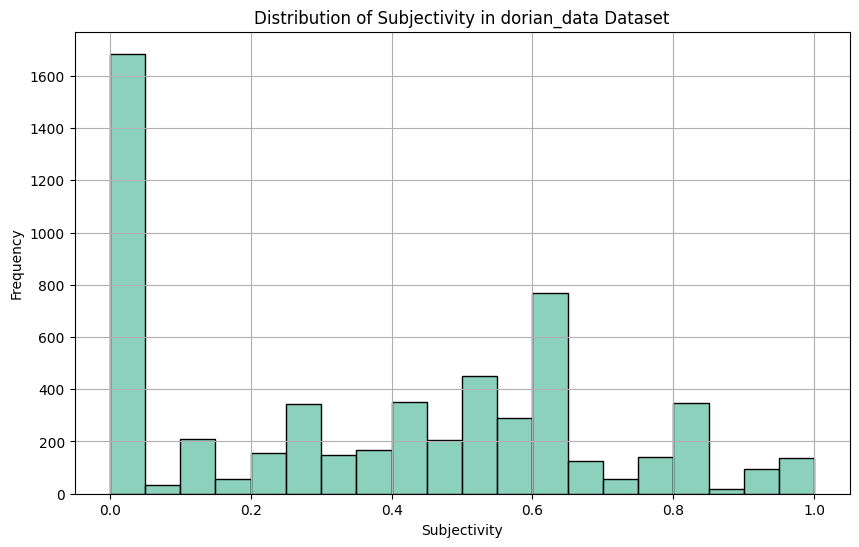

In [211]:
for name, data in data_dict.items():
    # Check if the 'subjectivity' column exists in the dataset
    if 'subjectivity' in data.columns:
        plt.figure(figsize=(10, 6))
        sns.histplot(data['subjectivity'], bins=20, color='#66c2a5', edgecolor='black')
        plt.title(f'Distribution of Subjectivity in {name} Dataset')
        plt.xlabel('Subjectivity')
        plt.ylabel('Frequency')
        plt.grid(True)
        # Display the plot
        plt.show()
    else:
        print(f"No 'subjectivity' column in the '{name}' dataset.")

### For the subjectivity of the tornado_data dataset tweets, distribution is bimodal, with peaks around both moderate and high subjectivity values, suggesting a mix of factual updates and personal, opinionated tweets. The dataset contains a balance of informational and emotional content. Many users are sharing both facts and personal responses, creating a blend of objective and subjective tweets.

### The sandy_data dataset tweets is heavily concentrated around moderate subjectivity, with smaller peaks on both the low and high ends. The sandy_data dataset is composed mainly of tweets that balance factual reporting with personal reactions, likely reflecting a combination of updates, opinions, and mild emotional responses. The lower frequency of highly subjective tweets indicates that while there is some personal and emotional content, the primary focus may be on sharing information blended with a moderate level of opinion.

### The floods_data dataset tweets shows a bimodal pattern, with peaks around moderate and high subjectivity values. There is a moderate presence of objective tweets, but the majority lean towards subjectivity. This suggests that the floods_data dataset contains a mix of factual updates and emotional or personal reactions, with many tweets falling between slightly opinionated and highly subjective.

### In the blizzard_data the distribution is bimodal, with a peak at moderate subjectivity around 0.5 and a secondary peak at high subjectivity around 1.0, while objective tweets are less frequent. This distribution suggests that the blizzard_data dataset primarily contains a mix of moderately subjective and highly subjective tweets, indicating a balance of information sharing and personal perspective, with fewer tweets focusing purely on factual content.

### For the mathhew_data dataset, distribution is heavily skewed towards low subjectivity, with a few tweets showing moderate or high subjectivity. Mathhew dataset is primarily composed of objective content, likely focusing on factual updates and information sharing rather than personal or emotional responses.

### removing any words that have length less than 3


In [212]:
for name, data in data_dict.items():
    # Check if 'tweets' column exists
    if 'tweets' in data.columns: 
        ## remove words that have length less than 3
        data["clean_tweet"] = data["clean_tweet"].apply(remove_short_words)
        print(f"Removed words with length less than 3 from tweets in '{name}' dataset.")
    else:
        print(f"No 'Tweets' column in the '{name}' dataset.")

Removed words with length less than 3 from tweets in 'tornado_data' dataset.
Removed words with length less than 3 from tweets in 'sandy_data' dataset.
Removed words with length less than 3 from tweets in 'floods_data' dataset.
Removed words with length less than 3 from tweets in 'blizzard_data' dataset.
Removed words with length less than 3 from tweets in 'matthew_data' dataset.
Removed words with length less than 3 from tweets in 'hurricane_data' dataset.
Removed words with length less than 3 from tweets in 'michael_data' dataset.
Removed words with length less than 3 from tweets in 'wildfires_data' dataset.
Removed words with length less than 3 from tweets in 'dorian_data' dataset.


In [213]:
def extractHashtags(x):
    hashtags = []
    
    # Loop over the words in the tweet
    for i in x:
        ht = re.findall(r'#(\w+)',i)
        hashtags.append(ht)
    
    return hashtags

In [214]:
positive_hashTags_dict = {}
negative_hashTags_dict = {}

# Iterate over each dataset in data_dict
for name, data in data_dict.items():
    # Extract positive and negative hashtags for each dataset
    positive_tweets = data['clean_tweet'][data['label'] == 'positive']
    negative_tweets = data['clean_tweet'][data['label'] == 'negative']
    
    # Apply the hashtag extraction function
    positive_hashTags_dict[name] = [hashtag for hashtag in extractHashtags(positive_tweets) if len(hashtag) > 3]
    negative_hashTags_dict[name] = [hashtag for hashtag in extractHashtags(negative_tweets) if len(hashtag) > 3]
# Display positive and negative hashtags for each dataset
print("Positive Hashtags for Each Dataset:", positive_hashTags_dict)
print("Negative Hashtags for Each Dataset:", negative_hashTags_dict)

Positive Hashtags for Each Dataset: {'tornado_data': [['alwx', 'tornado', 'Madison', 'offer', 'loc', 'src'], ['loc', 'offer', 'food', 'tornado'], ['carbs', 'obesity', 'health', 'diet', 'fit', 'workout', 'weightloss', 'sugar', 'nutrition', 'fitness', 'food'], ['redcross', 'STLtornado', 'stlwx', 'tornado'], ['MO', 'Tornado', 'KSDK', 'STL'], ['MO', 'Tornado', 'KSDK', 'STL'], ['AR', 'KY', 'LA', 'MI', 'TN', 'TX', 'VA'], ['StLouis', 'Midwest', 'Tornado', 'Flood'], ['info4', 'shelter', 'tornado', 'flood', 'AL', 'TN', 'GA', 'KY', 'NC', 'TX'], ['alwx', 'mswx', 'gawx', 'tornado'], ['alwx', 'mswx', 'gawx', 'tornado'], ['info4', 'shelter', 'tornado', 'flood', 'AL', 'TN', 'GA', 'KY', 'NC', 'TX'], ['Walker', 'tornado', 'GA', 'gawx'], ['severe', 'NWO', 'weather', 'News'], ['StLouis', 'Tornado', 'Flood', 'Midwest'], ['NotComplaining', 'ItCouldHaveBeenWorse', 'CHAwx', 'NWGAwx'], ['tornado', 'Glendale', 'Kentucky', 'KYWX']], 'sandy_data': [['hurricane', 'sandy', 'food', 'health', 'safe'], ['day2', 'day1

In [215]:

# Display positive hashtags for each dataset
positive_hashTags_dict

{'tornado_data': [['alwx', 'tornado', 'Madison', 'offer', 'loc', 'src'],
  ['loc', 'offer', 'food', 'tornado'],
  ['carbs',
   'obesity',
   'health',
   'diet',
   'fit',
   'workout',
   'weightloss',
   'sugar',
   'nutrition',
   'fitness',
   'food'],
  ['redcross', 'STLtornado', 'stlwx', 'tornado'],
  ['MO', 'Tornado', 'KSDK', 'STL'],
  ['MO', 'Tornado', 'KSDK', 'STL'],
  ['AR', 'KY', 'LA', 'MI', 'TN', 'TX', 'VA'],
  ['StLouis', 'Midwest', 'Tornado', 'Flood'],
  ['info4', 'shelter', 'tornado', 'flood', 'AL', 'TN', 'GA', 'KY', 'NC', 'TX'],
  ['alwx', 'mswx', 'gawx', 'tornado'],
  ['alwx', 'mswx', 'gawx', 'tornado'],
  ['info4', 'shelter', 'tornado', 'flood', 'AL', 'TN', 'GA', 'KY', 'NC', 'TX'],
  ['Walker', 'tornado', 'GA', 'gawx'],
  ['severe', 'NWO', 'weather', 'News'],
  ['StLouis', 'Tornado', 'Flood', 'Midwest'],
  ['NotComplaining', 'ItCouldHaveBeenWorse', 'CHAwx', 'NWGAwx'],
  ['tornado', 'Glendale', 'Kentucky', 'KYWX']],
 'sandy_data': [['hurricane', 'sandy', 'food', 'healt

In [216]:
# Display negative hashtags for each dataset
negative_hashTags_dict

{'tornado_data': [['diet',
   'workout',
   'sugar',
   'obesity',
   'fit',
   'fitness',
   'carbs',
   'food',
   'nutrition',
   'health'],
  ['tornado', 'monsoon', 'hurricane', 'storm'],
  ['rachaelray', 'foodblog', 'cooking', 'chili', 'food'],
  ['tuscaloosa', 'offer', 'loc', 'details'],
  ['Webster', 'MOwx', 'Ozarks', 'Tornado'],
  ['NWS', 'AR', 'OK', 'TX'],
  ['NWS', 'AR', 'OK', 'TX'],
  ['News', 'ABCNews', 'ABC', 'USNews'],
  ['AR', 'KY', 'LA', 'MI', 'TN', 'TX', 'VA'],
  ['AR', 'IL', 'LA', 'MO'],
  ['AR', 'IL', 'LA', 'MO'],
  ['tornado', 'weather', 'farm', 'photo'],
  ['Tornado', 'Bristol', 'TN', 'Abington', 'VA', 'tnwx', 'vawx'],
  ['AL', 'GA', 'TN', 'VA'],
  ['tornado', 'vawx', 'rva', 'northernVA', 'metroDC', 'VA'],
  ['AL', 'GA', 'TN', 'VA'],
  ['alabama', 'tornado', 'severe', 'takeshelter'],
  ['tcot', 'news', 'prolife', 'severe'],
  ['tornado', 'alabama', 'severe', 'weather'],
  ['tornado', 'Moorseville', 'Mississippi', 'MSWX'],
  ['AL', 'GA', 'MS', 'TN'],
  ['tornado', '

### Storing the positive and negative  hastags:

In [217]:
# Dictionaries to store unnested (flattened) positive and negative hashtags for each dataset
positive_hashtags_unnested_dict = {}
negative_hashtags_unnested_dict = {}

# Unnest positive hashtags for each dataset
for name, hashtags in positive_hashTags_dict.items():
    positive_hashtags_unnested_dict[name] = sum(hashtags, [])

# Unnest negative hashtags for each dataset
for name, hashtags in negative_hashTags_dict.items():
    negative_hashtags_unnested_dict[name] = sum(hashtags, [])


### Positive hastags:

In [218]:
# Display the unnested positive hashtags for each dataset
for dataset_name in positive_hashtags_unnested_dict.keys():
    print(f"Positive Hashtags (Unnested) for {dataset_name} dataset:")
    print(positive_hashtags_unnested_dict[dataset_name])
    print("\n")

Positive Hashtags (Unnested) for tornado_data dataset:
['alwx', 'tornado', 'Madison', 'offer', 'loc', 'src', 'loc', 'offer', 'food', 'tornado', 'carbs', 'obesity', 'health', 'diet', 'fit', 'workout', 'weightloss', 'sugar', 'nutrition', 'fitness', 'food', 'redcross', 'STLtornado', 'stlwx', 'tornado', 'MO', 'Tornado', 'KSDK', 'STL', 'MO', 'Tornado', 'KSDK', 'STL', 'AR', 'KY', 'LA', 'MI', 'TN', 'TX', 'VA', 'StLouis', 'Midwest', 'Tornado', 'Flood', 'info4', 'shelter', 'tornado', 'flood', 'AL', 'TN', 'GA', 'KY', 'NC', 'TX', 'alwx', 'mswx', 'gawx', 'tornado', 'alwx', 'mswx', 'gawx', 'tornado', 'info4', 'shelter', 'tornado', 'flood', 'AL', 'TN', 'GA', 'KY', 'NC', 'TX', 'Walker', 'tornado', 'GA', 'gawx', 'severe', 'NWO', 'weather', 'News', 'StLouis', 'Tornado', 'Flood', 'Midwest', 'NotComplaining', 'ItCouldHaveBeenWorse', 'CHAwx', 'NWGAwx', 'tornado', 'Glendale', 'Kentucky', 'KYWX']


Positive Hashtags (Unnested) for sandy_data dataset:
['hurricane', 'sandy', 'food', 'health', 'safe', 'day2', 

### Negative hastags:

In [219]:
# Display the unnested negative hashtags for each dataset
for dataset_name in negative_hashtags_unnested_dict.keys():
    print(f"Negative Hashtags (Unnested) for {dataset_name} dataset:")
    print(negative_hashtags_unnested_dict[dataset_name])
    print("\n")

Negative Hashtags (Unnested) for tornado_data dataset:
['diet', 'workout', 'sugar', 'obesity', 'fit', 'fitness', 'carbs', 'food', 'nutrition', 'health', 'tornado', 'monsoon', 'hurricane', 'storm', 'rachaelray', 'foodblog', 'cooking', 'chili', 'food', 'tuscaloosa', 'offer', 'loc', 'details', 'Webster', 'MOwx', 'Ozarks', 'Tornado', 'NWS', 'AR', 'OK', 'TX', 'NWS', 'AR', 'OK', 'TX', 'News', 'ABCNews', 'ABC', 'USNews', 'AR', 'KY', 'LA', 'MI', 'TN', 'TX', 'VA', 'AR', 'IL', 'LA', 'MO', 'AR', 'IL', 'LA', 'MO', 'tornado', 'weather', 'farm', 'photo', 'Tornado', 'Bristol', 'TN', 'Abington', 'VA', 'tnwx', 'vawx', 'AL', 'GA', 'TN', 'VA', 'tornado', 'vawx', 'rva', 'northernVA', 'metroDC', 'VA', 'AL', 'GA', 'TN', 'VA', 'alabama', 'tornado', 'severe', 'takeshelter', 'tcot', 'news', 'prolife', 'severe', 'tornado', 'alabama', 'severe', 'weather', 'tornado', 'Moorseville', 'Mississippi', 'MSWX', 'AL', 'GA', 'MS', 'TN', 'tornado', 'LA', 'TX', 'TN', 'info4', 'AR', 'KY', 'LA', 'MD', 'MI', 'MS', 'TN', 'TX', 

### Positive and negative Word Frequency

In [220]:
import nltk
from nltk.probability import FreqDist


positive_freq_dist_dict = {}
negative_freq_dist_dict = {}

# Loop through each dataset in data_dict
for name in data_dict.keys():
    # Get positive and negative hashtags for the dataset from previously created dictionaries
    positive_hashtags = sum(positive_hashTags_dict[name], [])  # Flatten the list of positive hashtags
    negative_hashtags = sum(negative_hashTags_dict[name], [])  # Flatten the list of negative hashtags

    # Create frequency distributions
    positive_freq_dist = FreqDist(positive_hashtags)
    negative_freq_dist = FreqDist(negative_hashtags)

    # Store frequency distributions in the dictionaries
    positive_freq_dist_dict[name] = positive_freq_dist
    negative_freq_dist_dict[name] = negative_freq_dist

In [221]:
for dataset_name in data_dict.keys():
    print(f"Positive Hashtag Frequency Distribution for {dataset_name}:")
    print(positive_freq_dist_dict[dataset_name].most_common(10))  # Show top 10 most common positive hashtags
    print("\n")

Positive Hashtag Frequency Distribution for tornado_data:
[('tornado', 9), ('Tornado', 4), ('alwx', 3), ('KY', 3), ('TN', 3), ('TX', 3), ('GA', 3), ('gawx', 3), ('offer', 2), ('loc', 2)]


Positive Hashtag Frequency Distribution for sandy_data:
[('hurricane', 9), ('sandy', 9), ('food', 9), ('Sandy', 5), ('Hurricane', 5), ('cuisine', 3), ('recipe', 3), ('cooking', 3), ('safe', 2), ('foodporn', 2)]


Positive Hashtag Frequency Distribution for floods_data:
[('flood', 6), ('food', 3), ('Floods', 1), ('prepare', 1), ('disasteranimals', 1), ('hmrd', 1), ('Kechara', 1), ('Kuantan', 1), ('malaysia', 1), ('compassion', 1)]


Positive Hashtag Frequency Distribution for blizzard_data:
[('blizzard', 9), ('Blizzard', 4), ('snow', 4), ('Food', 3), ('Chicken', 3), ('Tortilla', 3), ('Pie', 3), ('Recipes', 3), ('ComfortFood', 3), ('SnowDaypic', 3)]


Positive Hashtag Frequency Distribution for matthew_data:
[('Matthew', 7), ('hurricane', 4), ('Hurricane', 3), ('News', 3), ('food', 2), ('matthew', 2), 

In [222]:
for dataset_name in data_dict.keys():
    print("\nNegative Hashtag Frequency Distribution for {dataset_name}:")
    print(negative_freq_dist_dict[dataset_name].most_common(10))  # Show top 10 most common negative hashtags
    print("\n")


Negative Hashtag Frequency Distribution for {dataset_name}:
[('tornado', 12), ('TN', 9), ('AR', 7), ('TX', 6), ('LA', 6), ('VA', 5), ('weather', 5), ('GA', 5), ('KY', 4), ('AL', 4)]



Negative Hashtag Frequency Distribution for {dataset_name}:
[('sandy', 19), ('food', 18), ('hurricane', 18), ('Sandy', 17), ('Hurricane', 9), ('cuisine', 4), ('recipe', 4), ('cooking', 4), ('NYC', 4), ('shelter', 4)]



Negative Hashtag Frequency Distribution for {dataset_name}:
[('flood', 21), ('rain', 8), ('food', 7), ('floods', 6), ('cars', 6), ('car', 5), ('water', 5), ('stuck', 3), ('Colorado', 2), ('bored', 2)]



Negative Hashtag Frequency Distribution for {dataset_name}:
[('blizzard', 69), ('snow', 27), ('food', 22), ('Blizzard', 13), ('jonas', 12), ('Jonas', 11), ('winter', 9), ('car', 9), ('Periscope', 7), ('NYC', 7)]



Negative Hashtag Frequency Distribution for {dataset_name}:
[('hurricane', 7), ('cars', 6), ('Matthew', 5), ('HurricaneMatthew', 4), ('Hurricane', 4), ('car', 4), ('ride', 4),

## creating a dataframe of the most frequently used words in hashtags :

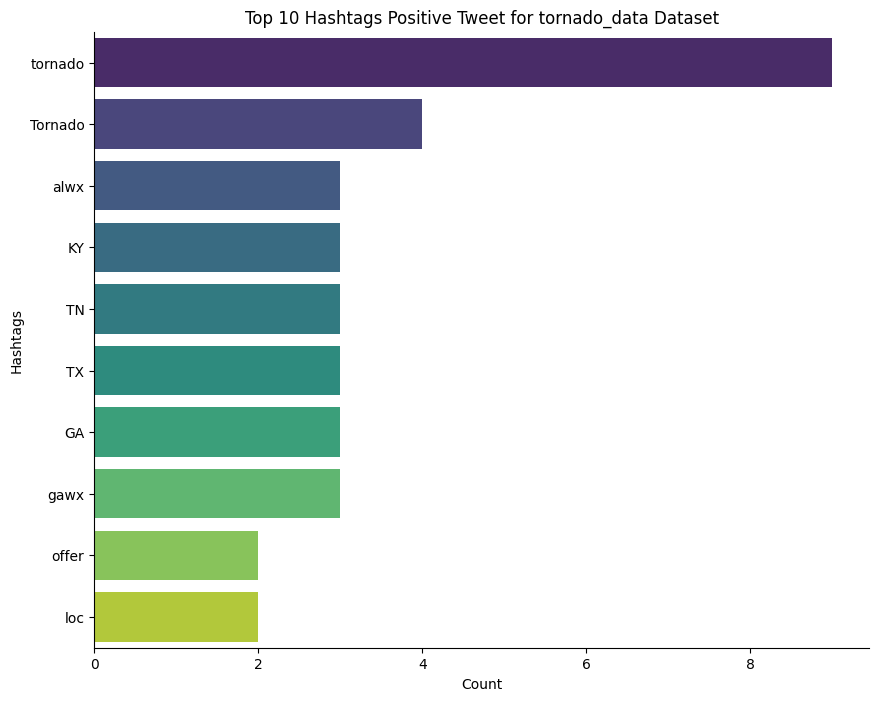

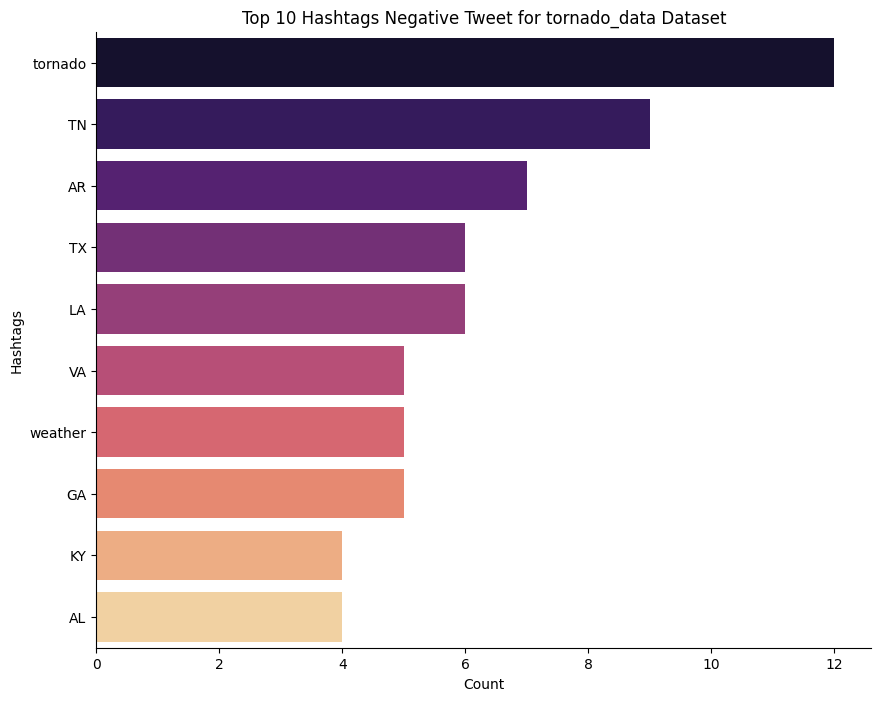

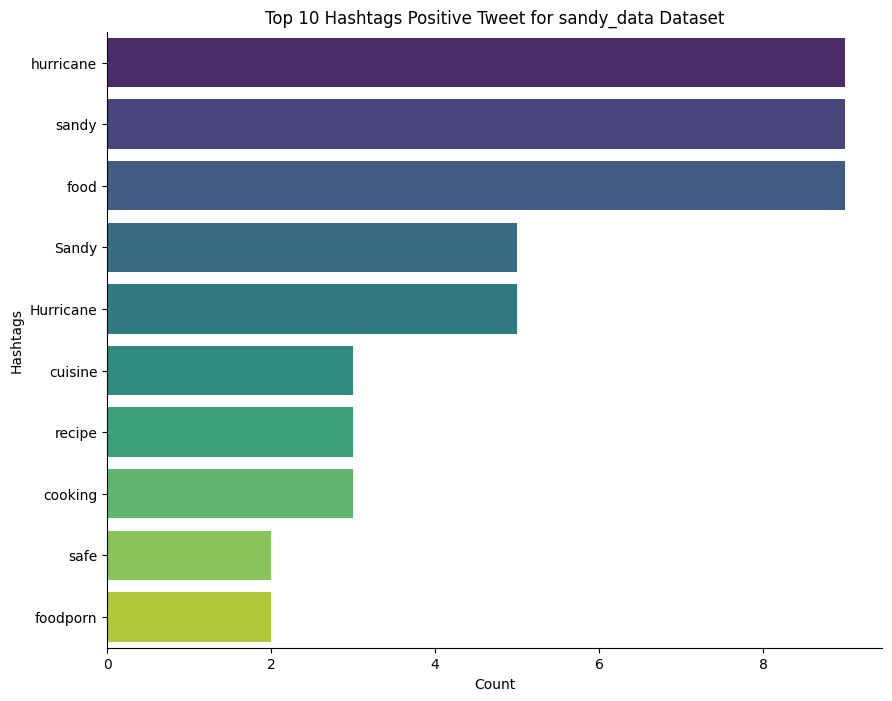

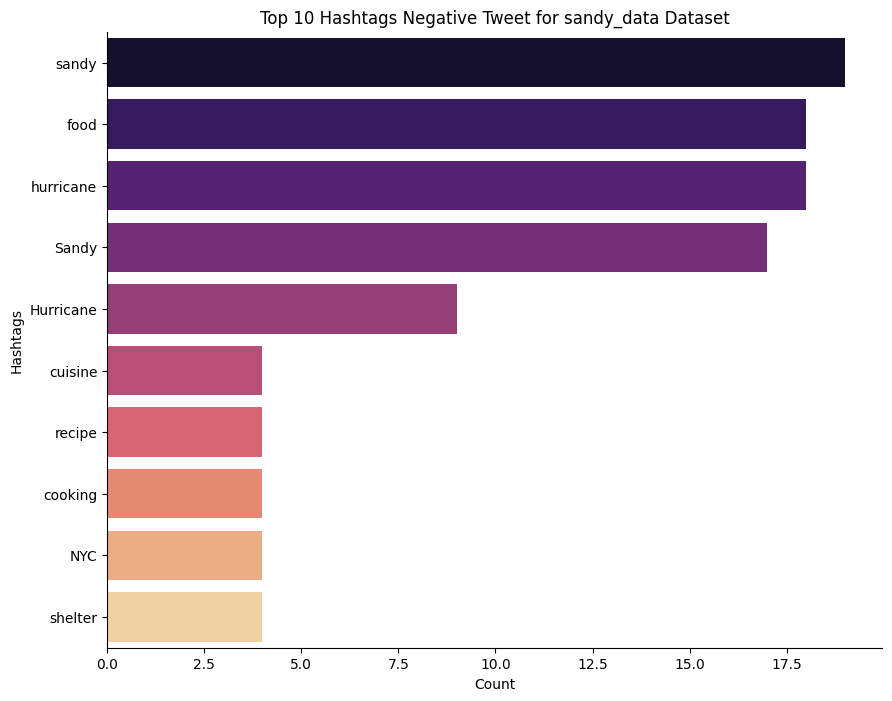

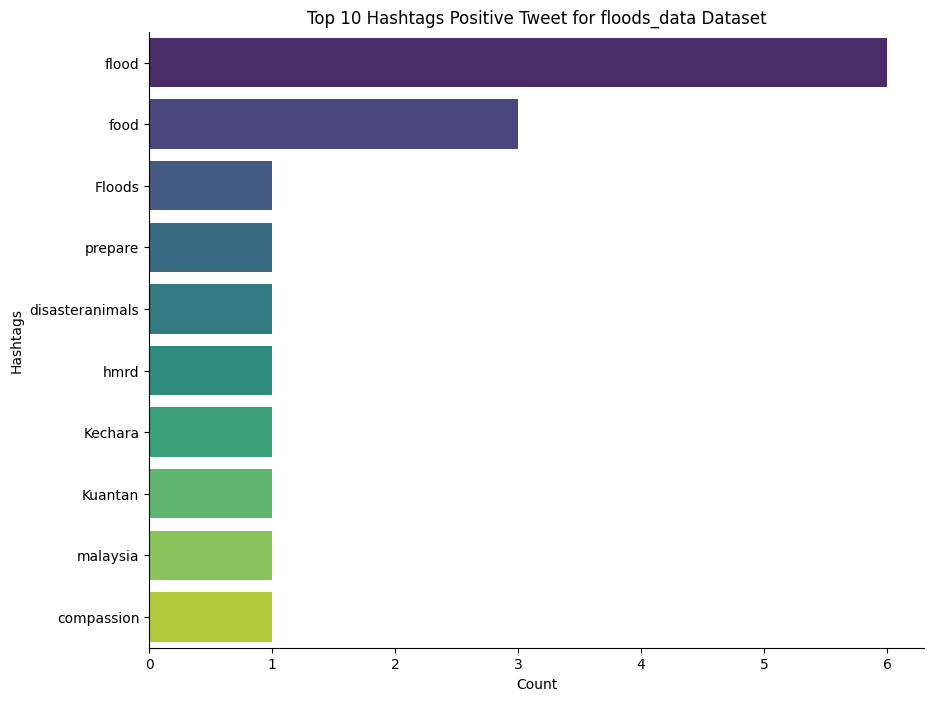

...

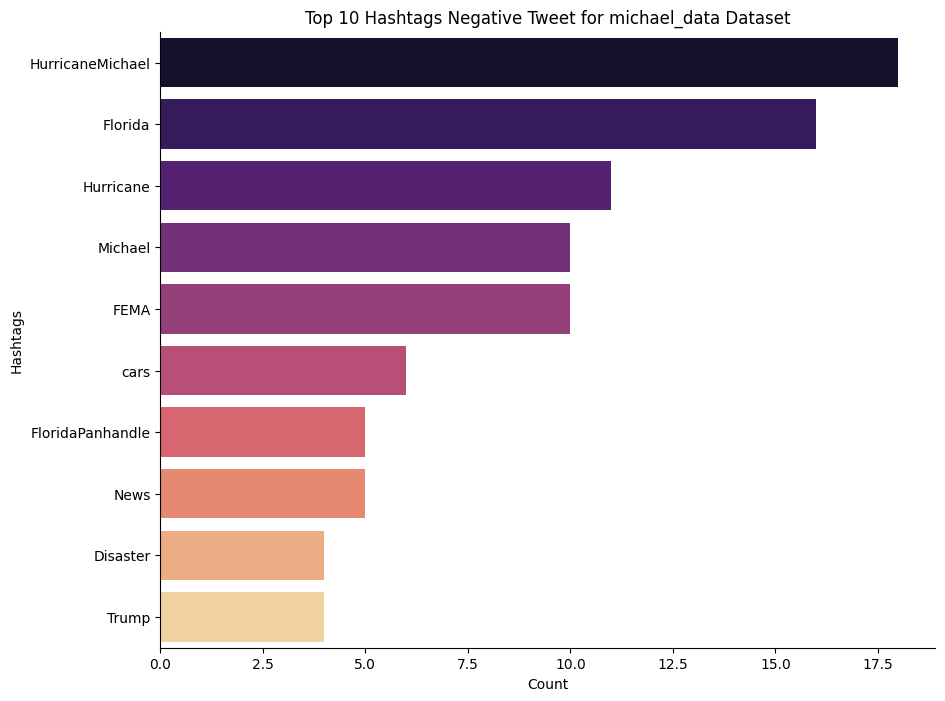

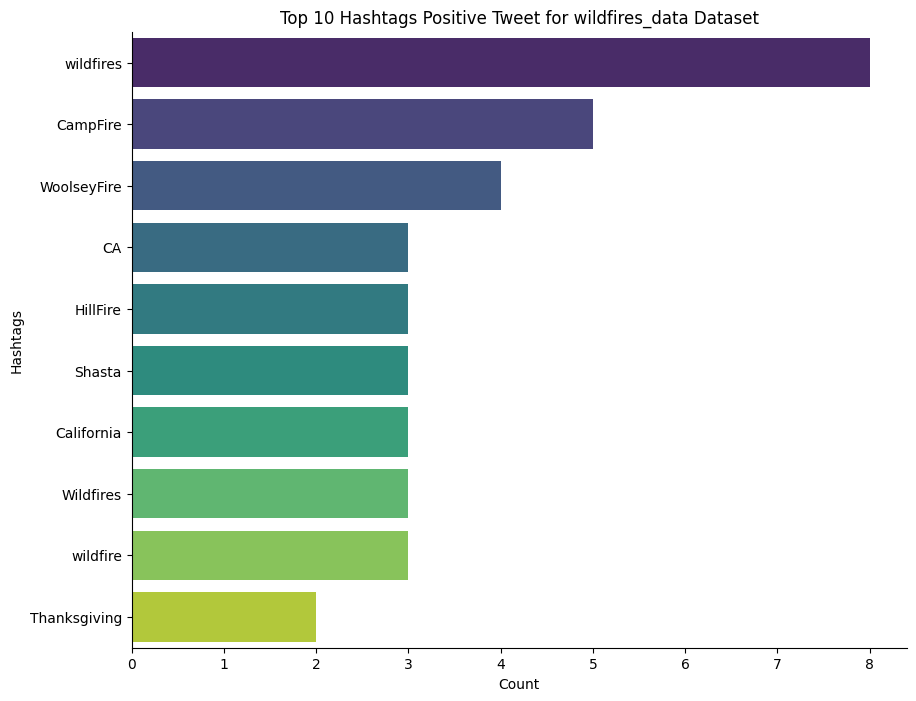

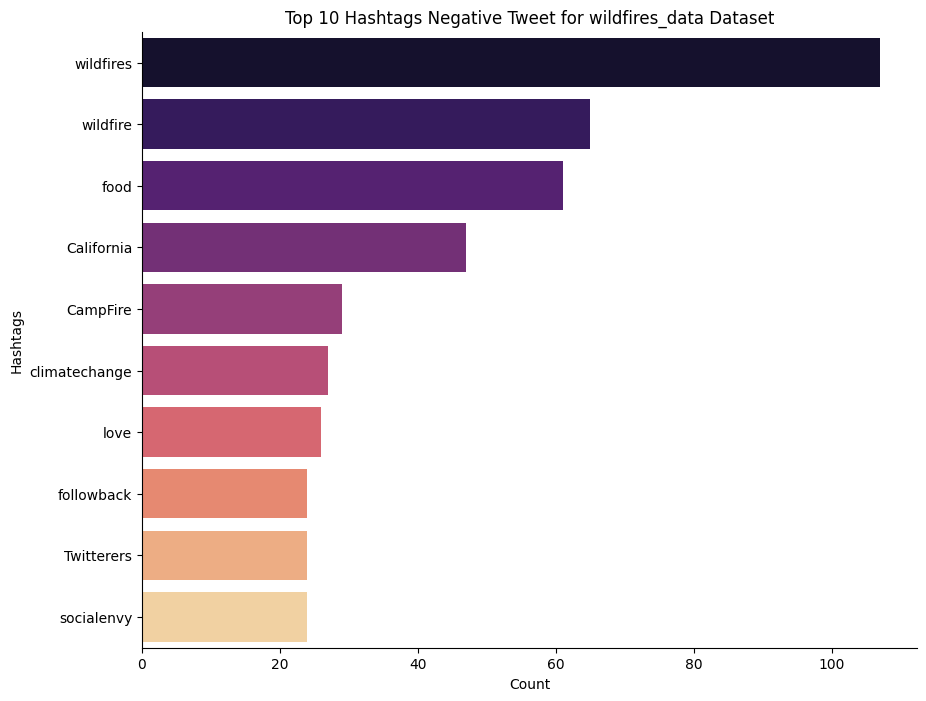

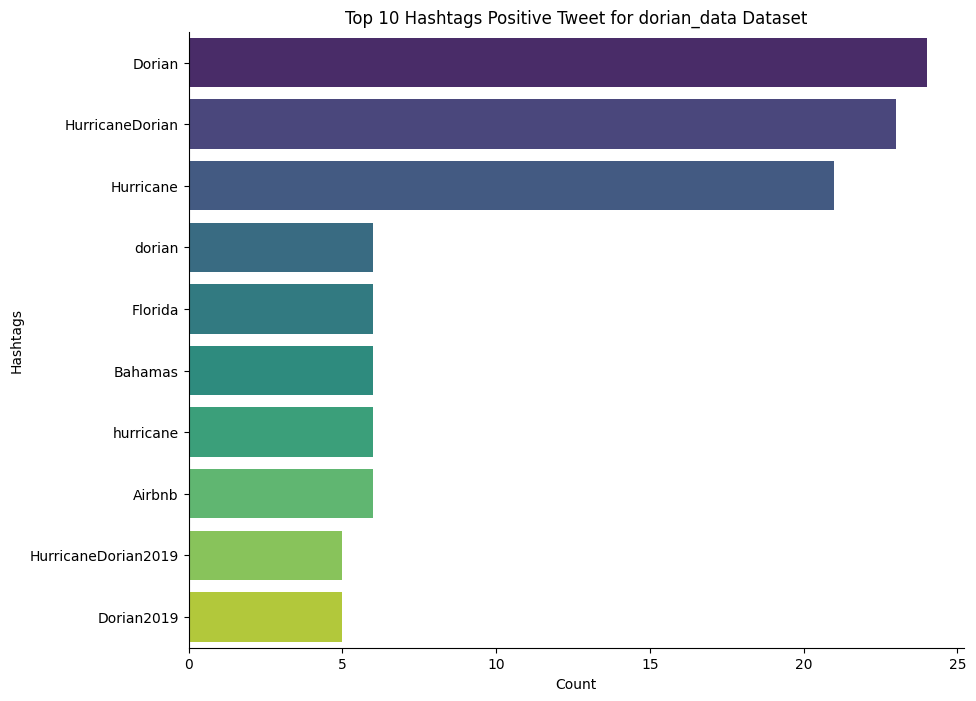

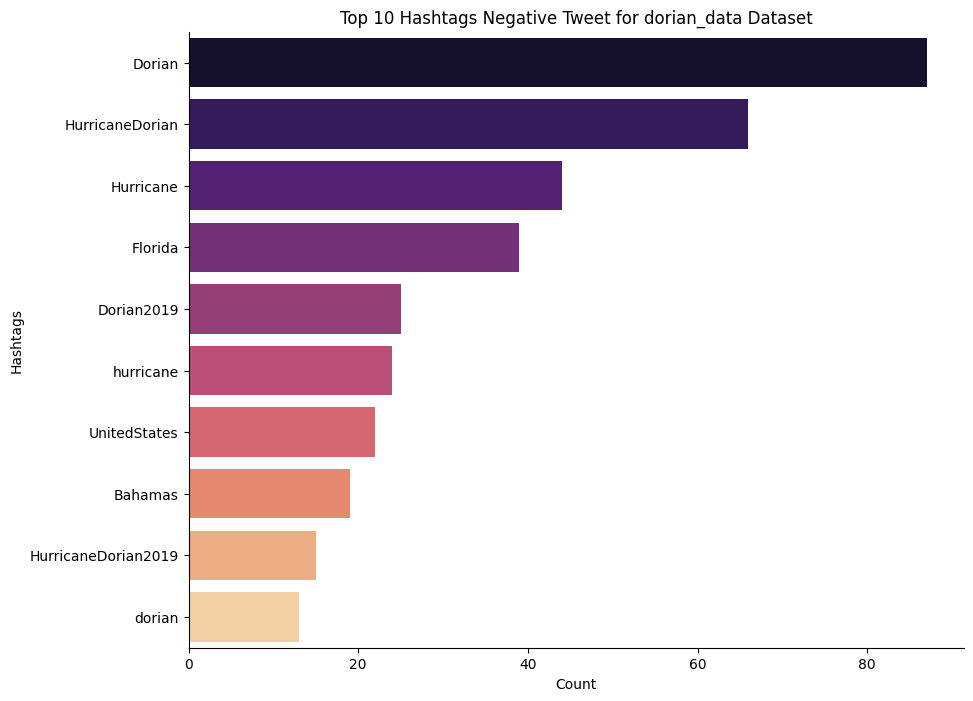

In [223]:
for name in data_dict.keys():
    # storing  positive and negative frequency distributions for the dataset
    positive_word_freq = positive_freq_dist_dict[name]
    negative_word_freq = negative_freq_dist_dict[name]

    # transform the positive frequency distribution to a DataFrame
    positive_df = pd.DataFrame({
        'Hashtags': list(positive_word_freq.keys()),
        'Count': list(positive_word_freq.values())
    })

    # transform the negative frequency distribution to a DataFrame
    negative_df = pd.DataFrame({
        'Hashtags': list(negative_word_freq.keys()),
        'Count': list(negative_word_freq.values())
    })

    # Select top 20 hashtags for positive and negative
    positive_df_plot = positive_df.nlargest(10, columns='Count')
    negative_df_plot = negative_df.nlargest(10, columns='Count')

    # Plotting
    plt.figure(figsize=(10, 8))
    sns.barplot(data=positive_df_plot, y='Hashtags', x='Count', palette='viridis')
    plt.title(f"Top 10 Hashtags Positive Tweet for {name} Dataset")
    plt.xlabel("Count")
    plt.ylabel("Hashtags")
    sns.despine()
    plt.show()

    plt.figure(figsize=(10, 8))
    sns.barplot(data=negative_df_plot, y='Hashtags', x='Count', palette='magma')
    plt.title(f"Top 10 Hashtags Negative Tweet for {name} Dataset")
    plt.xlabel("Count")
    plt.ylabel("Hashtags")
    sns.despine()
    plt.show()

### Positive hastags and Negative hastags refers to hastags used in tweets to convey positive and negative sentiments.
#### Positive hastags implys the tweet contents expresses favorable or positive sentiment
#### Negative hastags implys the tweet contents denotes negative sentiment or unfavorable sentiments

### The positive hashtags in tornado_data dataset represent positive messages, pledginig aid, share stories of resilience and encourage donations. Many tweets with words like tornado, severe highlights  assistance and humanitarian aid provided by various bodies. 
### However on the negative hastags, the words like tornado, food, tnwx represent distruction cause by the tornado and brings out negative emotion. It reflect grief, despairs in people who are sharing the news of tragic event.


### For the dataset dorian_data, 
#### Dorian in positive tweets reflects positive sentiments like recovery efforts, help, aid for DORAIN hurricane
#### However, the same #DORIAN in negative hastags refers to negative sentiments like distruction, death, damages cause by DORIAN hurricane


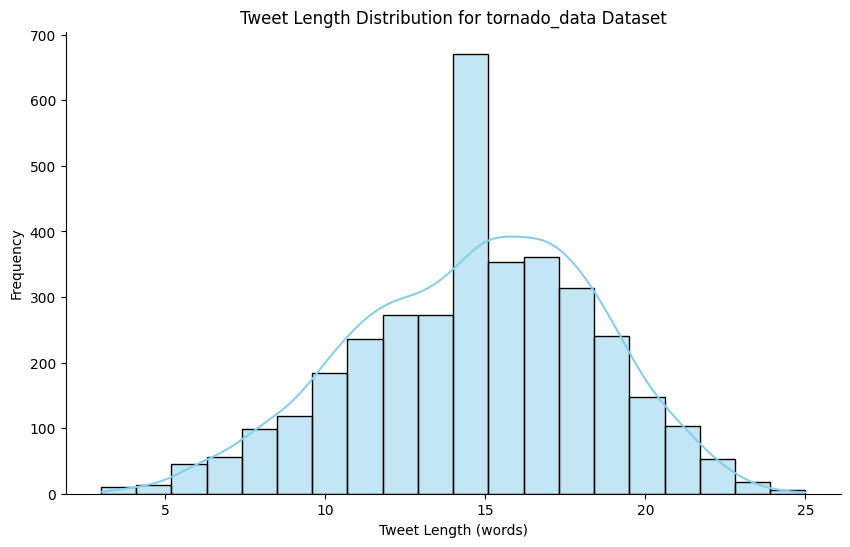

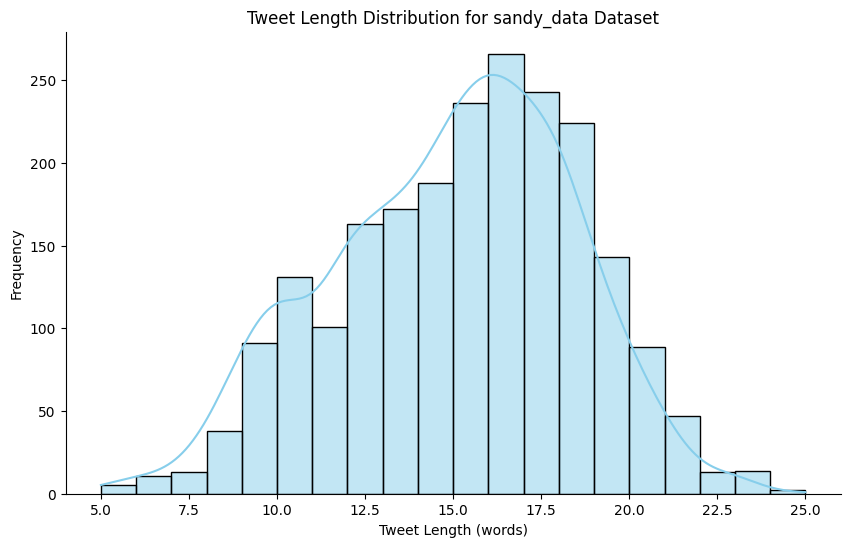

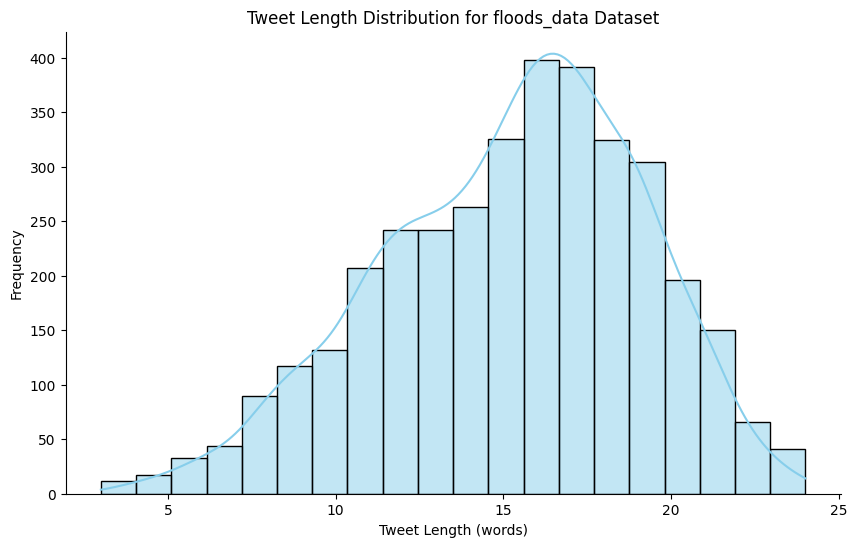

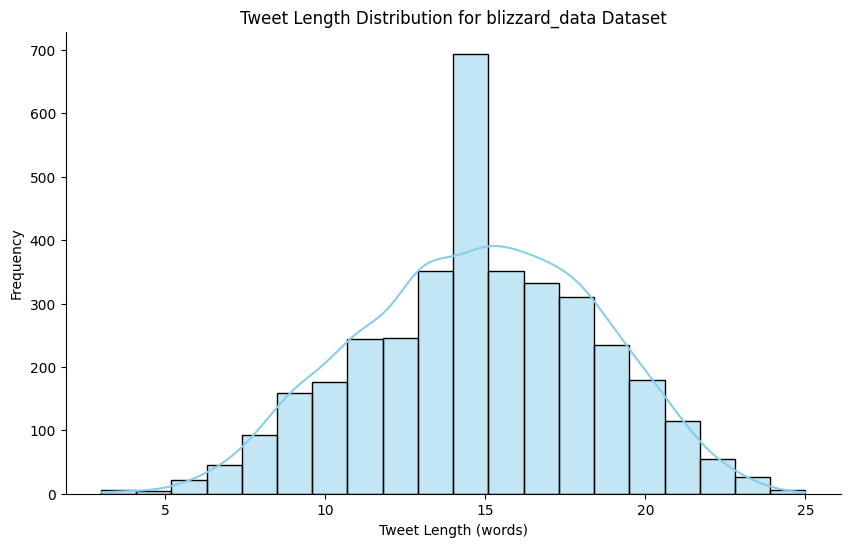

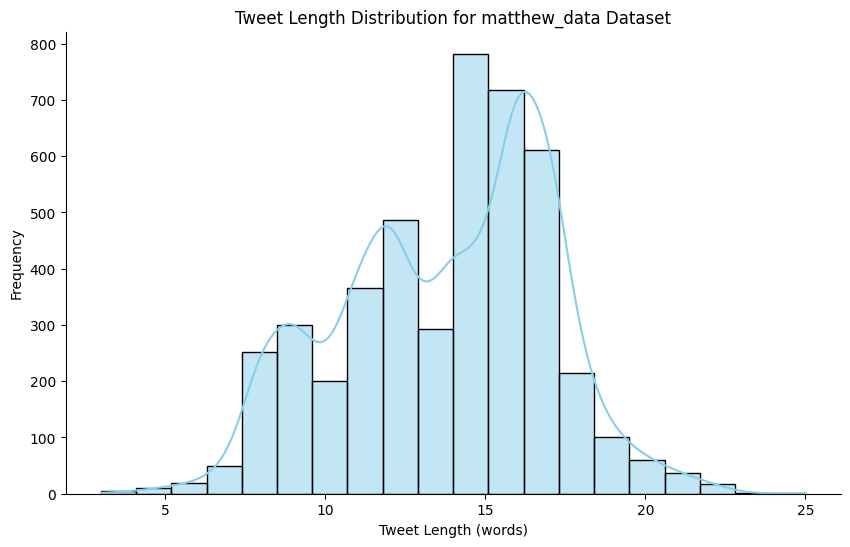

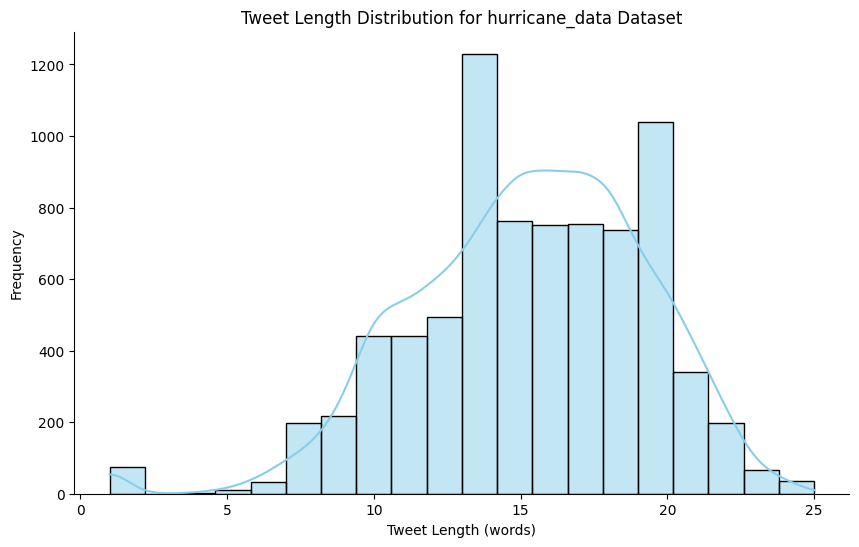

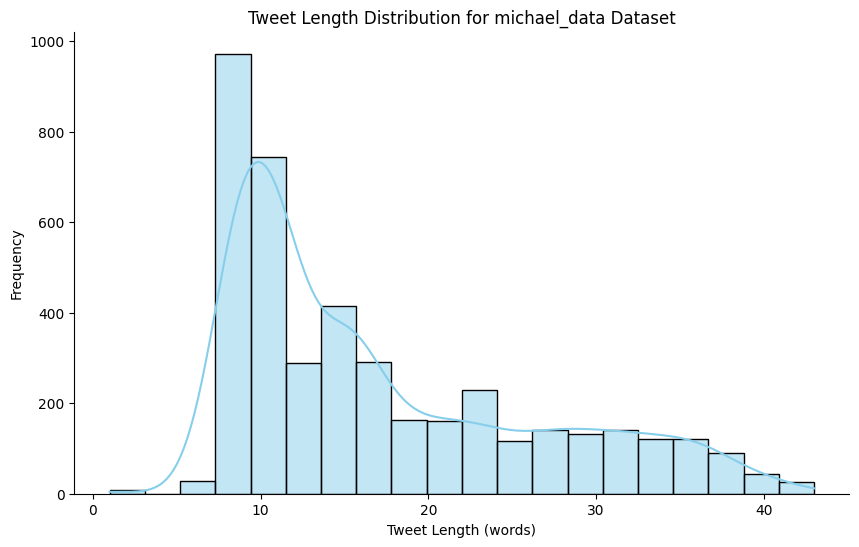

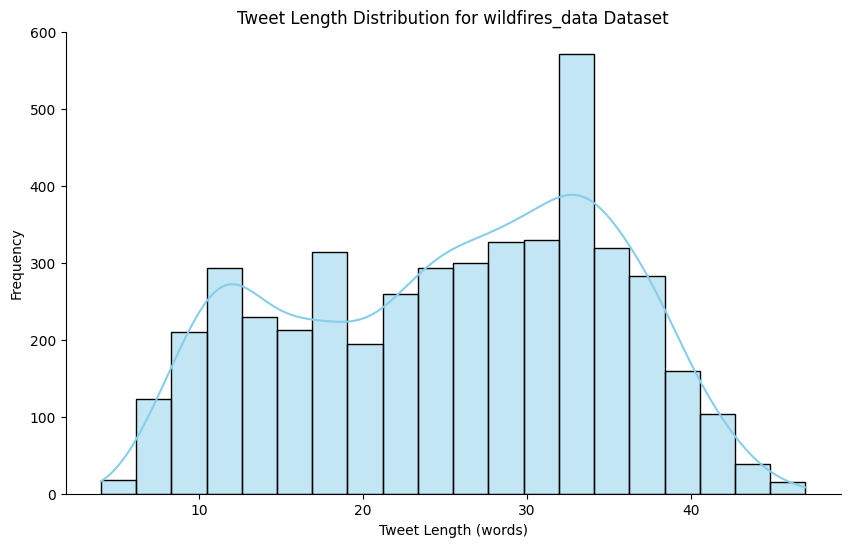

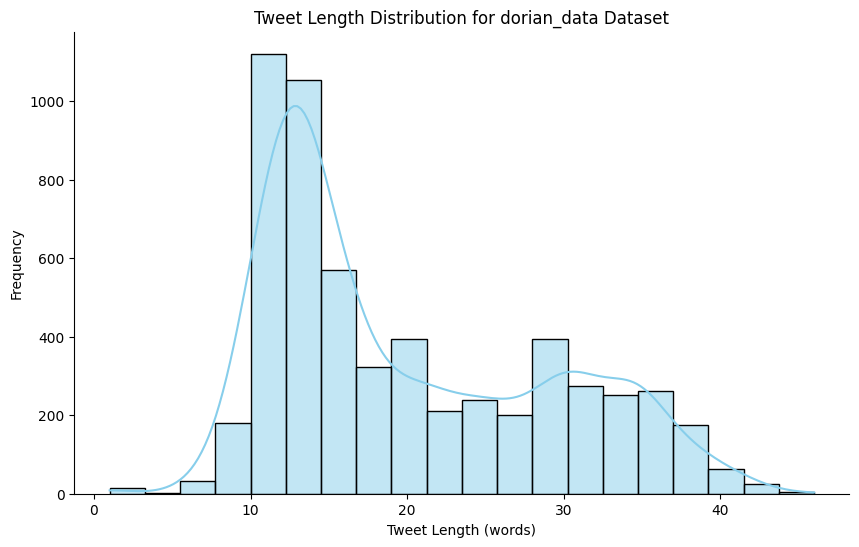

In [224]:
# Iterate over each dataset in data_dict
for name, data in data_dict.items():
    # Check if 'tweet' column exists
    if 'clean_tweet' in data.columns:
        # Calculate the length of each tweet (in terms of word count)
        data['tweet_length'] = data['clean_tweet'].apply(lambda x: len(x.split()))
        
        # Plotting the histogram for tweet length
        plt.figure(figsize=(10, 6))
        sns.histplot(data['tweet_length'], bins=20, kde=True, color="skyblue")
        
        # Set title and labels
        plt.title(f"Tweet Length Distribution for {name} Dataset")
        plt.xlabel("Tweet Length (words)")
        plt.ylabel("Frequency")
        sns.despine()
        plt.show()
    else:
        print(f"No 'tweet' column in the '{name}' dataset.")

### According to the distribution, the majority of tweets in the tornado_data dataset are around 15 words long, with a smaller number of tweets being extremely short or lengthy. According to this pattern, users typically communicate information about tornadoes in a reasonable amount of time, striking a balance between being succinct and providing enough detail to convey important information. Additionally, the bell-shaped distribution suggests a uniform strategy among users, probably with the goal of optimizing impact and clarity within a predetermined tweet length.

### According to the sandy_data dataset's tweet length distribution, the majority of tweets are between 15 and 17 words long, with a smaller percentage being extremely short or lengthy. This pattern indicates that consumers want information about Hurricane Sandy to be presented in a moderate amount of time, providing sufficient context while still being succinct. The bell-shaped distribution implies a consistent approach to tweet length, possibly driven by the need to offer effective updates within the customary restrictions of a tweet.

### With a symmetric spread around this core value, the distribution reveals that the majority of tweets in the floods_data dataset are around 15 words long. According to this pattern, users prefer to tweet about floods at a modest length that strikes a balance between readability and information. A consistent length preference is reflected in the bell-shaped distribution, suggesting that users may be concentrating on conveying brief yet informative messages about flooding incidents.

### Tweets that are 15 words or less are strongly preferred in the blizzard_data dataset, while extremely short and very long tweets are less common. According to this distribution, users are more inclined to make brief updates or observations about blizzards and choose a length that is both succinct and adequately descriptive. Users appear to strive for readability and impact within a reasonable word count, as seen by the bell-shaped, symmetric distribution, which shows a consistent approach to tweet length.

### The matthew_data dataset reveals a symmetric distribution about this center value, indicating a strong tendency for tweets of about 15 words. According to this pattern, users prefer to convey information about Hurricane Matthew in tweets that are moderately long, striking a balance between conciseness and detail. Users are constant in their tweet length, probably striving for effect and accuracy when presenting hurricane-related updates or observations, according to the bell-shaped, normal-like pattern.

### With a nearly symmetric distribution around this center value, the hurricane_data dataset demonstrates a strong preference for tweets that are between 15 and 17 words long. This trend indicates that while talking about hurricanes, users typically choose tweets that are moderately long, allowing for the inclusion of important details while yet being succinct. The distribution shows a consistent approach to tweet length with the goal of communicating hurricane events effectively.

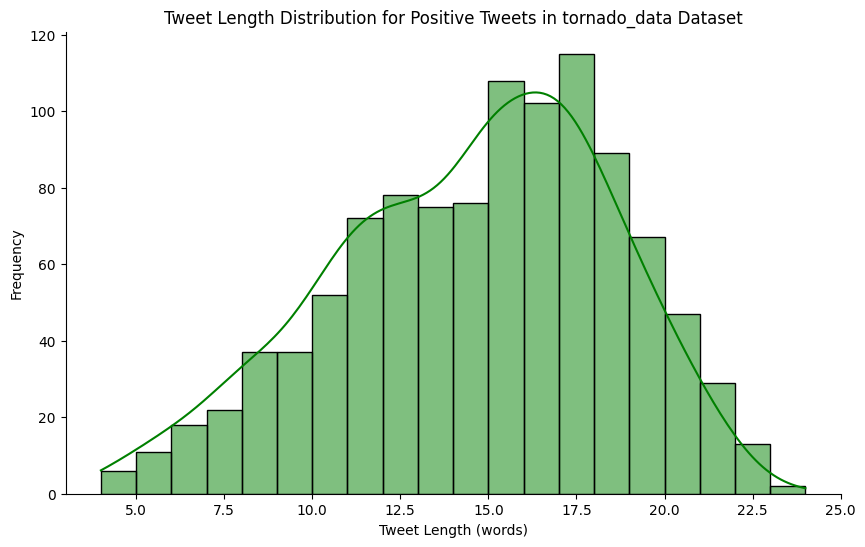

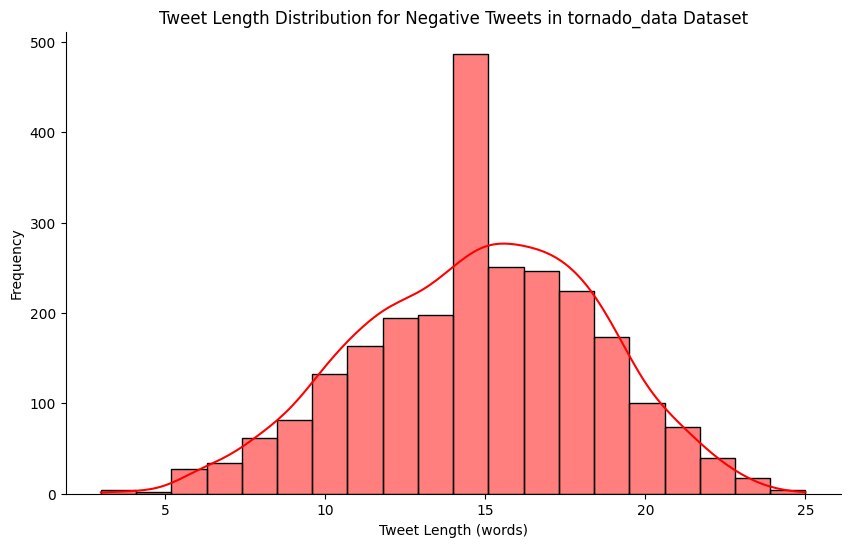

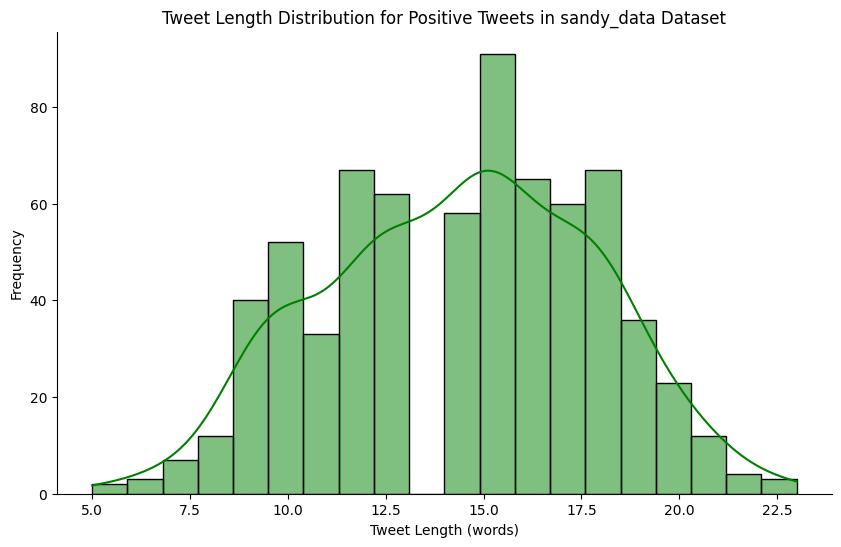

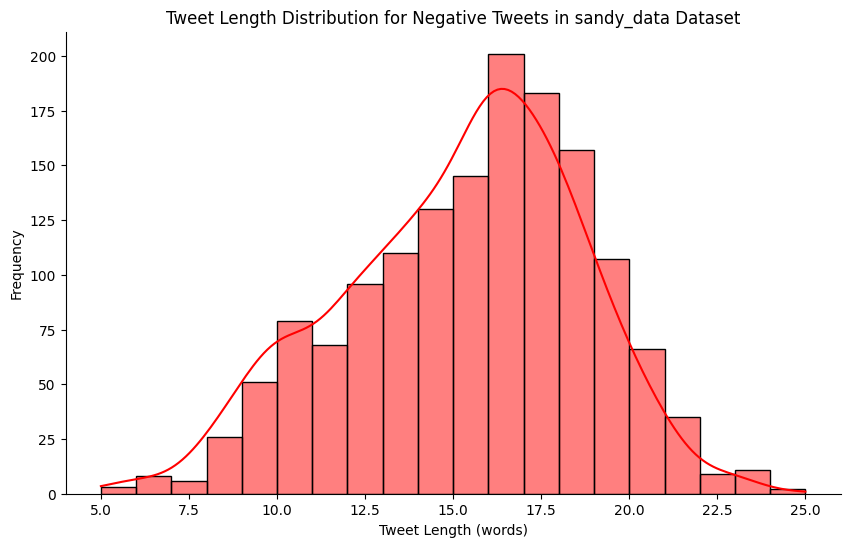

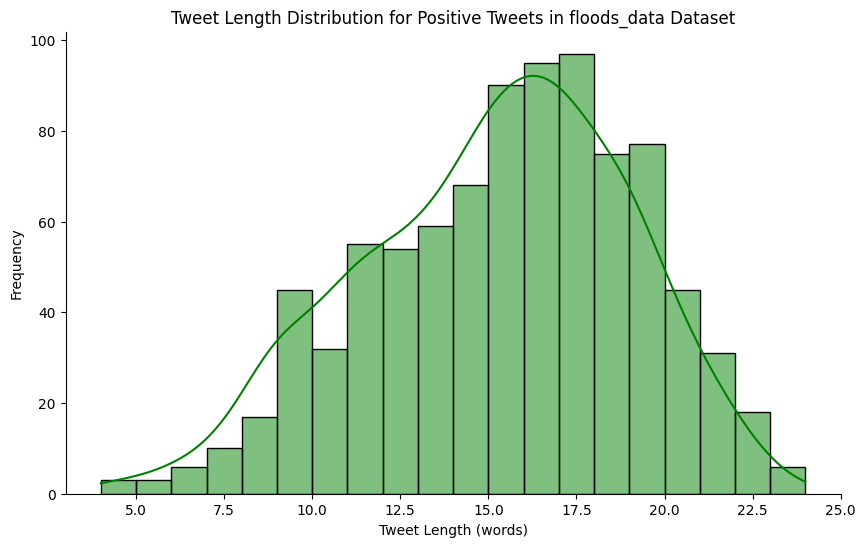

...

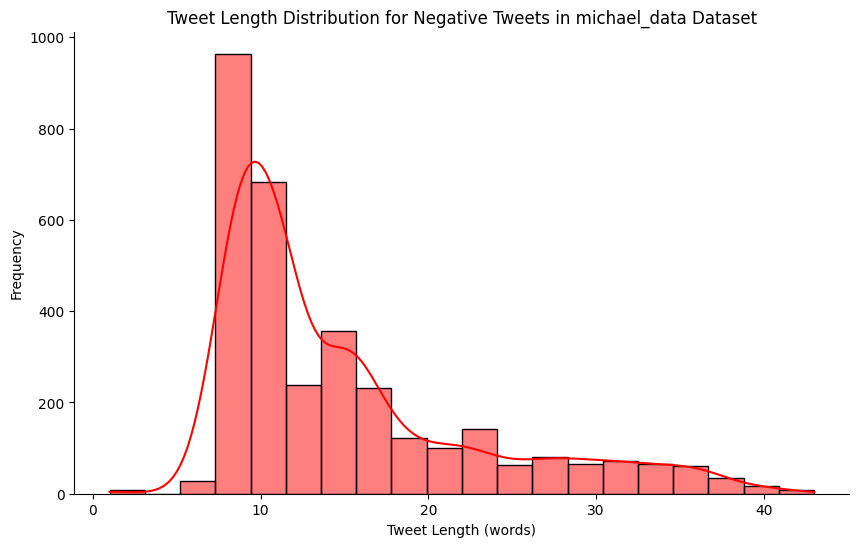

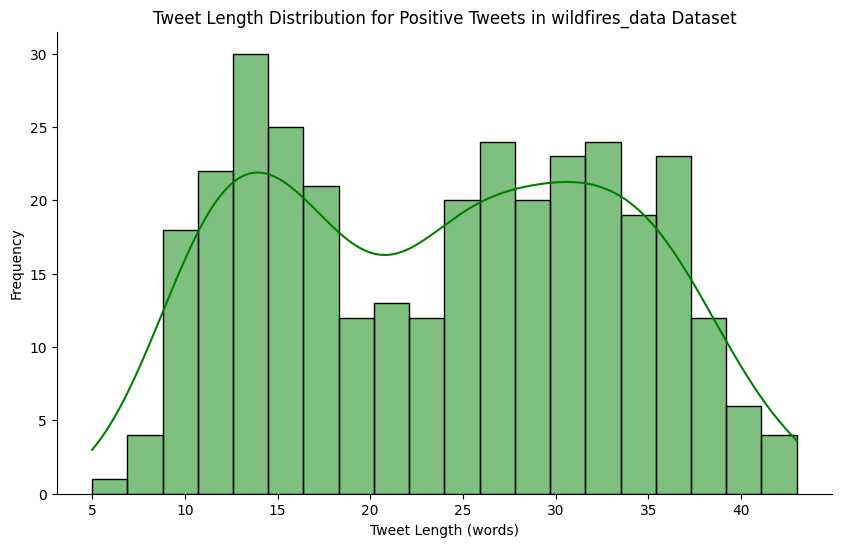

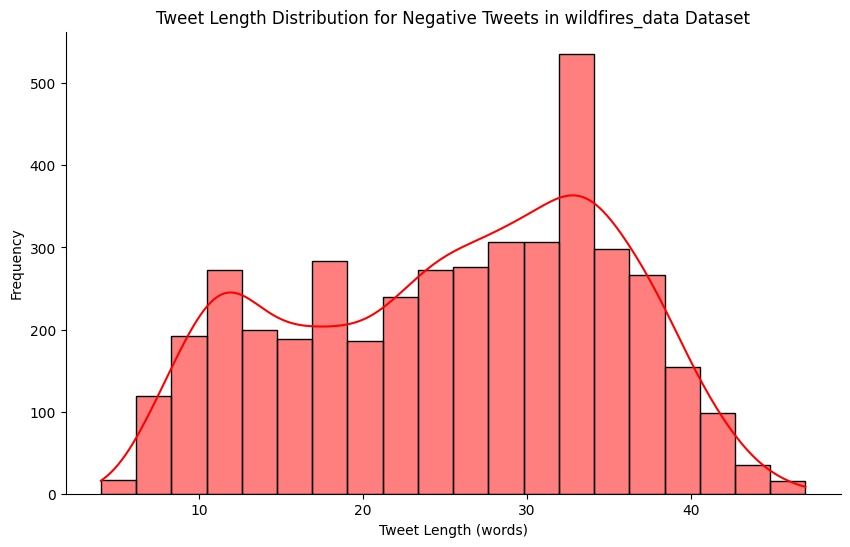

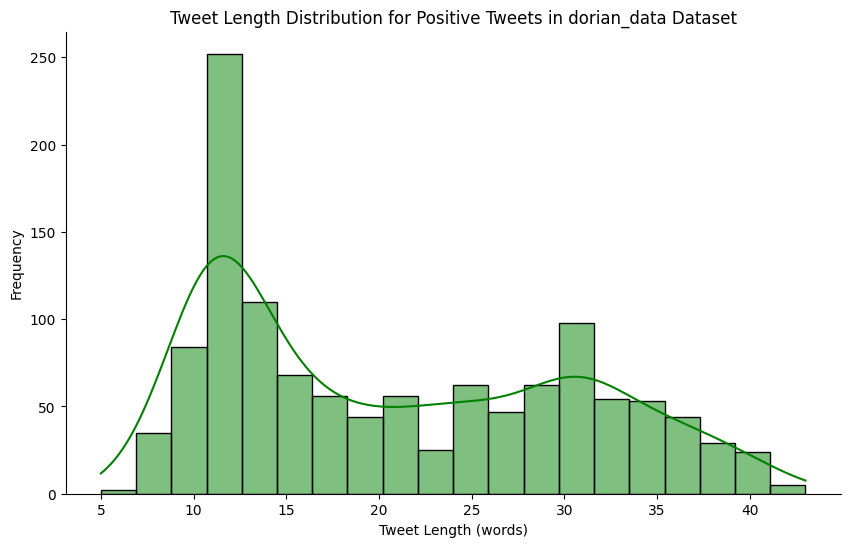

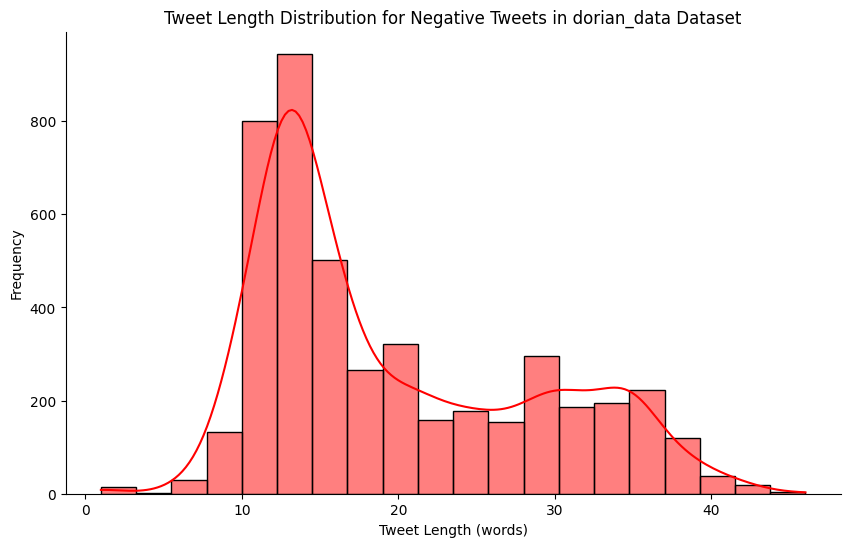

In [225]:
for name, data in data_dict.items():
    # Check if 'tweet' and 'label' columns exist
    if 'clean_tweet' in data.columns and 'label' in data.columns:
        
        # Calculate tweet lengths (in terms of word count)
        data['tweet_length'] = data['clean_tweet'].apply(lambda x: len(x.split()))

        # Separate positive and negative tweets based on the label
        positive_tweets = data[data['label'] == 'positive']
        negative_tweets = data[data['label'] == 'negative']
        
        # Plot histogram for positive tweet lengths
        plt.figure(figsize=(10, 6))
        sns.histplot(positive_tweets['tweet_length'], bins=20, kde=True, color="green")
        plt.title(f"Tweet Length Distribution for Positive Tweets in {name} Dataset")
        plt.xlabel("Tweet Length (words)")
        plt.ylabel("Frequency")
        sns.despine()
        plt.show()
        
        # Plot histogram for negative tweet lengths
        plt.figure(figsize=(10, 6))
        sns.histplot(negative_tweets['tweet_length'], bins=20, kde=True, color="red")
        plt.title(f"Tweet Length Distribution for Negative Tweets in {name} Dataset")
        plt.xlabel("Tweet Length (words)")
        plt.ylabel("Frequency")
        sns.despine()
        plt.show()
    else:
        print(f"The '{name}' dataset does not contain the required 'tweet' and 'label' columns.")

### The tornado_data dataset shows normal distribution for the positive tweets and they have average length of 15 words. It refers individual prefer to convey positive message about tornado in 15 words tweets.
### However, for the negative tweets histogram  typically follow a normal distribution and are about 17 words long. According to this pattern, people may be more thorough or expressive in their negative tweets about tornadoes than in their significantly shorter favorable ones. 

### The sandy_data dataset has a normal distribution and typically clusters around 17 words. This implies that when expressing good feelings on Sandy, medium-length tweets are preferred more than very short or extremely long tweets.
### However, the negative tweets for sandy_data dataset has a normal distribution and normally contains 15 words. This suggests that individuals tend to use more brief tweets than positive ones when expressing unfavorable views about Sandy, and that they prefer an average length.

### The positive tweets in the floods_data dataset often have normal distribution pattern and average roughly 15 words in length. The users are more likely to communicate favorable thoughts about floods in moderately long tweets than in very short or extremely long ones.
### The negative tweets in floods_data dataset elaborate expression for negative emotions, since people prefer moderately long tweets to express negative thoughts regarding floods, which are slightly longer than those used for good sentiments. The average word for the tweet is 17 words

### The histogram for the positive tweets in blizzard_data have a normal distribution and are typically 15 words long. This pattern shows that people favor medium-length tweets over shorter or longer ones when discussing blizzards in a positive way.
### However, the histogram for negative tweets display a bimodal distribution with peaks at between 10 and 17 words. This implies that blizzard-related unfavorable attitudes are expressed in tweets that are either brief or relatively extensive.

### Performing tokenization

In [226]:
# dictionary to store tokeanized tweets
tokenized_tweet_dict = {}

for name, data in data_dict.items():
    # Check if 'clean_tweet' column exists
    if 'clean_tweet' in data.columns:
        # Tokenize the tweets by splitting each tweet into words
        tokenized_tweet_dict[name] = data['clean_tweet'].apply(lambda x: x.split())
    else:
        print(f"No 'clean_tweet' column in the '{name}' dataset.")

for dataset_name, tokenized_tweets in tokenized_tweet_dict.items():
    print(f"\nTokenized Tweets for {dataset_name} dataset:")
    print(tokenized_tweets.head())



Tokenized Tweets for tornado_data dataset:
0    [Please, Food, needed, for, shelter, area, tha...
1    [Please, Food, needed, for, shelter, area, tha...
2    [‚ô°its, raining, and, tornado, warnings....ab...
3    [Lmao, #damn, don't, get, any, food, hope, the...
4    [Saved, the, tornado, warning....I'm, just, re...
Name: clean_tweet, dtype: object

Tokenized Tweets for sandy_data dataset:
0    [They, make, Hurricane, Sandy, sound, like, bi...
1    [The, kitchen, was, out, mad, food, tonight, t...
2    [Hundreds, not, thousands, people, lost, their...
3    [right, now:, -The, Heat, -The, Lakers, -Hurri...
4    [#YouGainMajorPointsIf, you, dollarama, while,...
Name: clean_tweet, dtype: object

Tokenized Tweets for floods_data dataset:
0    [It's, Ok,, Manchester's, off, flood, alert., ...
1    [Love, how, you, ask, for, tiny, bit, sauce,, ...
2    [Dif, tailgate!!, Morning, games, and, good, f...
3    [much, food, I've, eaten, today,, I'm, going, ...
4    [‚Äú:, Can't, wait, for, the, 

### installing and utilizing tensorflow for Natrual Language processing

In [227]:
from tensorflow.keras.preprocessing.text import Tokenizer
token = Tokenizer()
for name, data in data_dict.items():
     # Check if 'clean_tweet' column exists
    if 'clean_tweet' in data.columns:
        ### Fit to text help to assign each word a number based on the order of appearence
        token.fit_on_texts(data['clean_tweet'])
        print(f"\nFit to text for {name} dataset completed.")
    else:
        print(f"No 'clean_tweet' column in the '{name}' dataset.")


Fit to text for tornado_data dataset completed.

Fit to text for sandy_data dataset completed.

Fit to text for floods_data dataset completed.

Fit to text for blizzard_data dataset completed.

Fit to text for matthew_data dataset completed.

Fit to text for hurricane_data dataset completed.

Fit to text for michael_data dataset completed.

Fit to text for wildfires_data dataset completed.

Fit to text for dorian_data dataset completed.


### Fit to text help to assign each word a number based on the order of appearence

In [228]:
# Finding the vocab size
vocab_size = len(token.word_index)+1
print("The vocabulary size is : {}".format(vocab_size))

The vocabulary size is : 52134


### After procerssing the fit to text data, our data is tokeanzied containing unique words, so we have 52134 numbers of unique words or vocabulary for the model

In [229]:
# ## pad_sequence helps to standarize the sequence lengths by padding them with zero . 
# ### for our instance from the encoded text if its length is less than 130 it will standarize it to 120 by adding 0.
# from tensorflow.keras.preprocessing.sequence import pad_sequences

# # Considering 130 words for capturing important text context also to avoide irrelevant words and informations
# max_length = 130 
# ### pad sequence will standarized our encoded text and fill the gap to standarize to 130 by adding 0.

#### encoding the text and utilizing pad_sequences function to standarized the encoded text

In [230]:
# # Encoding tokens in words to numerical formats
# encoded_text =[]
# for name, data in data_dict.items():
#      # Check if 'clean_tweet' column exists
#     if 'clean_tweet' in data.columns:
#         encoded_text = token.texts_to_sequences(data['clean_tweet'])
#         # encoded_text_test = token.texts_to_sequences(text_test)
#         print(f"\nEncoded text for the {name} dataset:")
#         print(encoded_text[:2])
#         X = pad_sequences(encoded_text,maxlen=max_length,padding='post')
#         print("\n")
#         print(f"\nStandarized using padded sequence for the {name} dataset:")
#         print(X)

### Steamming
#### Steamming is the process of reducing words to their root or base form. 
#### Steammer helps to reduce words like ruinning, runner and ran to STEAM word "RUN"

In [231]:
## libarary for STEAMMING
from nltk.stem import PorterStemmer
tornado_data.head()
## initializing porter steammer
stemmer = PorterStemmer()

In [232]:
for dataset_name, tokenized_tweets in tokenized_tweet_dict.items():
    ##steamming the tweets
    stemmed_tweets = tokenized_tweets.apply(lambda sentence: [stemmer.stem(word) for word in sentence])
    ## joining the steammed text into sequence of text
    stemmed_tweets = stemmed_tweets.apply(lambda words: ' '.join(words))
    ## replacing clean_tweet contents with steammed_tweets
    data_dict[dataset_name]['clean_tweet'] = stemmed_tweets
    tokenized_tweets.head()
    print(f"\nStemmed Tweets for {dataset_name} dataset.")
    print(f"\nStemmed Tweets for has been replaced with clean_tweets for {dataset_name} dataset.")
    print(data_dict[dataset_name]['clean_tweet'].head())


Stemmed Tweets for tornado_data dataset.

Stemmed Tweets for has been replaced with clean_tweets for tornado_data dataset.
0    pleas food need for shelter area that wa hit h...
1    pleas food need for shelter area that wa hit h...
2    ‚ô°it rain and tornado warnings....about coma ...
3    lmao #damn don't get ani food hope the tornado...
4    save the tornado warning....i'm just readi eat...
Name: clean_tweet, dtype: object

Stemmed Tweets for sandy_data dataset.

Stemmed Tweets for has been replaced with clean_tweets for sandy_data dataset.
0    they make hurrican sandi sound like big deal. ...
1    the kitchen wa out mad food tonight told the c...
2    hundr not thousand peopl lost their home and l...
3    right now: -the heat -the laker -hurrican sand...
4    #yougainmajorpointsif you dollarama while hurr...
Name: clean_tweet, dtype: object

Stemmed Tweets for floods_data dataset.

Stemmed Tweets for has been replaced with clean_tweets for floods_data dataset.
0    it' ok, manch

In [233]:
tornado_data.head()

,tweets,label,clean_tweet,polarity,subjectivity,polarity_label,tweet_length
0,RT @uberdogfound: Please RT - Food needed for ...,negative,pleas food need for shelter area that wa hit h...,-0.291667,0.541667,negative,14
1,Please RT - Food needed for shelter in NC in a...,negative,pleas food need for shelter area that wa hit h...,-0.364583,0.541667,negative,15
2,‚ô°its raining and tornado warnings....about t...,negative,‚ô°it rain and tornado warnings....about coma ...,-0.100000,0.000000,negative,12
3,Lmao #damn RT @LuCeCaNNoNn: If I don't get any...,negative,lmao #damn don't get ani food hope the tornado...,0.600000,1.000000,positive,17
4,Saved by the tornado warning....I'm just ready...,positive,save the tornado warning....i'm just readi eat...,0.450000,0.550000,positive,10


### Vectorization for the clean_tweet
#### TF-IDF Features 
##### Term-Frequency (TF): TF measures the frequency of a term (word) in a specific document. It gives higher weight to terms that appear more frequently in the document.
##### Inverse-Document Frequency (IDF): IDF measures how important a term is across a collection of documents, or a corpus. Terms that are common across many documents are given lower weights since they may not provide much information about the uniqueness of a document.


In [234]:
from sklearn.feature_extraction.text import CountVectorizer,  TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from imblearn.over_sampling import SMOTE
## Text Vectorization using TF-IDF
vectorizer = TfidfVectorizer(max_features=5000)

#### Code to plot confusion matrix, accuracy for the model and classification report for the model that we have used

In [235]:

def plot_confusion_heatmap(cm, dataset_name, model_name, is_optimized=None):
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'], linewidths=1, linecolor='black')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'{model_name} Confusion Matrix for {dataset_name} Dataset')
    plt.show()
    


def plot_accuracy(results):
    dataset_names = list(results.keys())
    accuracies = [results[dataset]['accuracy'] for dataset in dataset_names]
    plt.figure(figsize=(10, 5))
    sns.barplot(x=dataset_names, y=accuracies, palette='viridis')
    plt.title("Model Accuracy for Each Dataset")
    plt.xlabel("Dataset")
    plt.ylabel("Accuracy")
    plt.ylim(0, 1) 
    plt.xticks(rotation=45)
    # Add accuracy values on top of each bar
    for index, value in enumerate(accuracies):
        plt.text(index, value + 0.02, f"{value:.2f}", ha='center')  # Adjust `+0.02` to position above bar
    
    plt.show()
    

def plot_classification_report_heatmap(report, dataset_name, model_name):
    data = {
        'Precision': [report['negative']['precision'], report['positive']['precision']],
        'Recall': [report['negative']['recall'], report['positive']['recall']],
        'F1-Score': [report['negative']['f1-score'], report['positive']['f1-score']],
        'Support': [report['negative']['support'], report['positive']['support']]
    }
    df = pd.DataFrame(data, index=['Negative', 'Positive'])

    plt.figure(figsize=(8, 4))
    sns.heatmap(df, annot=True, fmt=".2f", cmap="YlGnBu", cbar=False,linewidths=1, linecolor='black')
    plt.title(f"{model_name} Classification Report for {dataset_name} Dataset")
    plt.xlabel("Metrics")
    plt.ylabel("Class Labels")
    plt.show()

def plot_classification_report(results):
    datasets = []
    metrics = []
    values = []
    labels = []
    model_names = []

    for metrics_data in results.values():
        report = metrics_data['classification_report']
        model_name = metrics_data['model_name']
        dataset_name = metrics_data['dataset_name']
        
        for label in ['negative', 'positive']:
            datasets.append(dataset_name)
            model_names.append(model_name)
            metrics.append('Precision')
            values.append(report[label]['precision'])
            labels.append(label)

            datasets.append(dataset_name)
            model_names.append(model_name)
            metrics.append('Recall')
            values.append(report[label]['recall'])
            labels.append(label)

            datasets.append(dataset_name)
            model_names.append(model_name)
            metrics.append('F1-Score')
            values.append(report[label]['f1-score'])
            labels.append(label)
    
    # Convert to DataFrame for easy plotting with seaborn
    df = pd.DataFrame({
        'Dataset': datasets,
        'Metric': metrics,
        'Value': values,
        'Label': labels,
        'Model': model_names
    })
    
    # Plot the grouped bar chart
    plt.figure(figsize=(12, 6))
    bar_plot = sns.barplot(x='Dataset', y='Value', hue='Metric', data=df, ci=None, palette='Set2')
    plt.title("Classification Report Metrics for Each Model on Each Dataset")
    plt.xlabel("Dataset")
    plt.ylabel("Score")
    plt.ylim(0, 1) 
    plt.xticks(rotation=45)
    plt.legend(title="Metric")
    # Add metric values on top of each bar
    # for p in bar_plot.patches:
    #     bar_plot.annotate(
    #         format(p.get_height(), '.2f'),  
    #         (p.get_x() + p.get_width() / 2., p.get_height()),
    #         ha='center', va='center',
    #         xytext=(0, 8),
    #         textcoords='offset points'
    #     )
    plt.show()

##### 1: 'negative', 0: 'positive'

##  Reusable Model Creation 

In [240]:
def train_and_evaluate_model(model,dataset_name, data, model_name, sampler=None, hyperparameters=None, param_grid=None,label_map={1: 'negative', 0: 'positive'}, test_size=0.33, random_state=42):
    # Check if 'clean_tweet' and 'label' columns exist
    if 'clean_tweet' not in data.columns or 'label' not in data.columns:
        print(f"The dataset does not contain the required 'clean_tweet' and 'label' columns.")
        return None

    # Vectorize the clean_tweet column using TF-IDF
    X = vectorizer.fit_transform(data['clean_tweet'])
    
    # Encode the target labels
    y = data['label'].map(label_map)
    
    
    ## for sampling 
    if sampler:
        X, y = sampler.fit_resample(X, y)
        
    
    # Split the dataset into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)
    
    # Apply hyperparameters to the model
    # if hyperparameters:
    #     try:
    #         model.set_params(**hyperparameters)
    #     except ValueError as e:
    #         print(f"Warning: {e}. Some parameters may not be applicable for the model {model_name}.")
    
     # Apply GridSearchCV if param_grid is provided
    if param_grid:
        grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
        grid_search.fit(X_train, y_train)
        model = grid_search.best_estimator_  # Update model with the best found parameters
        print(f"Best parameters found by GridSearchCV for {model_name}: {grid_search.best_params_}")
    
    # Apply hyperparameters if specified and param_grid is not used
    elif hyperparameters:
        try:
            model.set_params(**hyperparameters)
        except ValueError as e:
            print(f"Warning: {e}. Some parameters may not be applicable for the model {model_name}.")
    
    
    # training the model
    model.fit(X_train, y_train)
    print(model)
    # predict on the test set
    y_pred = model.predict(X_test)
    
    # Calculate accuracy and classification report
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, target_names=list(label_map.keys()), output_dict=True)
    cm = confusion_matrix(y_test,y_pred)

    # to store results
    results = {
        'accuracy': accuracy,
        'classification_report': report,
        "confusion_matrix": cm,
        "model_name": model_name,
        'dataset_name': dataset_name,
    }
    
    return results

### Defining and passing logistic regression

## Base Logistic Regression

In [241]:
# using Logistic Regression
from sklearn.linear_model import LogisticRegression
results = {}
# Iterate through each dataset in data_dict
for name, data in data_dict.items():
    # Call the function with Logistic Regression model for each dataset
    model = LogisticRegression(max_iter=1000)
    results[name] = train_and_evaluate_model(
                    model=model, 
                    data=data, 
                    dataset_name =name, 
                    model_name="Logistic Regression",
                    label_map={'negative': 1, 'positive': 0},
                    test_size=0.33,
                    random_state=42,
                    )


LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)
LogisticRegression(max_iter=1000)


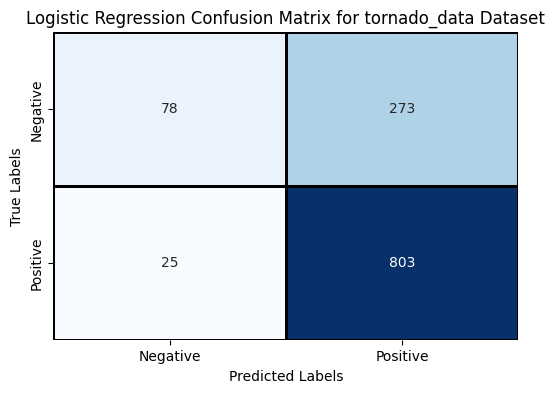

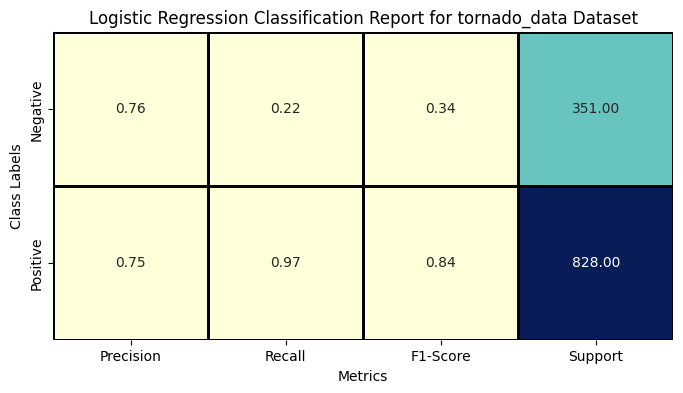

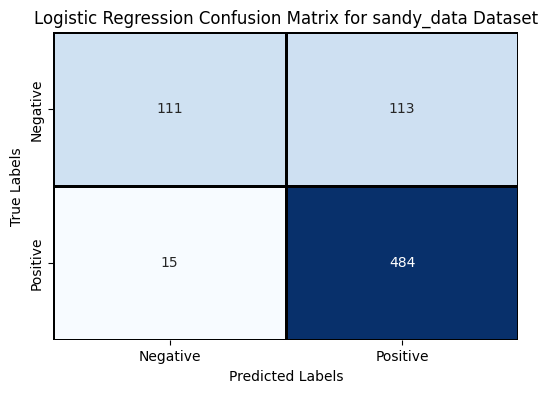

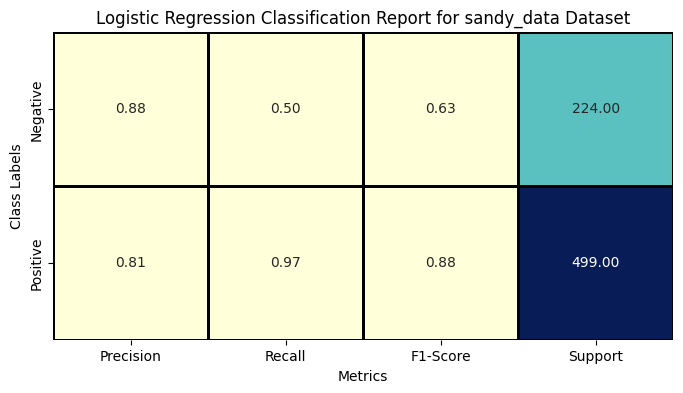

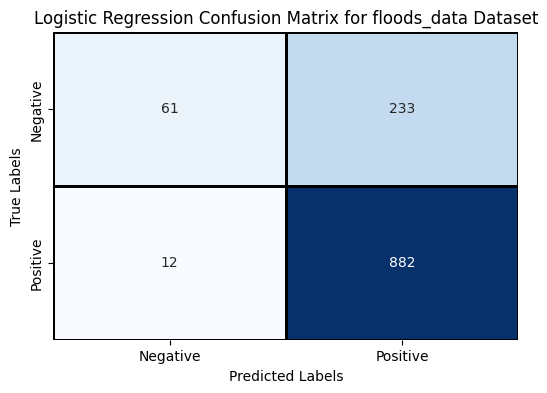

...

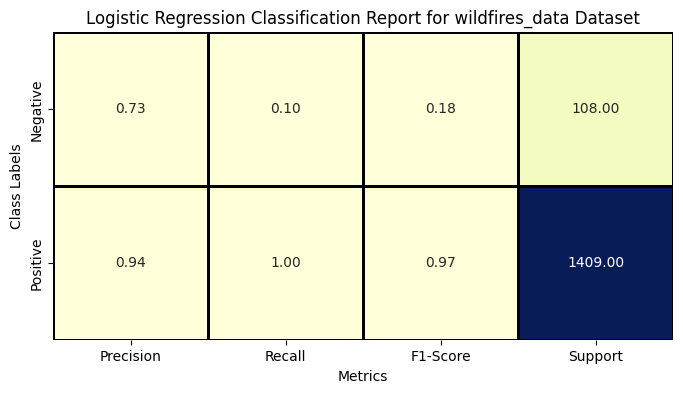

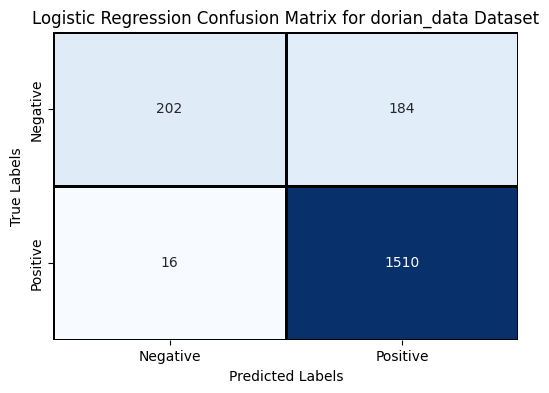

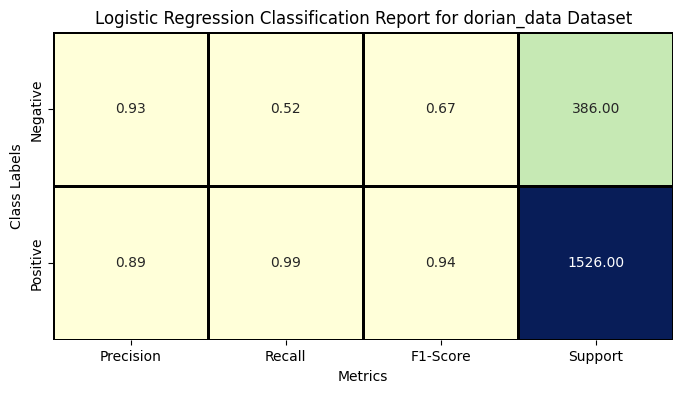

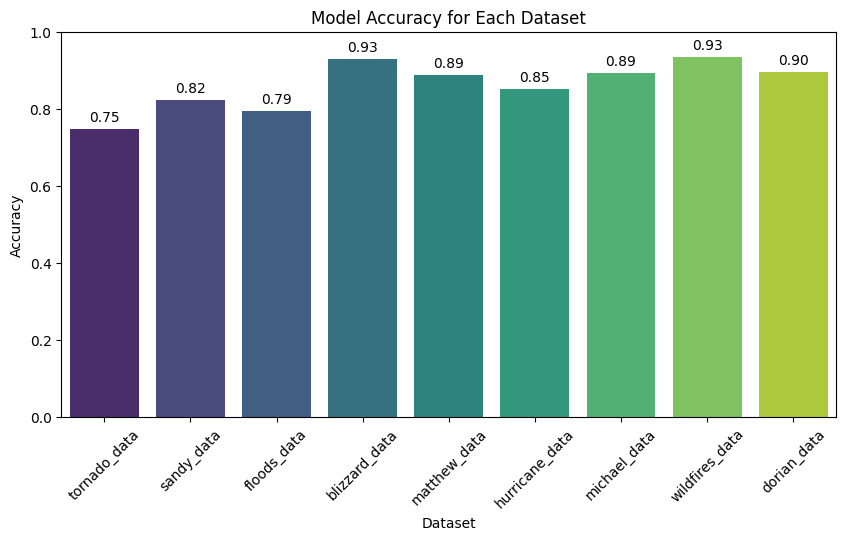

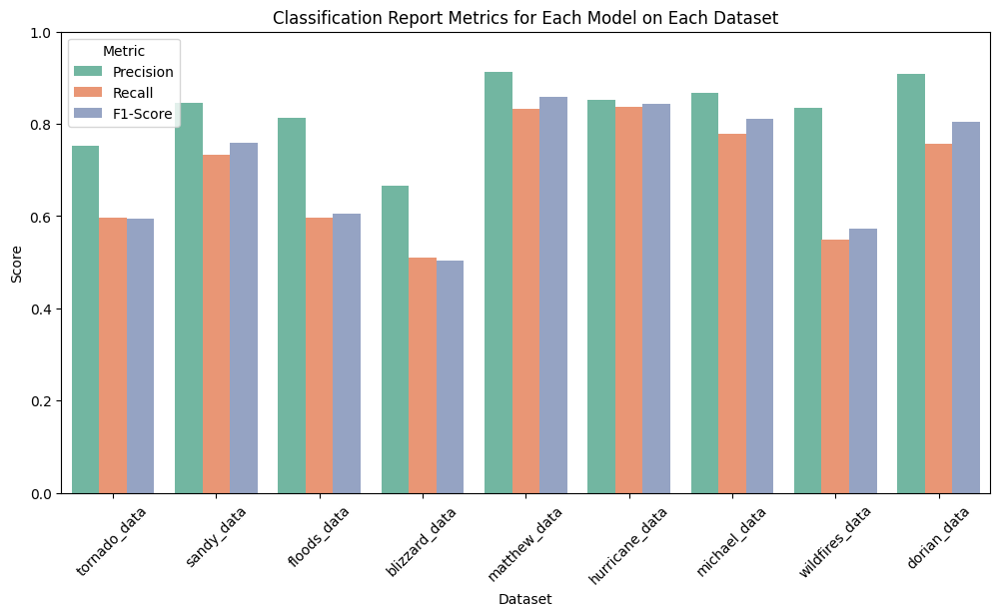

In [242]:
for dataset_name, metrics in results.items():
    cm = metrics['confusion_matrix']
    model_name = metrics['model_name']
    report = metrics['classification_report']
    
    # Plot confusion matrix
    plot_confusion_heatmap(cm, dataset_name, model_name)
    # Plot classification report
    plot_classification_report_heatmap(report, dataset_name, model_name)
    
    
# Plot accuracy for each dataset
plot_accuracy(results)

# Plot classification report metrics for each dataset
plot_classification_report(results)


## Model Tuning and Optimization

### A. Model Tuning and Optimization for Logistic Regression

In [243]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

### SMOTE To over sampling
### SMOTE works by generating synthetic examples of the minority class, which helps balance the dataset,

### Smote helps to over sample data and it helps model to learn more about positive labels so it can make better predictions
### It helps to reduce Type 2 Error(False Negative Labels) and increase true positive labels. 

In [244]:
vectorizer = TfidfVectorizer()
model = LogisticRegression(max_iter=1000)
sampler = SMOTE(random_state=42)
param_grid = {
    'C': [0.01, 0.1, 1, 10],
    'penalty': ['l2'],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 200]
}


#### When the grid search is called with various params, it chooses the one with the highest score based on the given scorer func. Best estimator gives the info of the params that resulted in the highest score.

In [245]:
# using Logistic Regression
from sklearn.linear_model import LogisticRegression
results = {}
for name, data in data_dict.items():
    model = LogisticRegression(max_iter=1000)
    results[name] = train_and_evaluate_model(
                    model=model,
                    dataset_name=name,
                    data=data,
                    model_name="Logistic Regression",
                    label_map={'negative': 1, 'positive': 0},
                    test_size=0.33,
                    random_state=42,
                    sampler=sampler,
                    param_grid=param_grid
                )



/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The ma

Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The ma

Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The ma

Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The ma

Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=10, solver='saga')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')
Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=10, solver='saga')
Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The ma

Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression(C=10, solver='saga')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The ma

Best parameters found by GridSearchCV for Logistic Regression: {'C': 10, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}
LogisticRegression(C=10, solver='liblinear')


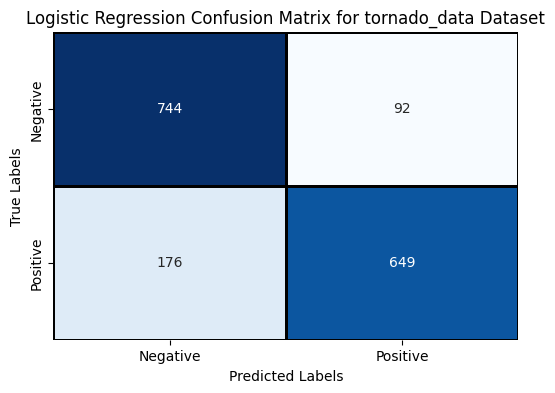

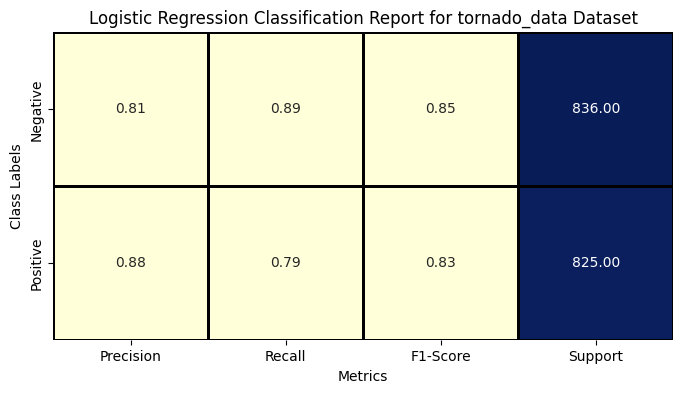

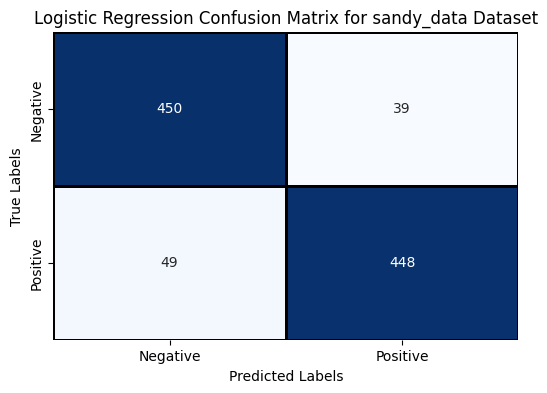

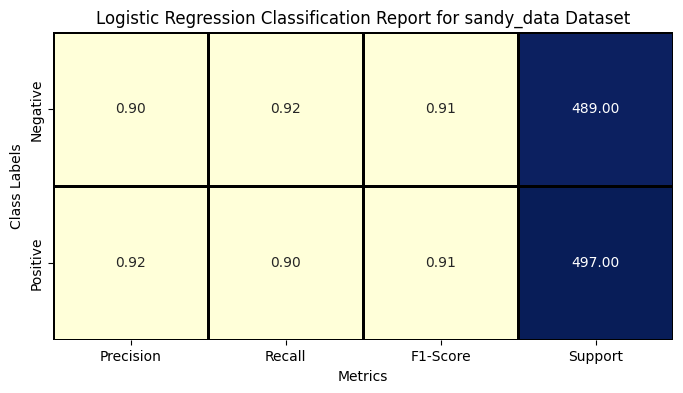

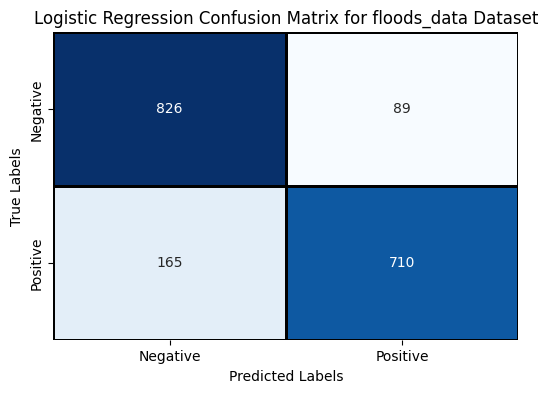

...

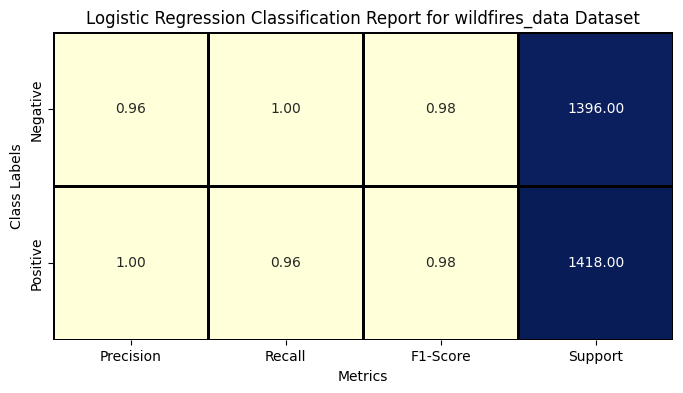

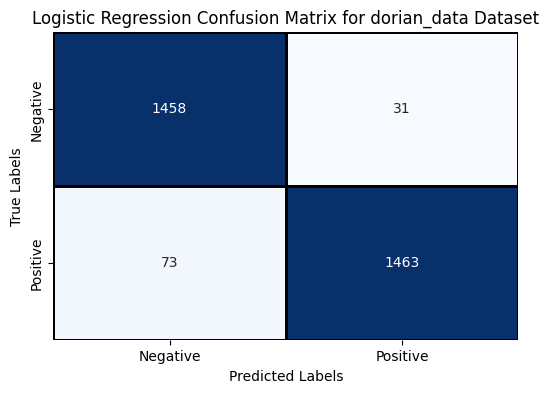

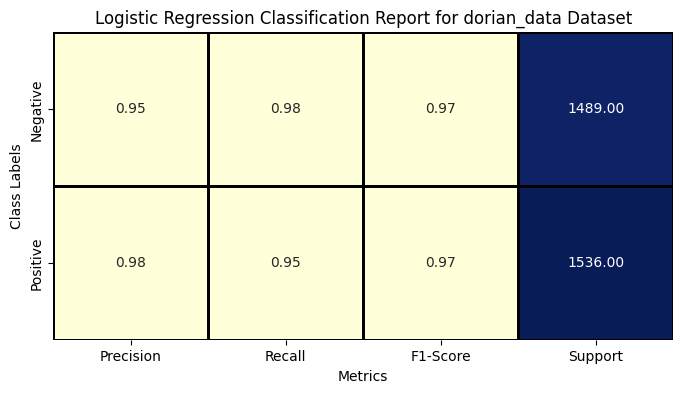

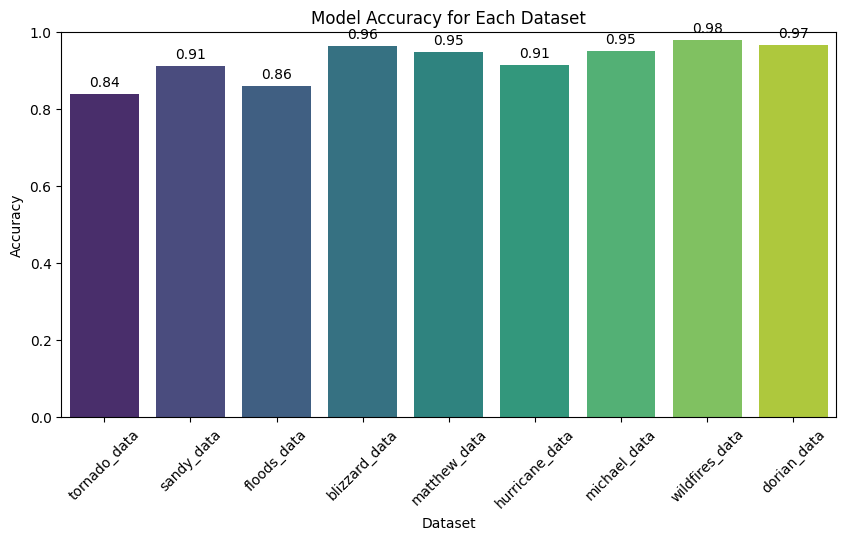

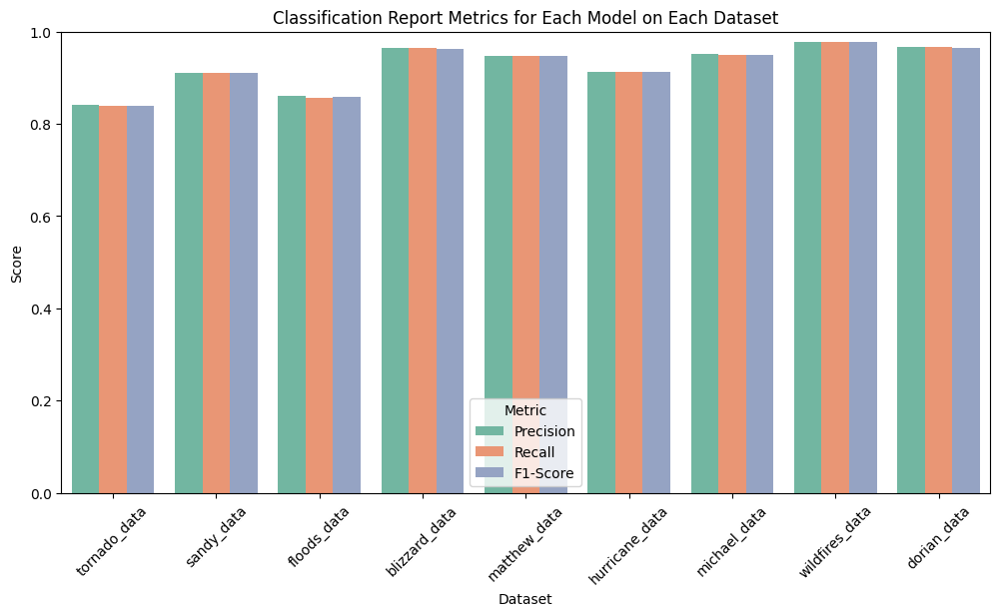

In [247]:
for dataset_name, metrics in results.items():
    cm = metrics['confusion_matrix']
    model_name = metrics['model_name']
    report = metrics['classification_report']
    
    # Plot confusion matrix
    plot_confusion_heatmap(cm, dataset_name, model_name)
    # Plot classification report
    plot_classification_report_heatmap(report, dataset_name, model_name)
    
    
# Plot accuracy for each dataset
plot_accuracy(results)

# Plot classification report metrics for each dataset
plot_classification_report(results)


### Random Forest Regressor

In [248]:
## hyper parameters for Random Forest Classifier
# hyperparameters = {
#                    'n_estimators': 100, 
#                    'max_depth': 10,
#                    'criterion':'gini',
#                    'min_samples_split':2,
#                    'bootstrap':True,
#                    }
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy'],
}



In [249]:
# using RandomForest Regressior
from sklearn.ensemble import RandomForestClassifier
results = {}
for name, data in data_dict.items():
    model = RandomForestClassifier()
    results[name] = train_and_evaluate_model(
                    model=model,
                    dataset_name=name,
                    data=data,
                    model_name="RandomForest",
                    label_map={'negative': 1, 'positive': 0},
                    test_size=0.33,
                    random_state=42,
                    sampler=sampler,
                    hyperparameters=hyperparameters,
                    param_grid = param_grid
                )
 

Best parameters found by GridSearchCV for RandomForest: {'criterion': 'entropy', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 500}
RandomForestClassifier(criterion='entropy', max_depth=8, max_features='log2',
                       n_estimators=500)
Best parameters found by GridSearchCV for RandomForest: {'criterion': 'gini', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 500}
RandomForestClassifier(max_depth=8, max_features='log2', n_estimators=500)
Best parameters found by GridSearchCV for RandomForest: {'criterion': 'gini', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 200}
RandomForestClassifier(max_depth=8, n_estimators=200)
Best parameters found by GridSearchCV for RandomForest: {'criterion': 'entropy', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 500}
RandomForestClassifier(criterion='entropy', max_depth=8, max_features='log2',
                       n_estimators=500)
Best parameters found by GridSearchCV for RandomForest: {'criterion': '

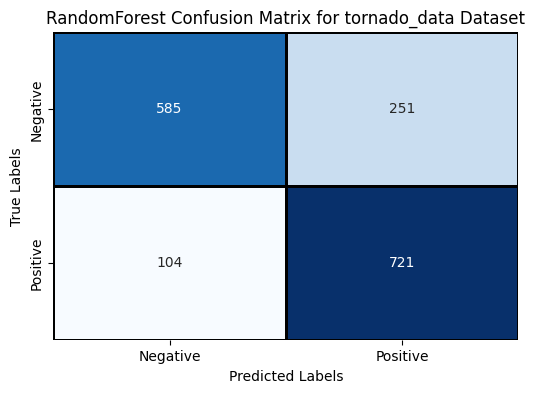

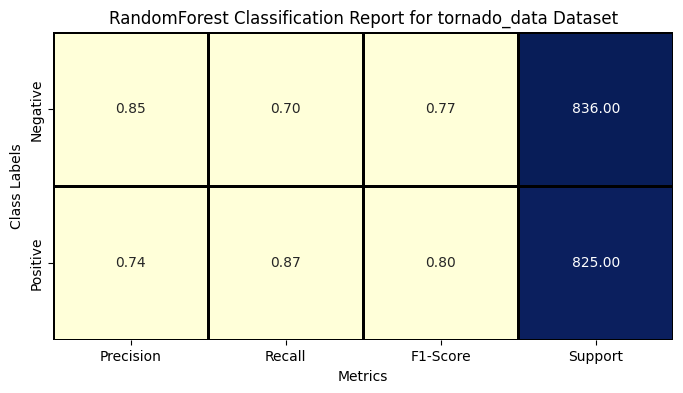

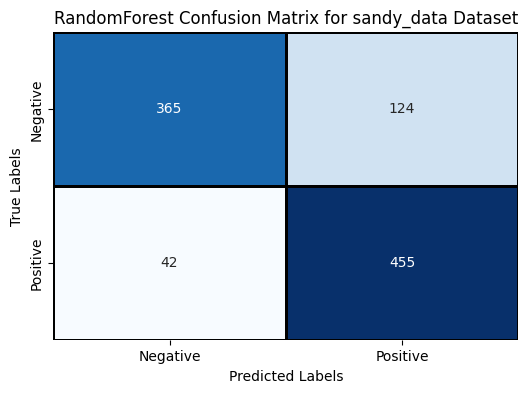

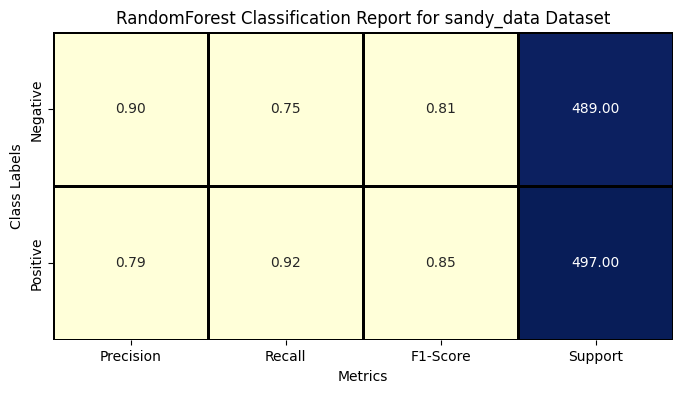

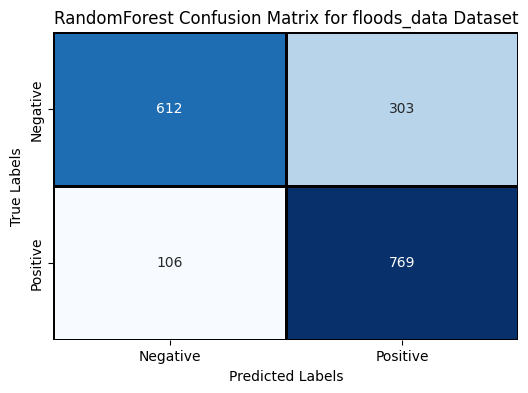

...

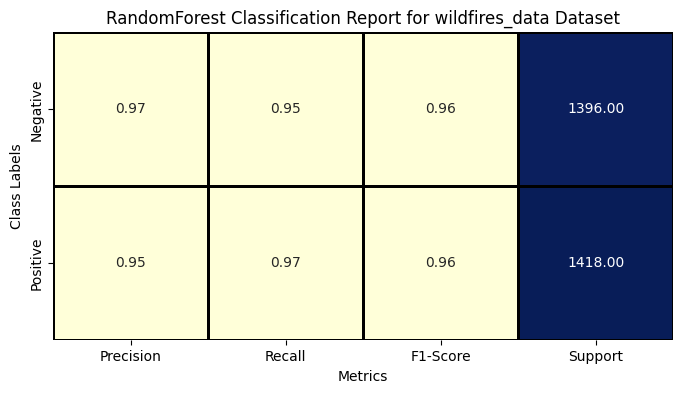

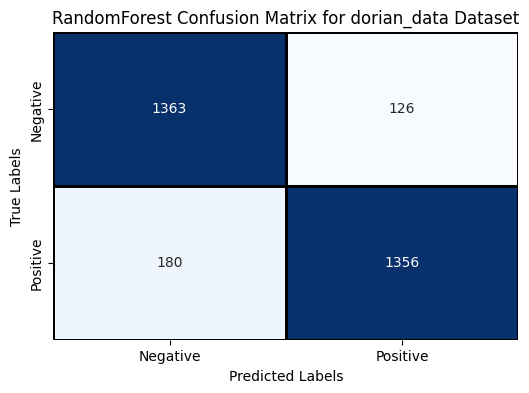

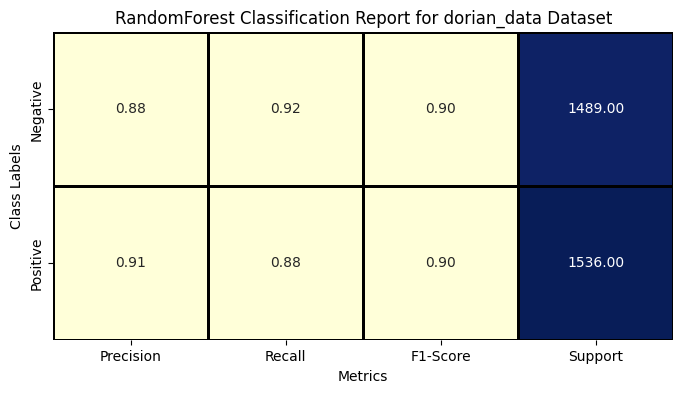

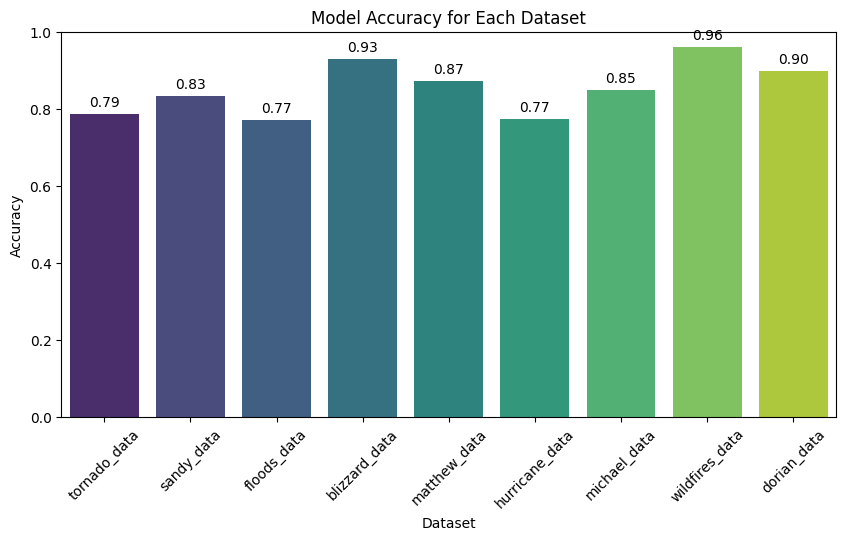

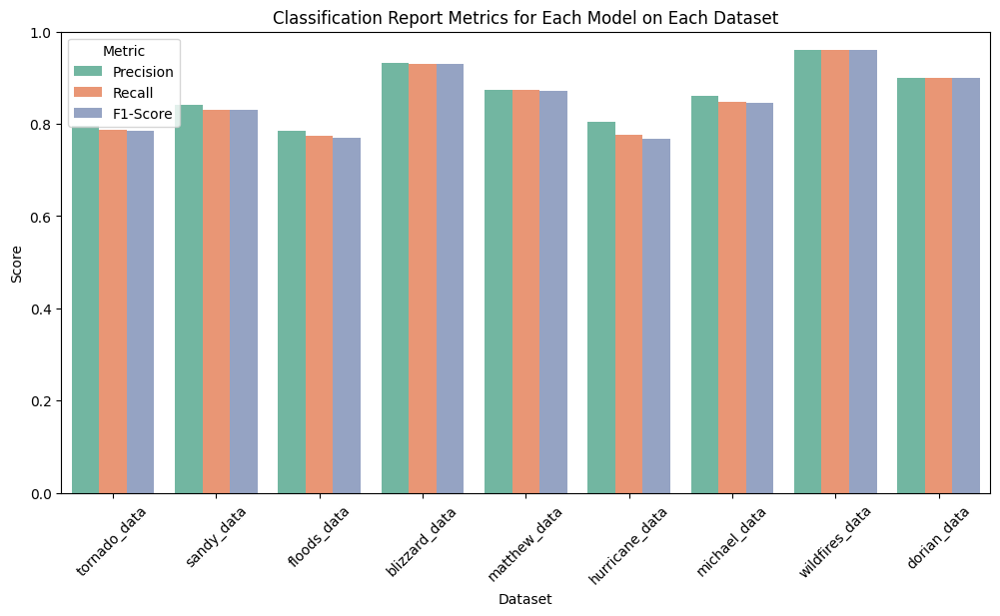

In [251]:
for dataset_name, metrics in results.items():
    cm = metrics['confusion_matrix']
    model_name = metrics['model_name']
    report = metrics['classification_report']
    
    # Plot confusion matrix
    plot_confusion_heatmap(cm, dataset_name, model_name)
    # Plot classification report
    plot_classification_report_heatmap(report, dataset_name, model_name)
    
    
# Plot accuracy for each dataset
plot_accuracy(results)

# Plot classification report metrics for each dataset
plot_classification_report(results)
